# Load data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import math
import re
import sys

import time
import torch
import torch.hub
import torch.nn

import random

# from pred_utils import balanced_over_sampling

In [2]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

## Build MLPs

In [3]:
class Dataset(torch.utils.data.Dataset):
    """Self-defined dataset."""

    def __init__(self, indexes, data_dict, labels_long):
        """
        Args:
            indexes: shared indexes across different datasets
        """
        self.indexes = indexes
        self.keys = data_dict.keys()
        self.data_dict = data_dict
        self.labels_long = labels_long

    def __len__(self):
        """Denotes the number of samples"""
        return len(self.indexes)

    def __getitem__(self, idx):
        """
        Generate one batch of data.
        """
        # Generate indexes of the batch
        data_index = self.indexes[idx]
    
        # Generate data and target
        data= dict()
        for key in self.keys:
            data[key] = torch.tensor(self.data_dict[key].loc[data_index, :].values)
        target = torch.LongTensor(self.labels_long)[idx]
        return data, target
    

In [4]:
# train function
from utils_eval import AverageMeter

def train(epoch, model, criterion, optimizer, train_loader, n_out_features, 
          gradient_clip=10, device='cuda:0'):
    """
    One epoch training
    """
    
    model.train()
    losses = dict()
    for key in model.keys:
        losses[key] = AverageMeter()
    
    for batch_idx, (data, target) in enumerate(train_loader):
        
        batch_size = data[list(data.keys())[0]].size(0)
        for key in data.keys():
            data[key] = data[key].float().to(device)
        target = target.to(device)

        # ===================forward=====================
        outputs = model(data)
        loss = dict()
        for key in data.keys():
            optimizer[key].zero_grad()
            loss[key] = criterion(outputs[key], target)

            # ===================backward=====================
            loss[key].backward()
            model_one_omics = getattr(model, key)
            torch.nn.utils.clip_grad_norm_(model_one_omics.parameters(), gradient_clip)
            optimizer[key].step()
        
        # ===================meters=====================
        loss_return = dict()
        for key in data.keys():
            losses[key].update(loss[key].item(), batch_size)
            loss_return[key] = losses[key].avg
    
    return loss_return

In [5]:
class MultilayerPerceptron:
    def __init__(self, covariate, indexes, multi_omics_dict, df_with_covariates,
                 standardize=True, root_folder='./save_MLP', random_seed=123, device='cuda:0'):
        self.covariate = covariate
        self.keys = multi_omics_dict.keys()
        self.indexes = indexes
        self.random_seed = random_seed
        self.device = device
        self.df_with_covariates = df_with_covariates
        self.root_folder = root_folder

        self.multi_omics_dict = multi_omics_dict.copy()
        if standardize:
            for key in self.keys:
                from sklearn.preprocessing import StandardScaler
                standardized_array = StandardScaler().fit_transform(multi_omics_dict[key])
                standardized_df = pd.DataFrame(standardized_array, index=multi_omics_dict[key].index, 
                                        columns=multi_omics_dict[key].columns)
                self.multi_omics_dict[key] = standardized_df
        self.indexes_no_ukn = self._remove_na_indexes()
        self.labels = df_with_covariates.loc[self.indexes_no_ukn, covariate]
    
    def _remove_na_indexes(self, remove_unknown=True):
        if remove_unknown:
            ### Remove rows with missing value
            all_labels = self.df_with_covariates.loc[self.indexes, self.covariate].values
            idx_ukn = np.where(np.isin(all_labels, ['Unknown', 'unknown']))[0]
            indexes_no_ukn = np.delete(np.array(self.indexes), idx_ukn)
        else:
            indexes_no_ukn = indexes
        return indexes_no_ukn
    
    def _stratified_split(self, train_val_p=[0.7, 0.15]):
        np.random.seed(self.random_seed)
        random.seed(self.random_seed)

        unique_labels = np.unique(self.labels)
        indexes_train, indexes_val, indexes_test = [], [], []
        for one_label in unique_labels:
            onecate_idx = np.where(self.labels==one_label)[0]
            onecate_indexes = np.array(self.indexes_no_ukn)[onecate_idx]
            onecate_indexes_train = np.random.choice(onecate_indexes, int(len(onecate_indexes) * train_val_p[0]), 
                                                     replace=False)
            onecate_indexes_not_train = [_ for _ in onecate_indexes if _ not in onecate_indexes_train]
            onecate_indexes_val = np.random.choice(onecate_indexes_not_train, int(len(onecate_indexes) * train_val_p[1]), 
                                                   replace=False)
            onecate_indexes_test = [_ for _ in onecate_indexes_not_train if _ not in onecate_indexes_val]
            indexes_train.extend(onecate_indexes_train)
            indexes_val.extend(onecate_indexes_val)
            indexes_test.extend(onecate_indexes_test)
        return np.random.permutation(indexes_train), \
               np.random.permutation(indexes_val), \
               np.random.permutation(indexes_test)
    
    def initialize(self, net_dict, batch_size=32,
                   dropout_rate=0.4, weight_decay=0.01, lr=0.001, momentum=0.9):
        print('\n{}'.format(self.covariate))
        self.n_out_features = len(np.unique(self.labels))
        self.dropout_rate = dropout_rate
        self.weight_decay = weight_decay
        
        torch.manual_seed(self.random_seed)
        np.random.seed(self.random_seed)
        random.seed(self.random_seed)
        #torch.set_deterministic(True)
        if torch.cuda.is_available():
            torch.cuda.manual_seed_all(self.random_seed)
            
        self.indexes_split = self._stratified_split()
        indexes_train, indexes_val, indexes_test = self.indexes_split
        print("n train: {}\nn val: {}\nn test: {}".format(len(indexes_train), len(indexes_val), len(indexes_test)))
        
        from sklearn.preprocessing import LabelEncoder
        le = LabelEncoder()
        le.fit(self.labels)
        self.classes = le.classes_
        
        # Generator
        train_set = Dataset(indexes_train, self.multi_omics_dict, 
                            le.transform(self.df_with_covariates.loc[indexes_train, self.covariate]))
        val_set = Dataset(indexes_val, self.multi_omics_dict,
                          le.transform(self.df_with_covariates.loc[indexes_val, self.covariate]))
        
        if len(indexes_train)%batch_size==1:
            self.train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size, 
                                                       shuffle=True, num_workers=0, drop_last=True)
        else:
            self.train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size, 
                                                       shuffle=True, num_workers=0)
        self.val_loader = torch.utils.data.DataLoader(val_set, batch_size=batch_size, shuffle=False, num_workers=0)

        # Set model
        from mbsupcon import Encoder
        self.model = Encoder(net_dict = net_dict, n_out_features=self.n_out_features, 
                        dropout_rate=dropout_rate).to(self.device)
        self.criterion = torch.nn.CrossEntropyLoss() # nn.CrossEntropyLoss combines log_softmax and NLLLoss

        # Set optimizer
        self.optimizer = dict()
        for key in self.keys:
            self.optimizer[key] = torch.optim.SGD(getattr(self.model, key).parameters(), lr=lr, 
                                                  momentum=momentum, weight_decay=weight_decay)

    def train_mlp(self, n_epoch=1000, gradient_clip=3, print_hist=True):
        
        indexes_train, indexes_val, indexes_test = self.indexes_split
        self.n_epoch = n_epoch
    
        # =========================
        hist = dict()
        hist['loss'] = []
        hist['val_loss'] = []
        hist['run_time']  = []
        
        start_time = time.time()

        for epoch in range(n_epoch):
            # Train
            loss = train(epoch, self.model, self.criterion, self.optimizer,
                         self.train_loader, gradient_clip = gradient_clip, n_out_features=self.n_out_features,
                            device=self.device)
            hist['loss'].append(loss)

            # Val
            self.model.eval()

            losses_val = dict()
            for key in self.keys:
                losses_val[key] = AverageMeter()
            
            with torch.no_grad():
                for idx, (data, target) in enumerate(self.val_loader):
                    batch_size = data[list(data.keys())[0]].size(0)
                    for key in data.keys():
                        data[key] = data[key].float().to(self.device)
                    target_val = target.to(self.device)

                    # ===================forward=====================
                    outputs_val = self.model(data)
                   
                    loss_val_return = dict()
                    for key in self.keys:
                        loss_temp = self.criterion(outputs_val[key], target_val)
                        losses_val[key].update(loss_temp.item(), batch_size)
                        loss_val_return[key] = losses_val[key].avg

                hist['val_loss'].append(loss_val_return)
                if print_hist:
                    print('Epoch {}; \n  train_loss: {}; \n  test_loss:{}'.format(epoch, loss, loss_val_return))
                    
        end_time = time.time()

        hist['run_time'] = end_time - start_time
        self.hist = hist
        if print_hist:
            print('Training time (covariate={}, epoch={}): {}\n'.format(self.covariate, self.n_epoch, 
                                                                        end_time-start_time))
            
    def _plot_history(self, history, key, plot_attr, plot_labels, ylabel, title, save_name=None, 
                      figsize=(16,8), transparency=1, save=True):
        
        if isinstance(plot_attr, (str, tuple)):
            plot_attr = [plot_attr]
        if isinstance(plot_labels, (str, tuple)):
            plot_labels = [plot_labels]
        
        fig = plt.figure(figsize=figsize)
        
        for attr, label in zip(plot_attr, plot_labels):
            plot_data = [self.hist[attr][i][key] for i in range(len(self.hist[attr]))]
            plt.plot(np.arange(len(plot_data)), plot_data, 
                         label='{} - {}'.format(label, key), alpha=transparency)

        plt.xlabel('Epoches', fontsize=20)
        plt.ylabel(ylabel, fontsize=20)
        title_print = '{} - {} - {}\nseed: {}'.format(title, key, self.covariate, self.random_seed)
        
        plt.title(title_print, fontsize=20)
        plt.legend(fontsize=20)
        plt.show()
        
        if save:
            save_name_prefix = save_name if save_name is not None else plot_attr
            figure_save_folder = os.path.join(self.root_folder, 'figures/train_MLP/{}'.format(self.covariate))
            os.makedirs(figure_save_folder, exist_ok=True)

            fig.savefig(os.path.join(figure_save_folder, '{}_{}_epoch-{}_seed-{}.pdf'.\
                             format(save_name_prefix, self.covariate, self.n_epoch, self.random_seed)))
    
    def plot_training(self, save=True):
        for key in self.keys:
            self._plot_history(history=self.hist, key=key, plot_attr=['loss', 'val_loss'], 
                          plot_labels=['Training loss', 'Validation loss'],
                          ylabel='Loss', title='Loss curve', save_name='{}_train_val_losses'.format(key), 
                               save=save)

        
    def save_training(self):
        import pickle
        model_save_folder = os.path.join(self.root_folder, 'models/{}'.format(self.covariate))
        os.makedirs(model_save_folder, exist_ok=True)
        
        ### save model
        optimizer_state_dict_list = [getattr(self.optimizer, key).state_dict() for key in self.keys]
        torch.save({
                    'epoch': self.n_epoch,
                    'model_state_dict': self.model.state_dict(),
                    'optimizer_state_dict': optimizer_state_dict_list,
                    'history': self.hist
                    }, 
            os.path.join(model_save_folder, 'MLP_{}_epoch-{}_seed-{}.pth'.\
                         format(self.covariate, self.n_epoch, self.random_seed)))
            
    def _get_features(self, indexes):
        features_dict = dict()
        for key in self.keys:
            model_one_omics = getattr(self.model, key)
            _features = []
            for one_index in indexes:
                omics_data = self.multi_omics_dict[key].loc[one_index, :].values
                self.model.eval()
                with torch.no_grad():
                    _omics_feature = torch.tensor([omics_data]).float()
                    for i, _module in enumerate(list(model_one_omics.modules())[0]): # enumerate in ModuleList
                        _omics_feature = _module(torch.tensor([_omics_feature.squeeze().cpu().numpy()]).\
                                                   float().to(self.device))
                _features.append(_omics_feature.squeeze().cpu().numpy())
            features_dict[key] = pd.DataFrame(np.array(_features), index=indexes,
                                              columns=["Feature {}".format(i) for i in range(self.n_out_features)])
        return features_dict
    
    def _split_Xy(self, which_dataset_list=['train', 'val', 'test']):
        _split_Xy = dict()
        for omics_key in self.keys:
            _split_Xy[omics_key] = dict()
            for which_dataset in which_dataset_list:
                _embeddings_covariates_dict = self.embeddings_covariates_dict[which_dataset]
                indexes = _embeddings_covariates_dict['indexes']
                temp_X = self.multi_omics_dict[omics_key].loc[indexes, :]
                temp_y = _embeddings_covariates_dict['covariate']
                _split_Xy[omics_key][which_dataset] = temp_X, temp_y
        return _split_Xy
    
    def predict(self, save_embedding=True):
        
        indexes_set = (self.indexes_no_ukn,) + self.indexes_split
        embeddings_covariates_dict = dict.fromkeys(['all', 'train', 'val', 'test'])
        for which_dataset, idxes in zip(embeddings_covariates_dict.keys(), indexes_set):
            embeddings_covariates_dict[which_dataset] = dict()
            features_dict = self._get_features(idxes)
            embeddings_covariates_dict[which_dataset]['embedding'] = features_dict
            embeddings_covariates_dict[which_dataset]['covariate'] = self.df_with_covariates.loc[idxes, self.covariate]
            embeddings_covariates_dict[which_dataset]['indexes'] = idxes
        
        self.embeddings_covariates_dict = embeddings_covariates_dict
        
        if save_embedding:
            import pickle
            embedding_save_folder = os.path.join(self.root_folder, 'embeddings/{}'.format(self.covariate))
            os.makedirs(embedding_save_folder, exist_ok=True)

            with open(os.path.join(embedding_save_folder, 'embeddings_{}_epoch-{}_seed-{}.pkl').\
                  format(self.covariate, self.n_epoch, self.random_seed), 'wb') as f:
                pickle.dump(embeddings_covariates_dict, f)
            
        split_Xy_dict = self._split_Xy()

        result_dict = dict()
        for omics_key in self.keys:
            result_dict[omics_key] = dict()
            for vt_key in ['val', 'test']:
                X_vt, y_vt = split_Xy_dict[omics_key][vt_key]
                
                pred_embedding = np.array(self.embeddings_covariates_dict[vt_key]['embedding'][omics_key])
                pred_class = self.classes[torch.nn.Softmax(dim=1)(torch.tensor(pred_embedding)).argmax(axis=1)]
                accuracy = sum(pred_class==y_vt)/len(pred_class)
                
                from sklearn.metrics import confusion_matrix
                conf_mat = pd.DataFrame(confusion_matrix(y_vt, pred_class, labels=self.classes),
                                        index=['true: {}'.format(x) for x in self.classes],
                                        columns=['pred: {}'.format(x) for x in self.classes])

                result_dict[omics_key][vt_key] = accuracy, pred_embedding, pred_class, conf_mat
        return result_dict        


## 1 Prediction based on embeddings

## Load embedding and train MLPs with different random seeds

In [6]:
covariate_list = ['IR_IS_classification', 'Sex', 'Race']

dropout_list = np.arange(0.2, 1, 0.2)
weight_decay_list = 0.01*2.**np.linspace(-2,5,8)
temp_list = 0.5*2.**np.linspace(-2,2,5)

## From 1b-v - save and visualize the tuning results_random seeds_1-12
max_idx = dict(list(zip(covariate_list, [(2, 5, 1), (1, 4, 0), (0, 2, 0)])))


IR_IS_classification
n train: 382
n val: 81
n test: 84


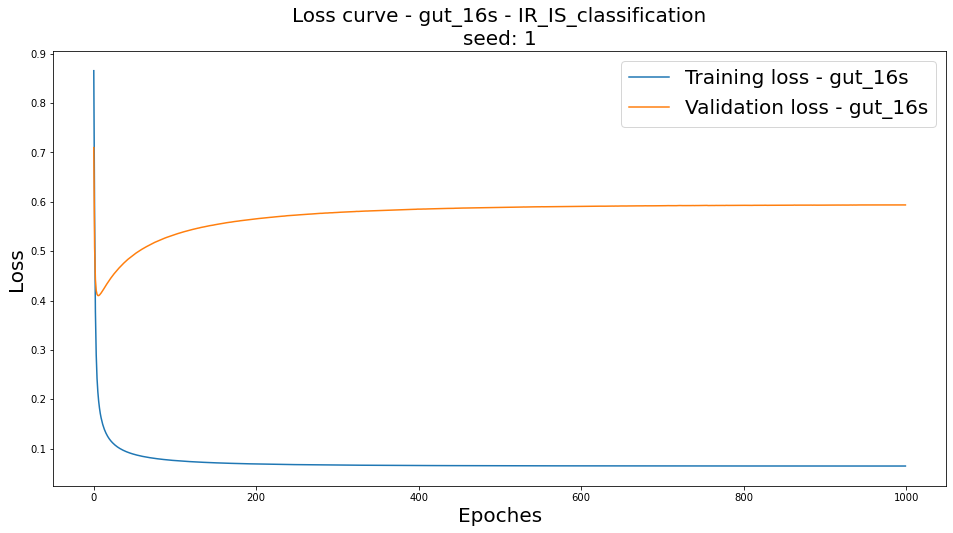

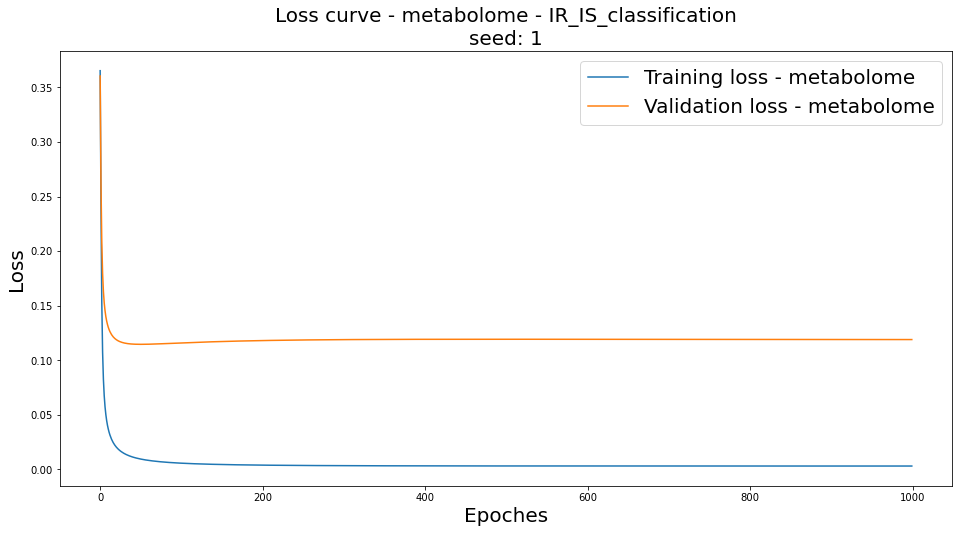


IR_IS_classification
n train: 382
n val: 81
n test: 84


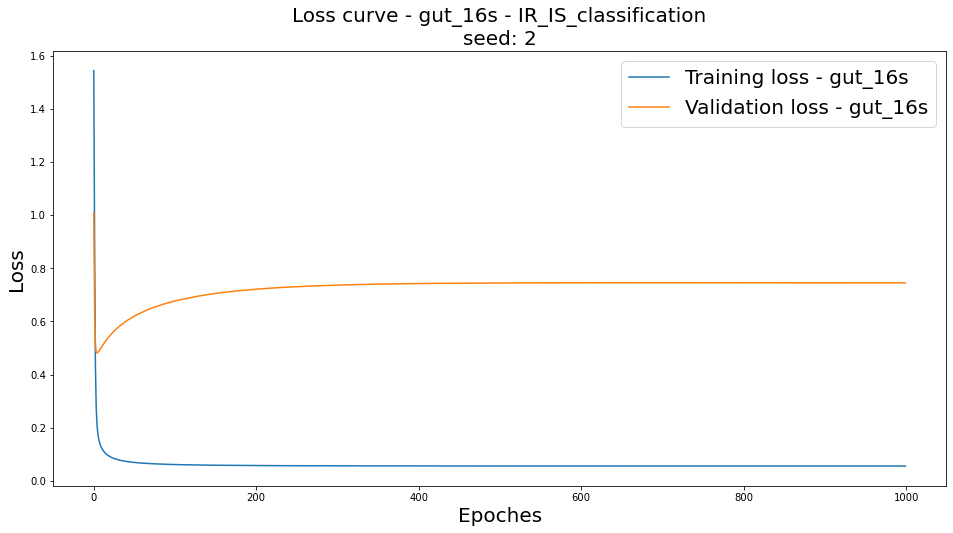

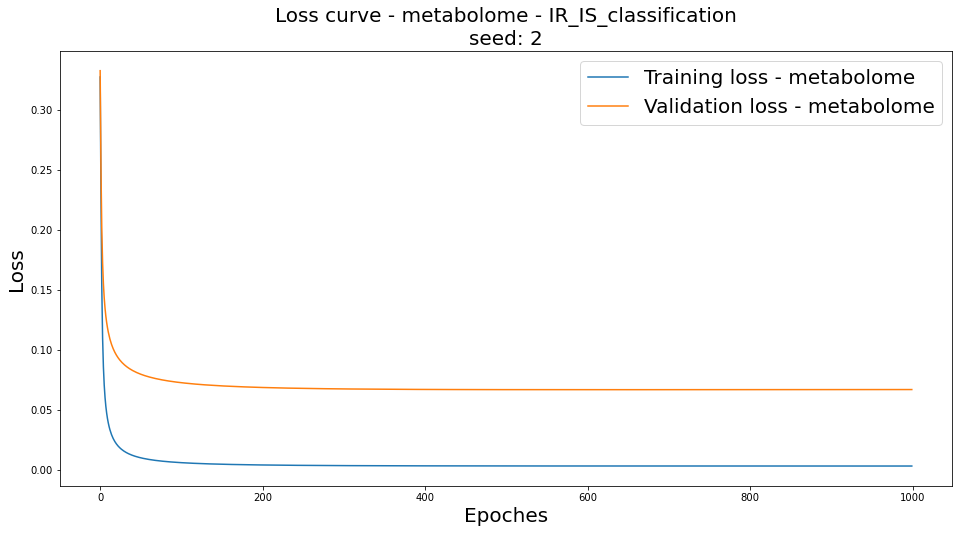


IR_IS_classification
n train: 382
n val: 81
n test: 84


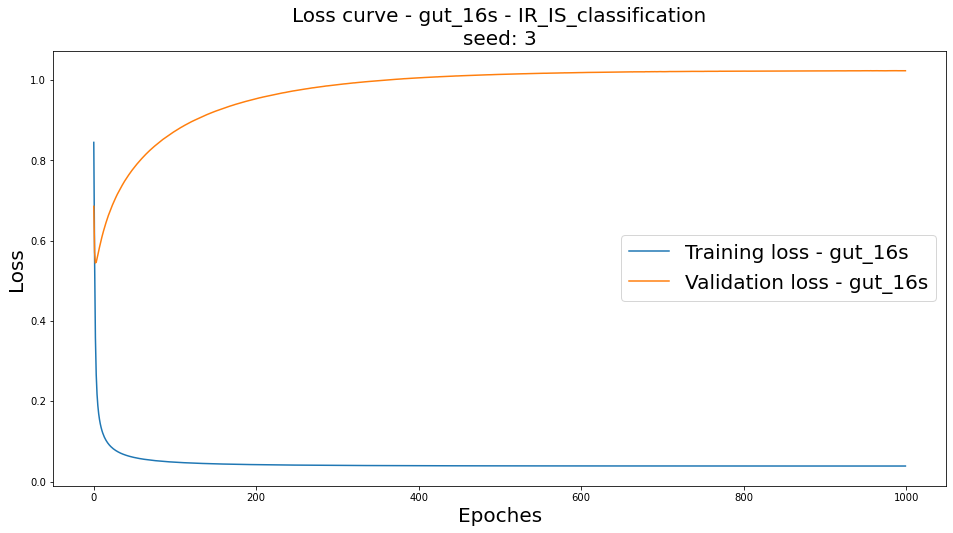

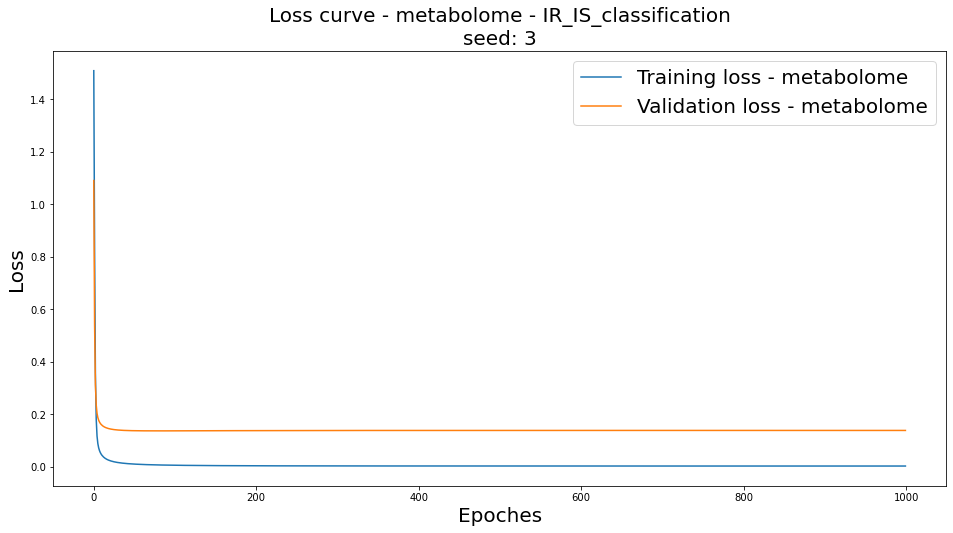


IR_IS_classification
n train: 382
n val: 81
n test: 84


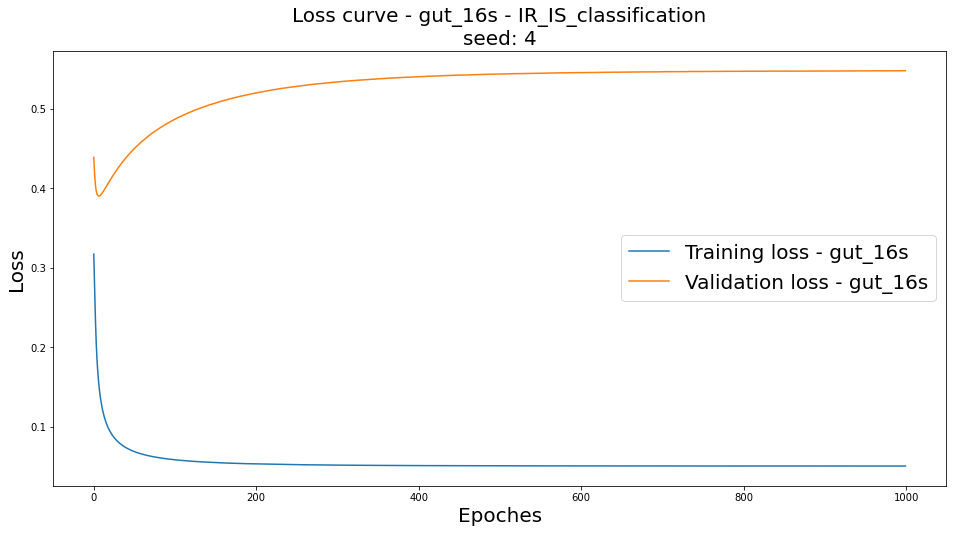

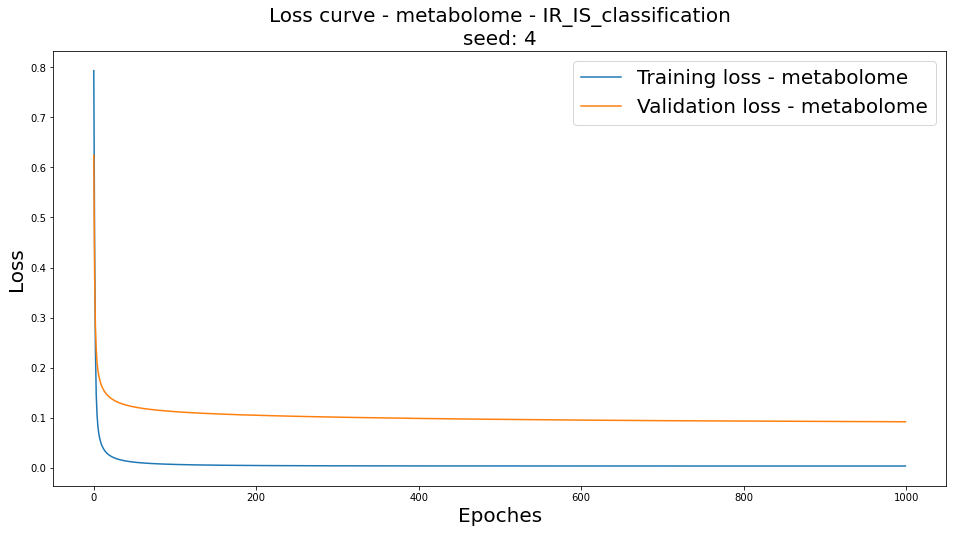


IR_IS_classification
n train: 382
n val: 81
n test: 84


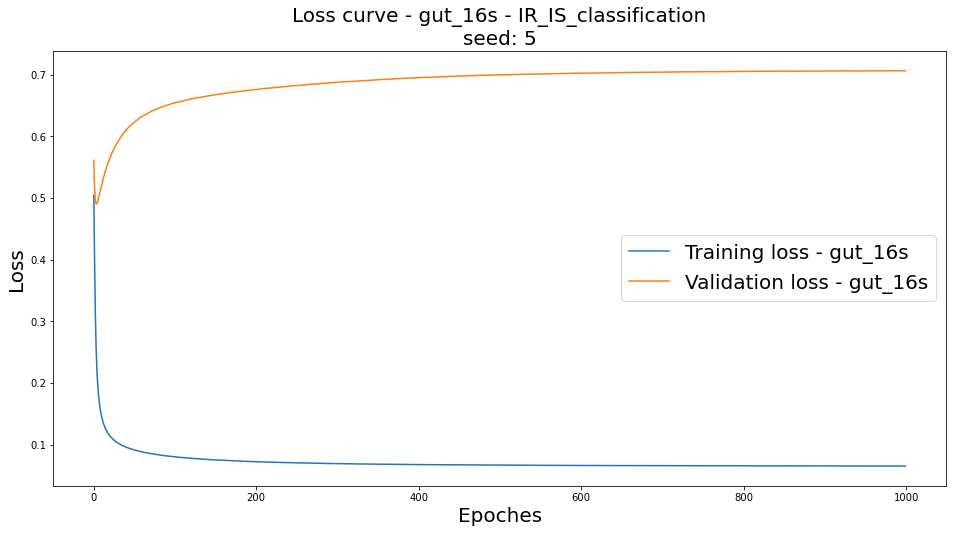

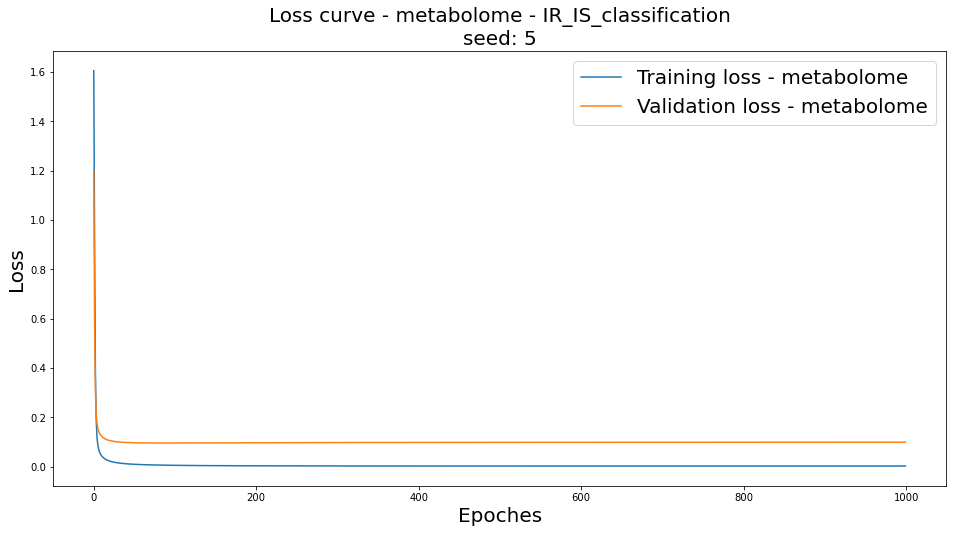


IR_IS_classification
n train: 382
n val: 81
n test: 84


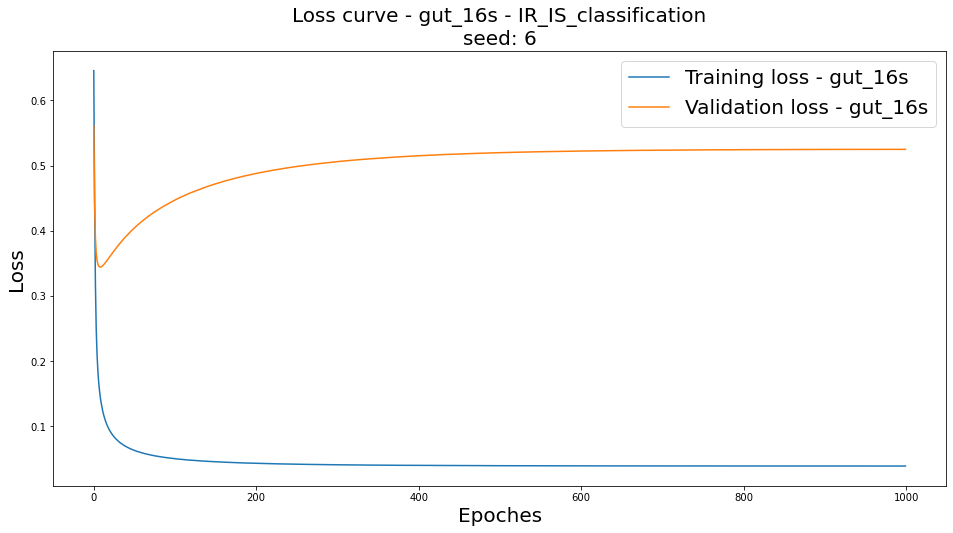

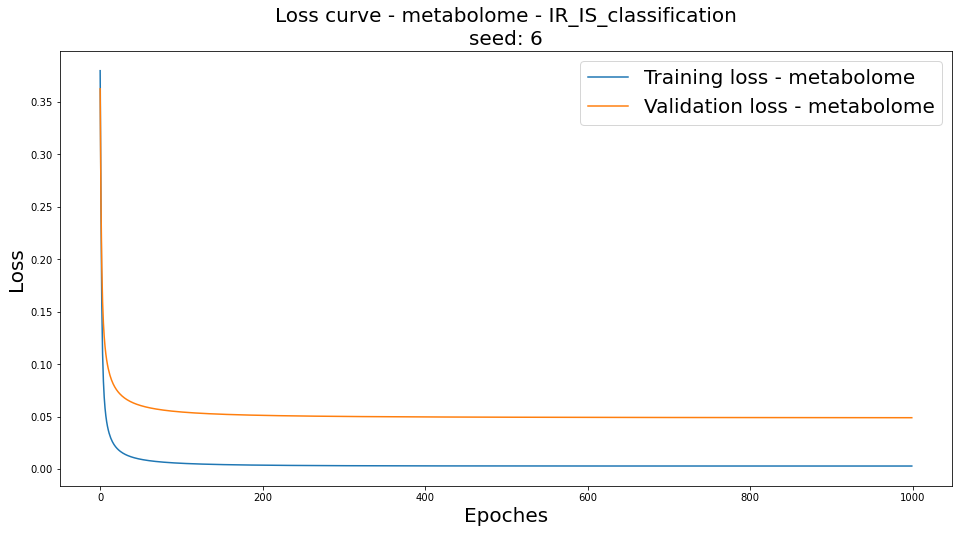


IR_IS_classification
n train: 382
n val: 81
n test: 84


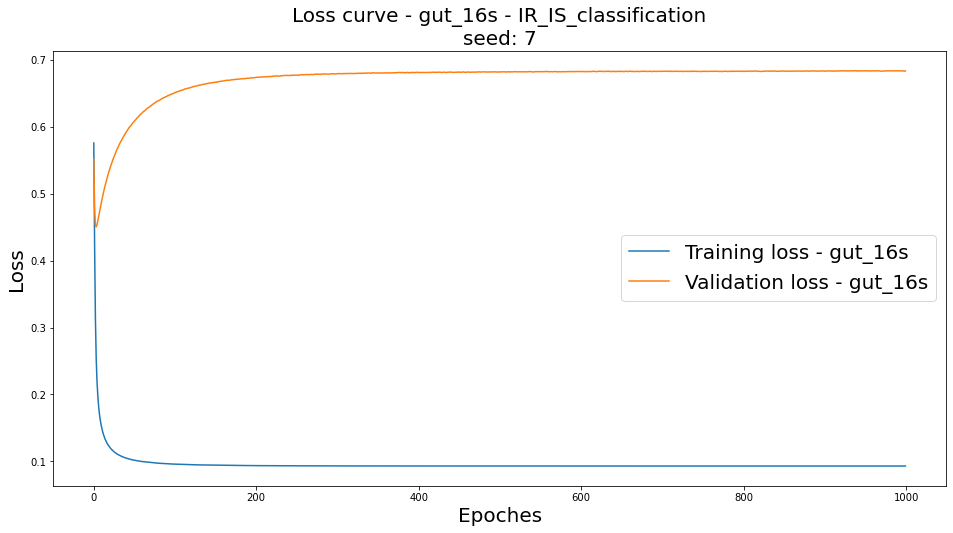

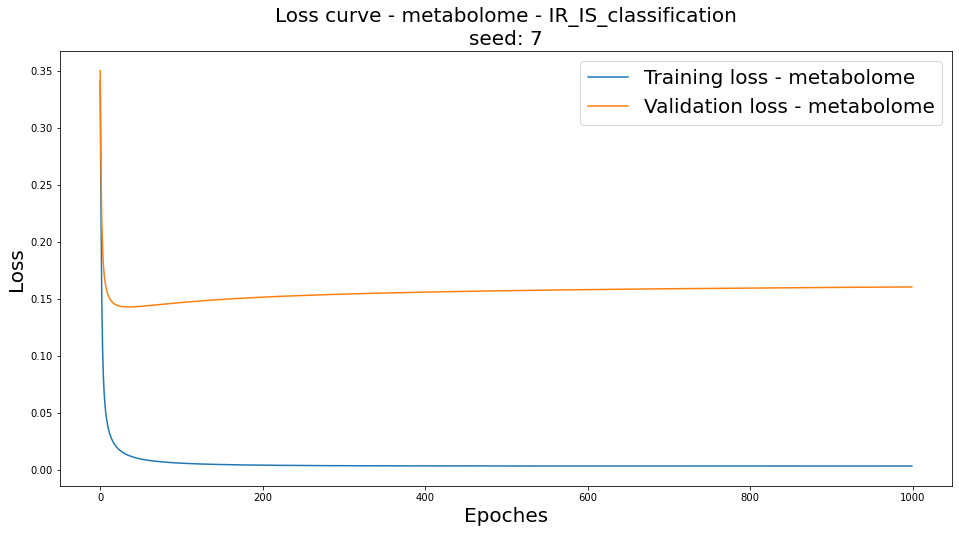


IR_IS_classification
n train: 382
n val: 81
n test: 84


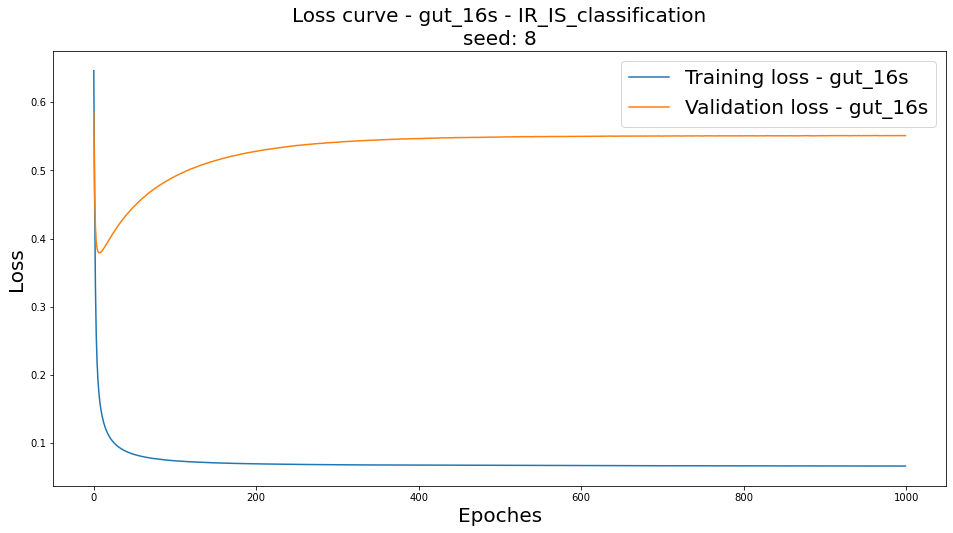

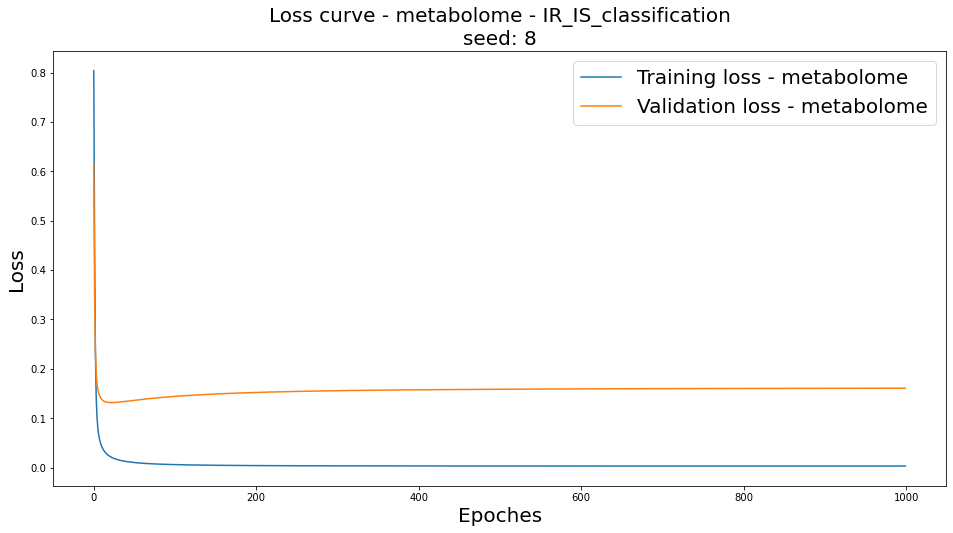


IR_IS_classification
n train: 382
n val: 81
n test: 84


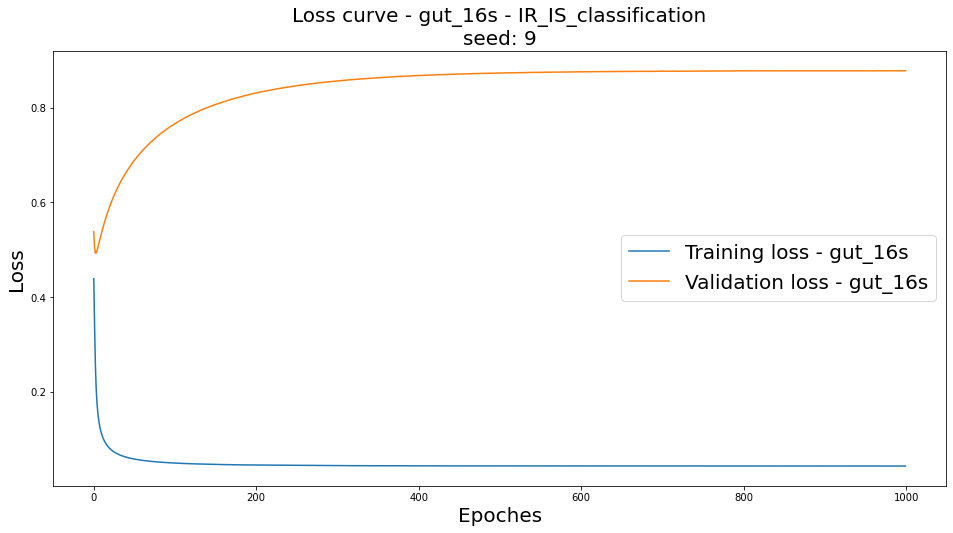

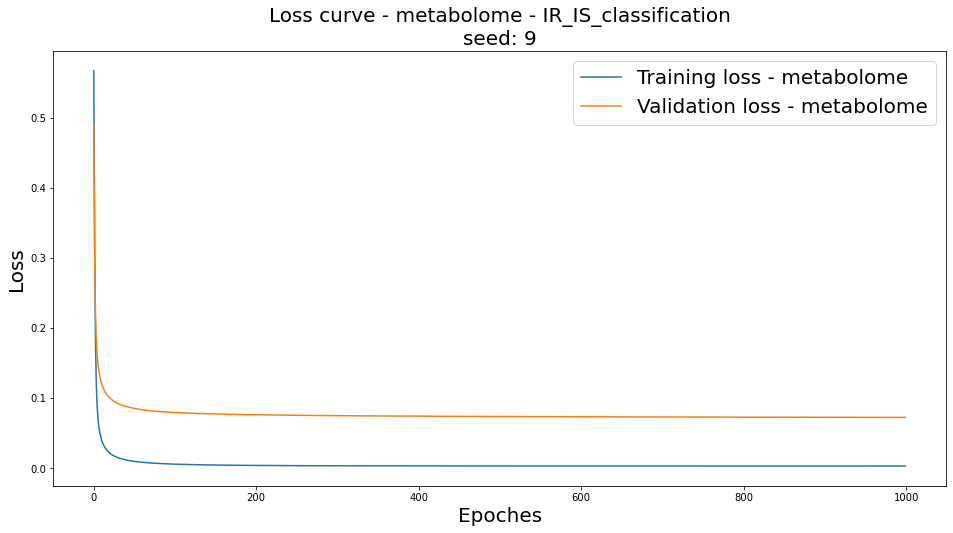


IR_IS_classification
n train: 382
n val: 81
n test: 84


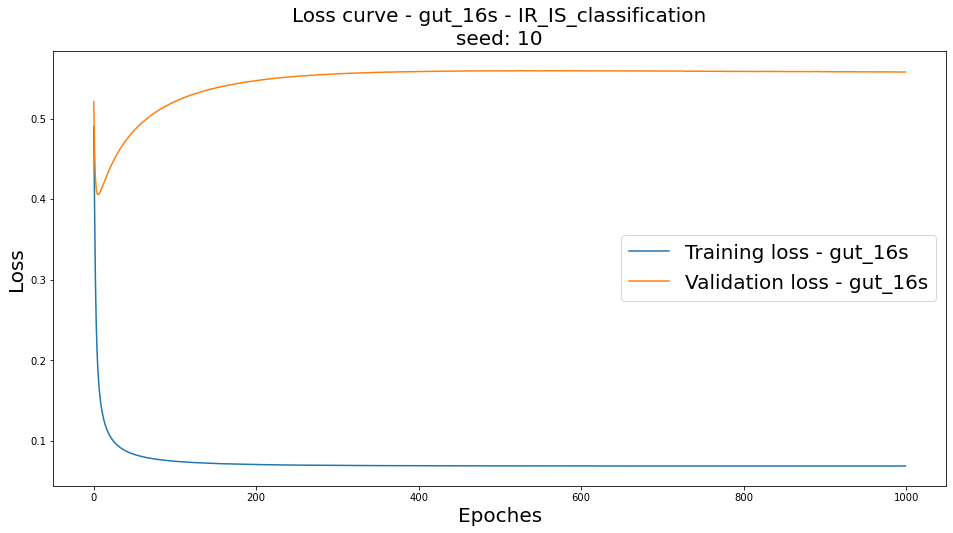

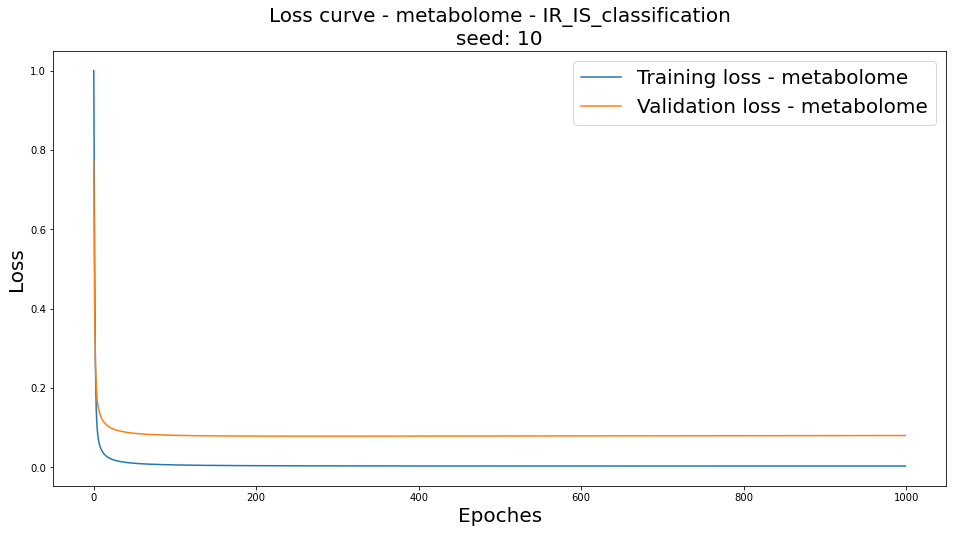


IR_IS_classification
n train: 382
n val: 81
n test: 84


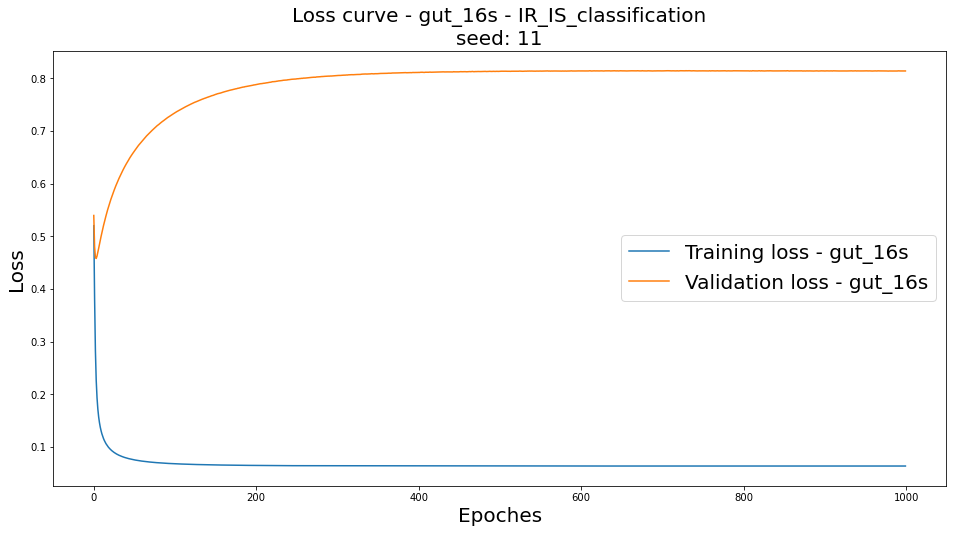

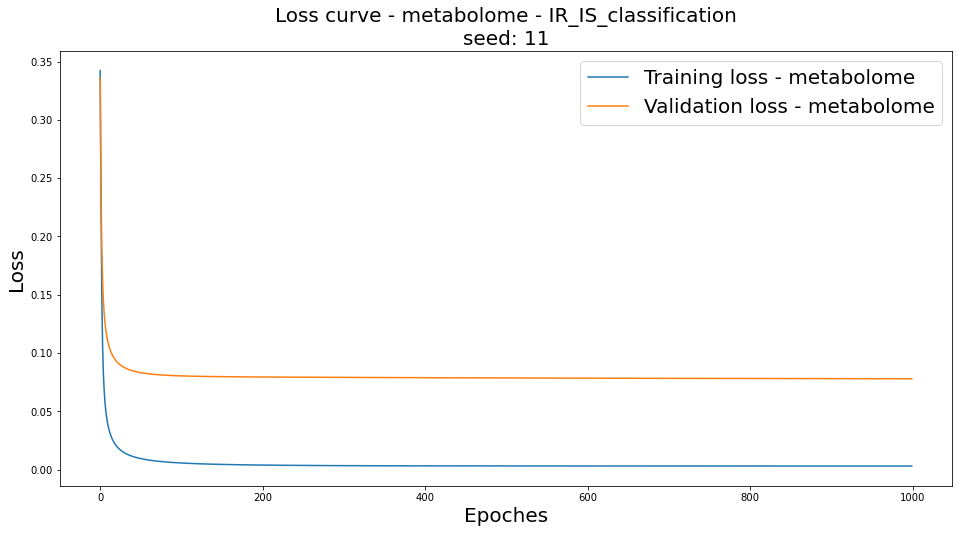


IR_IS_classification
n train: 382
n val: 81
n test: 84


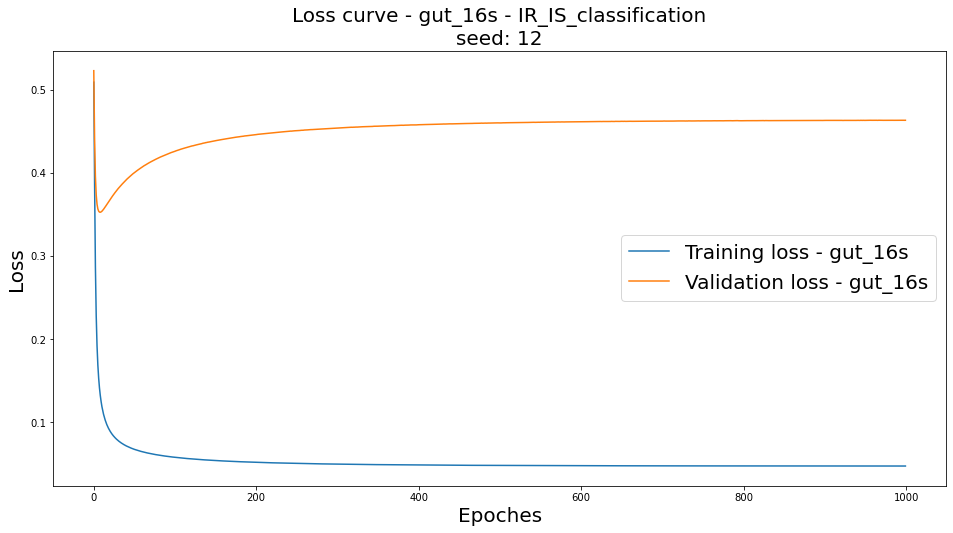

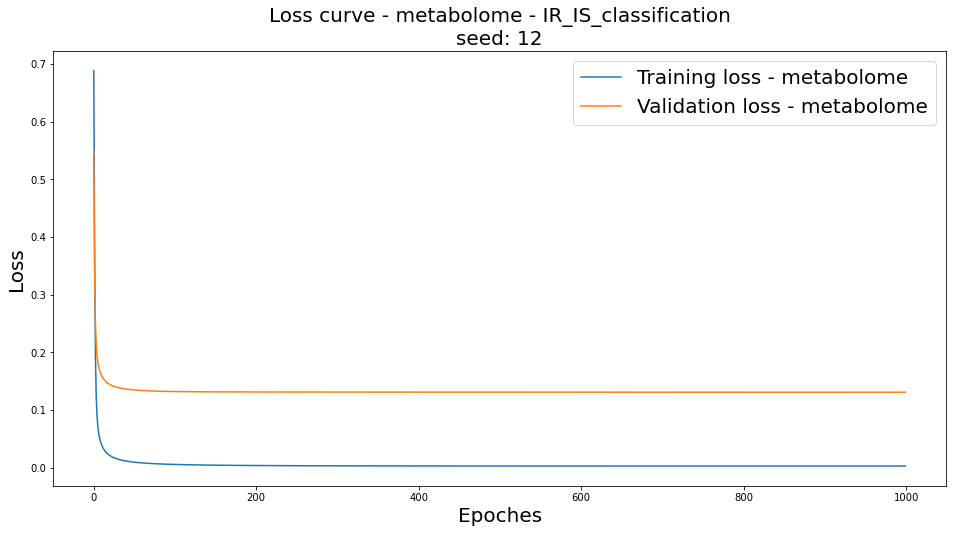

Covariate: IR_IS_classification
Prediction based on the embedding of microbiome data:


,Validation,Testing
1,81.48%,85.71%
2,80.25%,85.71%
3,75.31%,89.29%
4,85.19%,80.95%
5,81.48%,79.76%
6,86.42%,82.14%
7,82.72%,85.71%
8,85.19%,91.67%
9,81.48%,82.14%
10,82.72%,84.52%


------------------------------------------------------------------
Prediction based on the embedding of metabolome data:


,Validation,Testing
1,96.30%,95.24%
2,97.53%,89.29%
3,93.83%,100.00%
4,97.53%,97.62%
5,95.06%,96.43%
6,98.77%,97.62%
7,92.59%,96.43%
8,96.30%,96.43%
9,98.77%,98.81%
10,98.77%,97.62%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


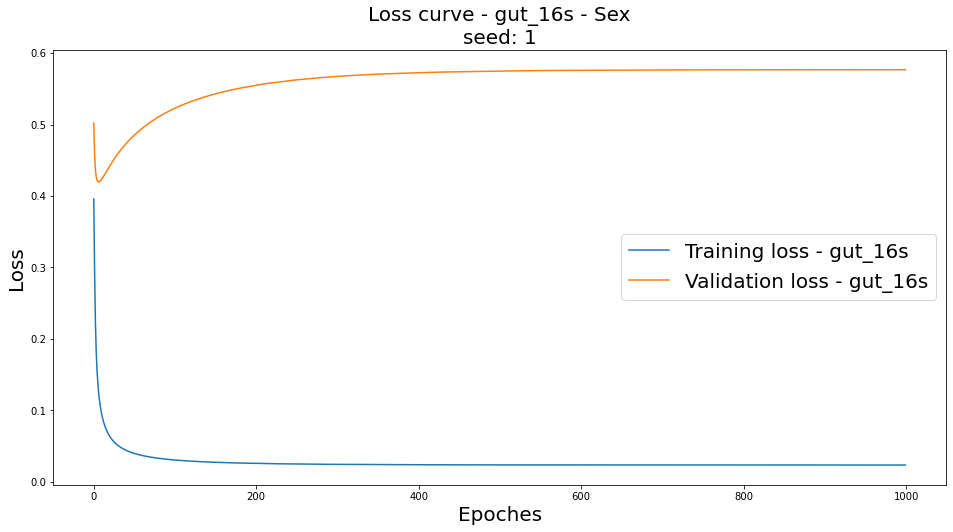

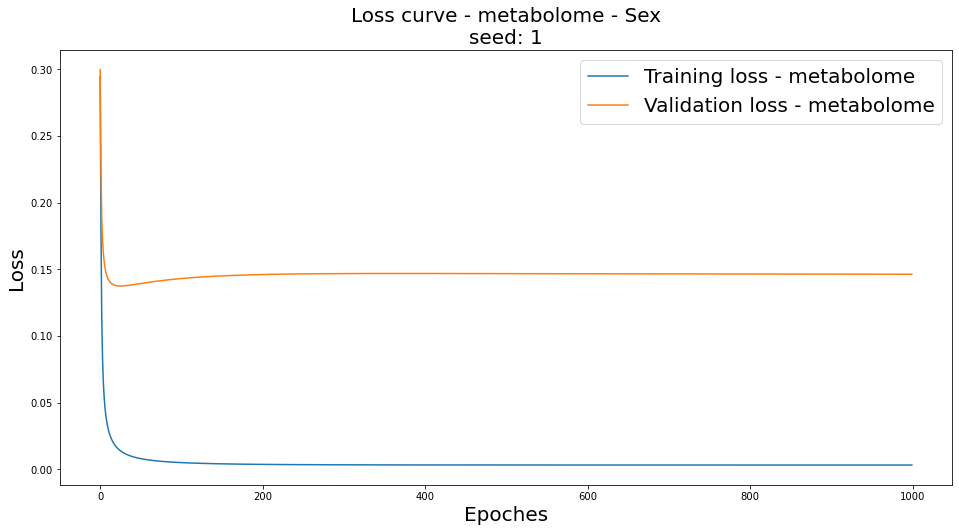


Sex
n train: 503
n val: 107
n test: 110


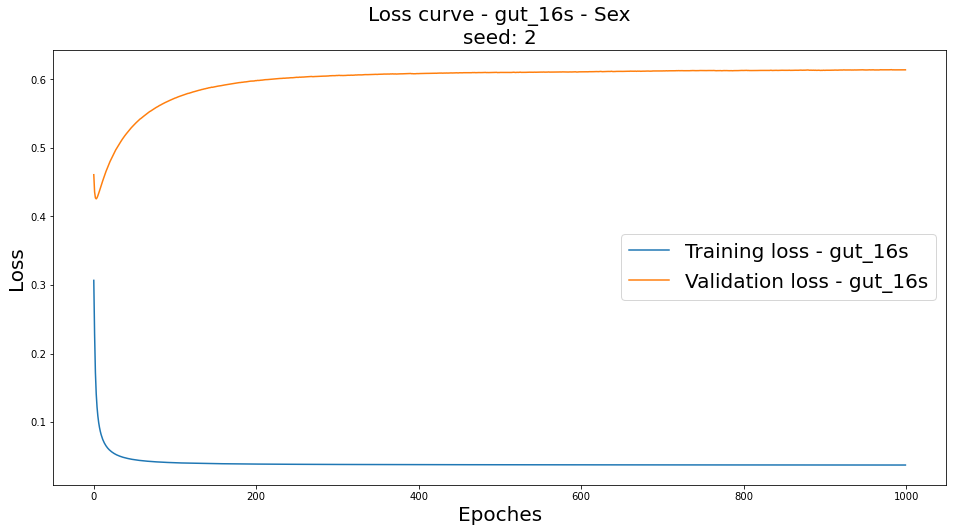

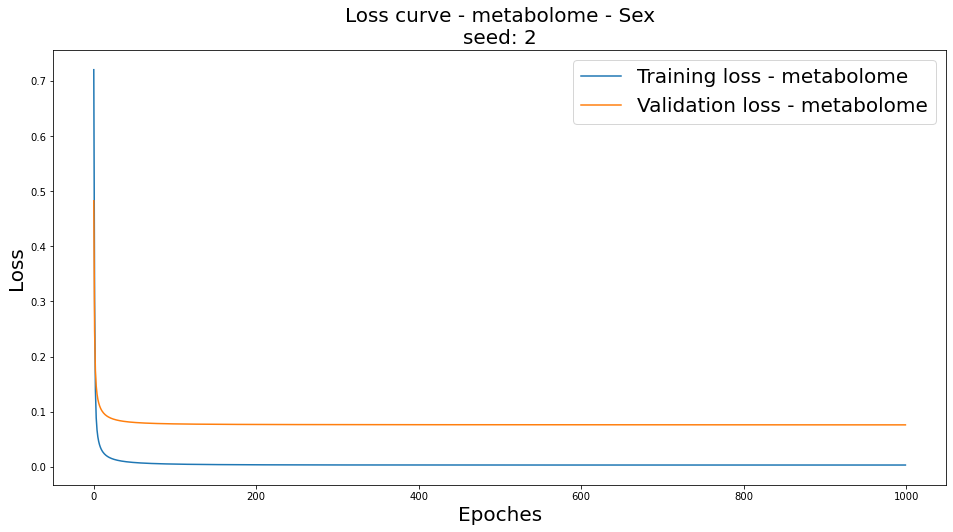


Sex
n train: 503
n val: 107
n test: 110


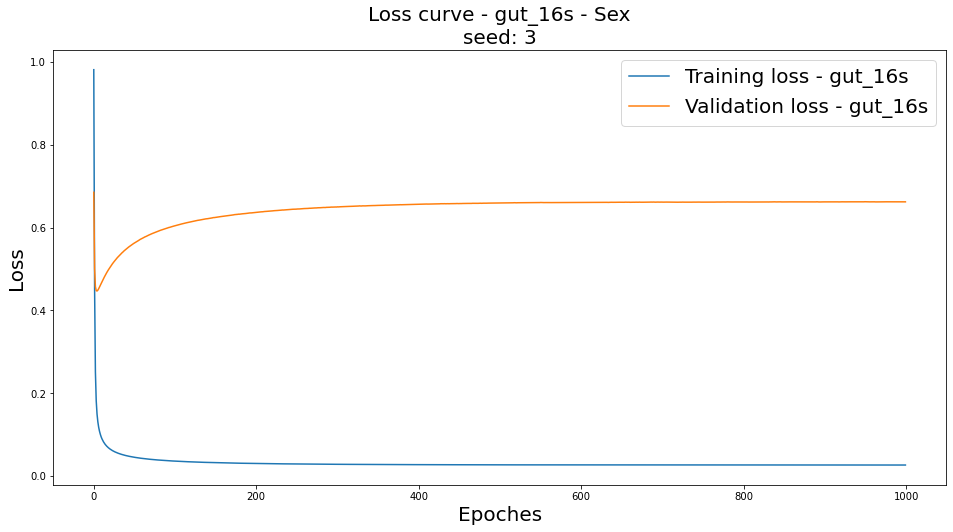

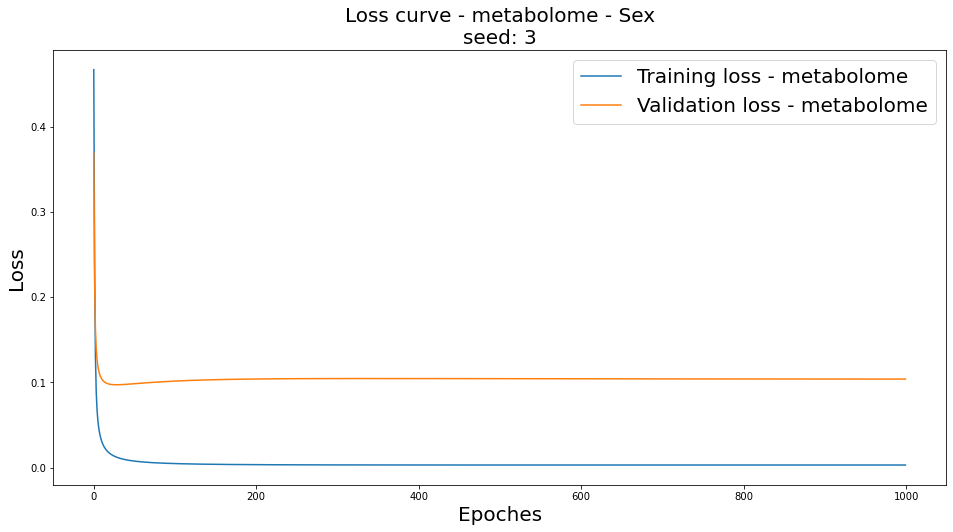


Sex
n train: 503
n val: 107
n test: 110


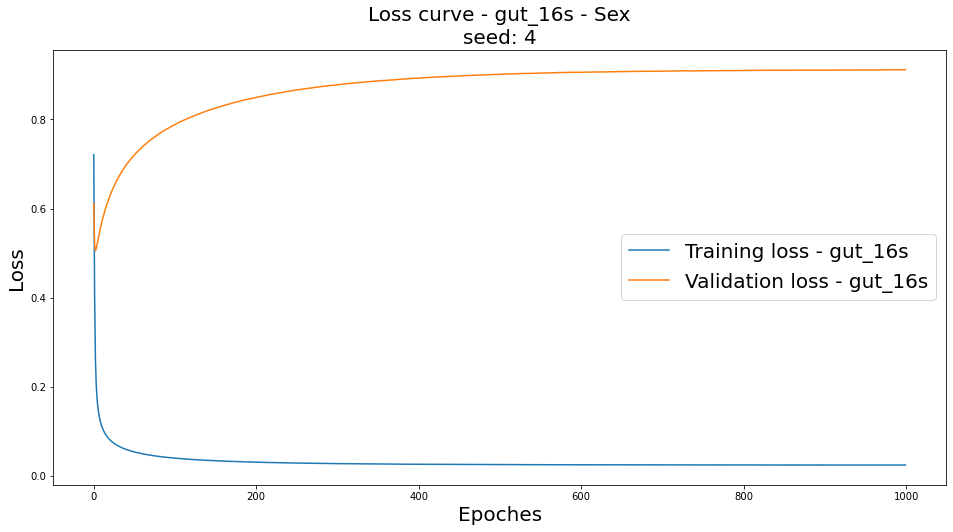

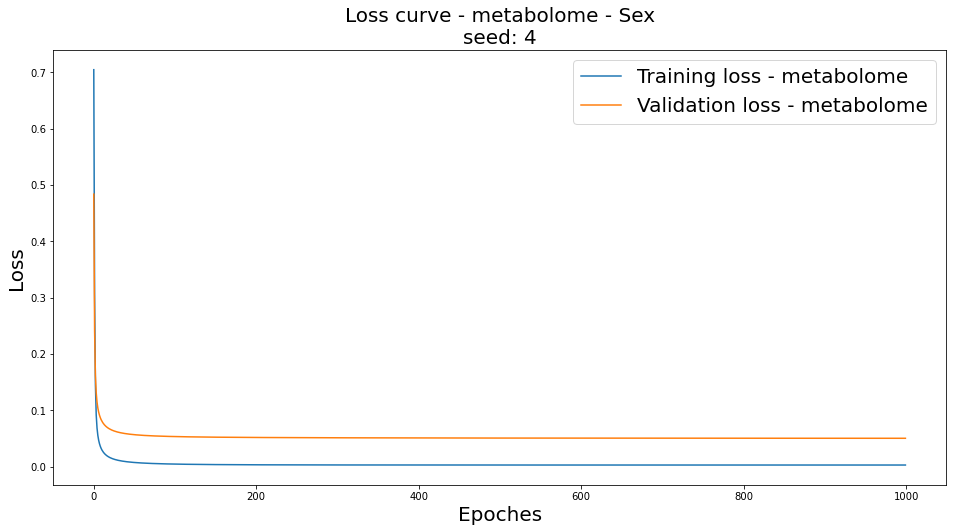


Sex
n train: 503
n val: 107
n test: 110


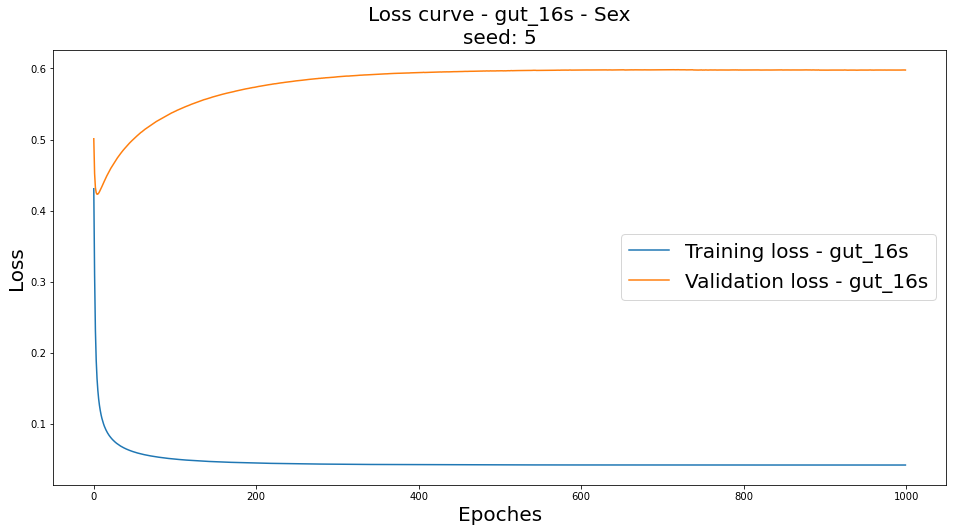

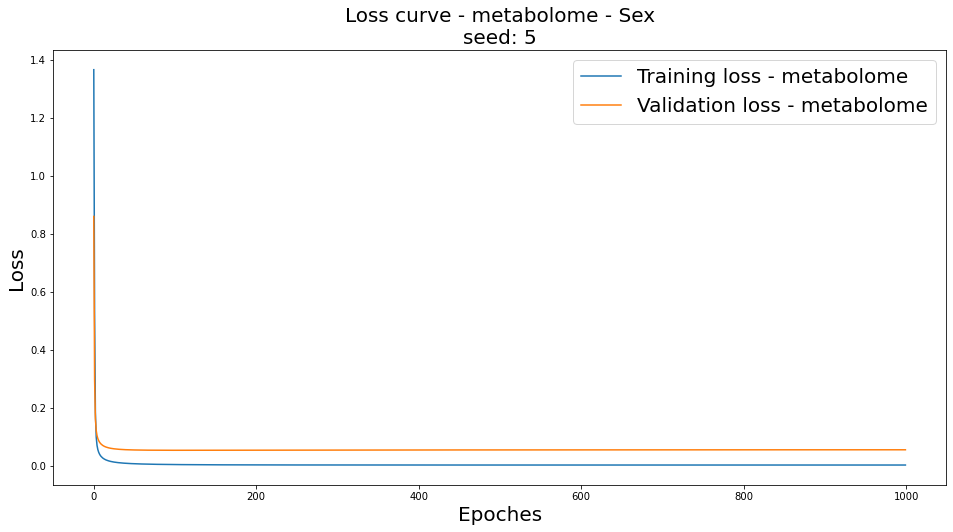


Sex
n train: 503
n val: 107
n test: 110


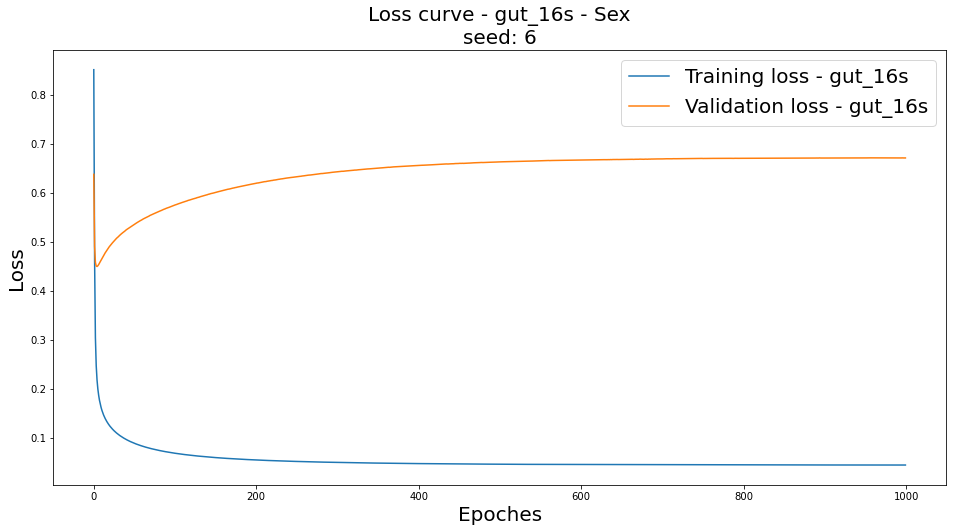

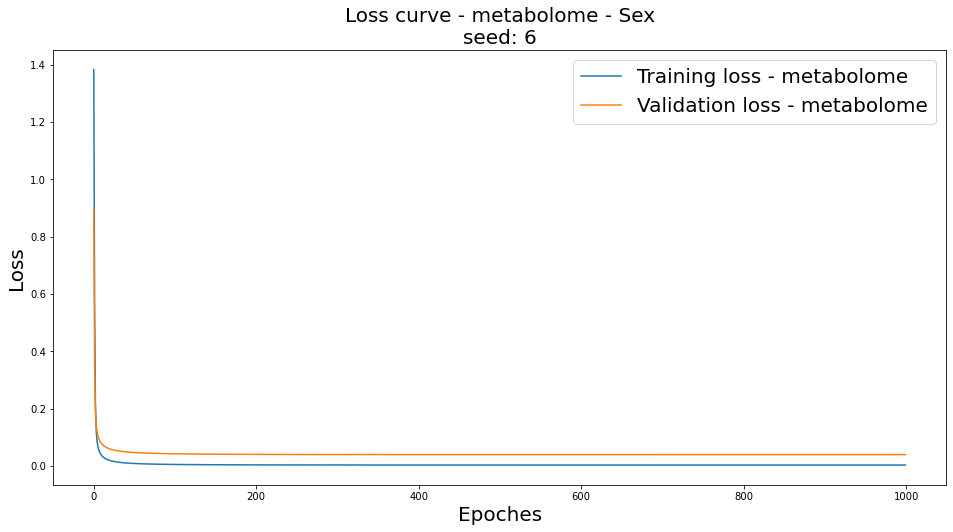


Sex
n train: 503
n val: 107
n test: 110


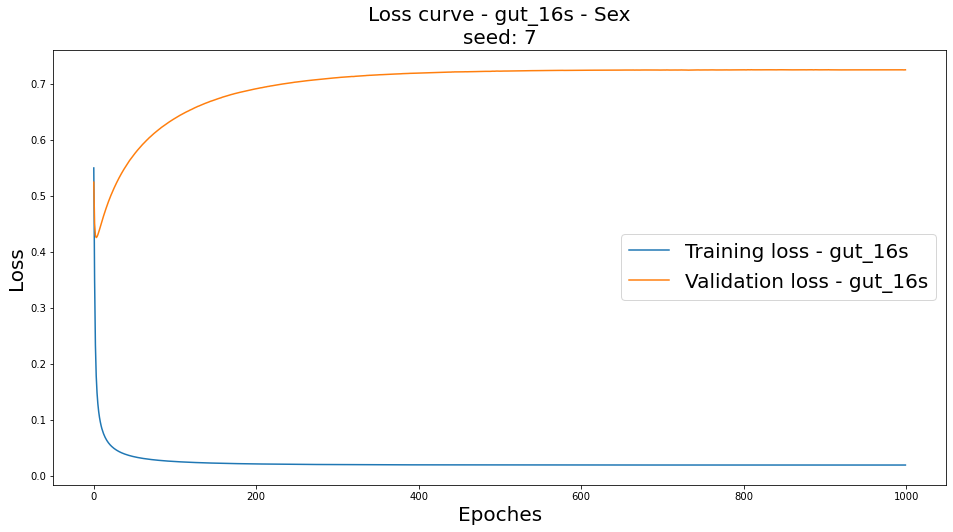

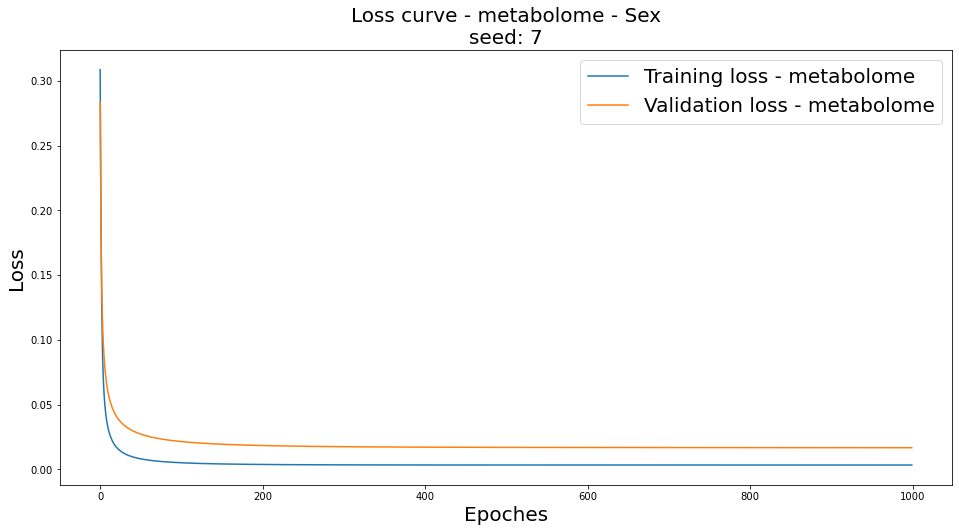


Sex
n train: 503
n val: 107
n test: 110


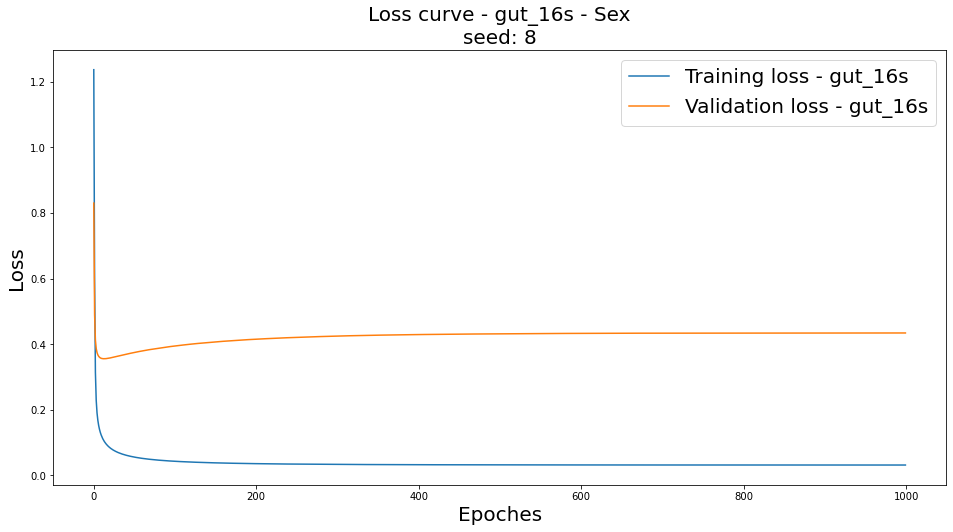

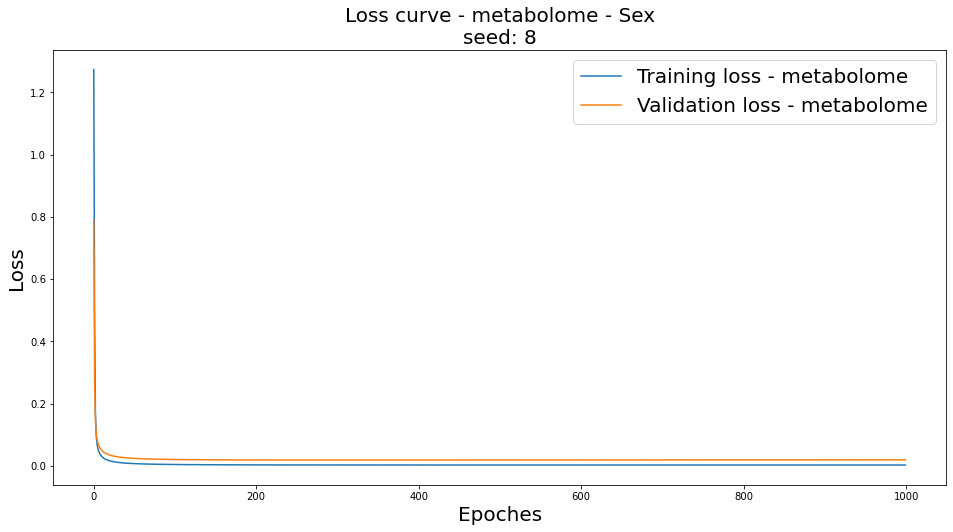


Sex
n train: 503
n val: 107
n test: 110


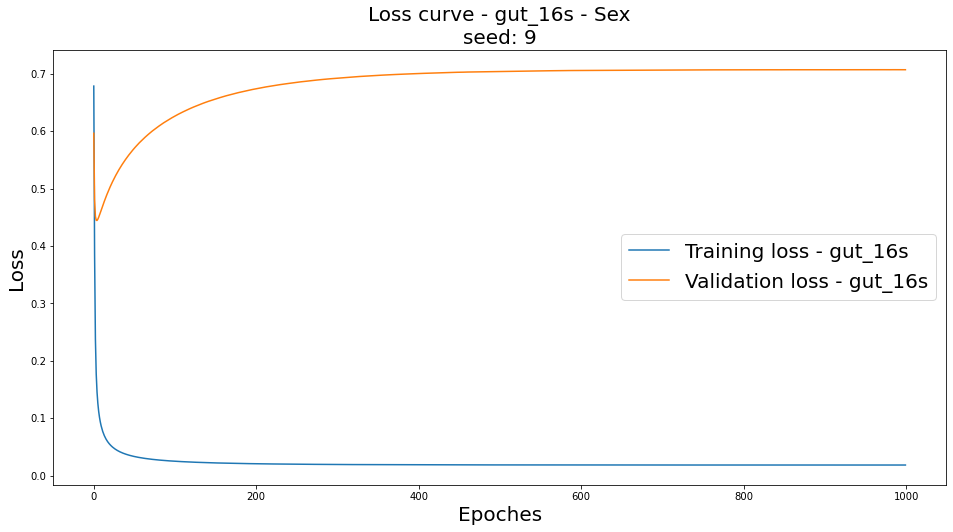

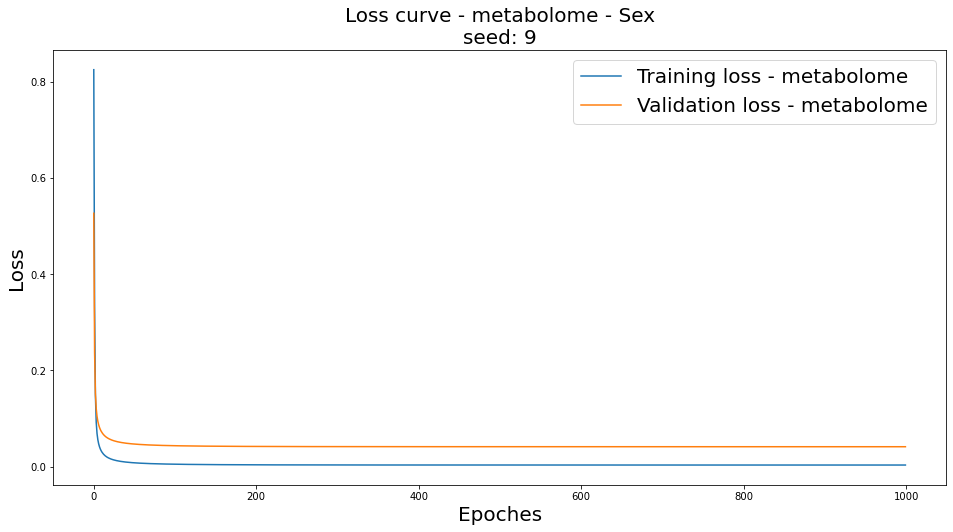


Sex
n train: 503
n val: 107
n test: 110


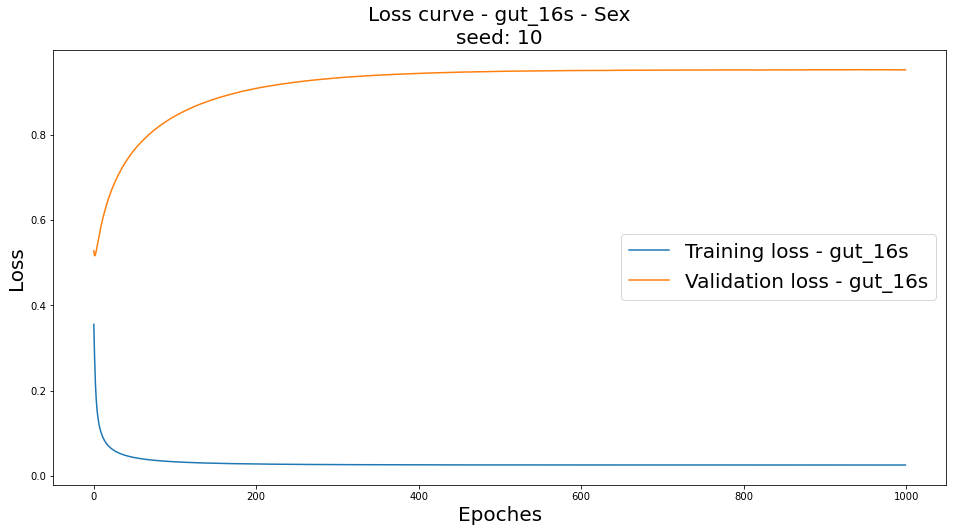

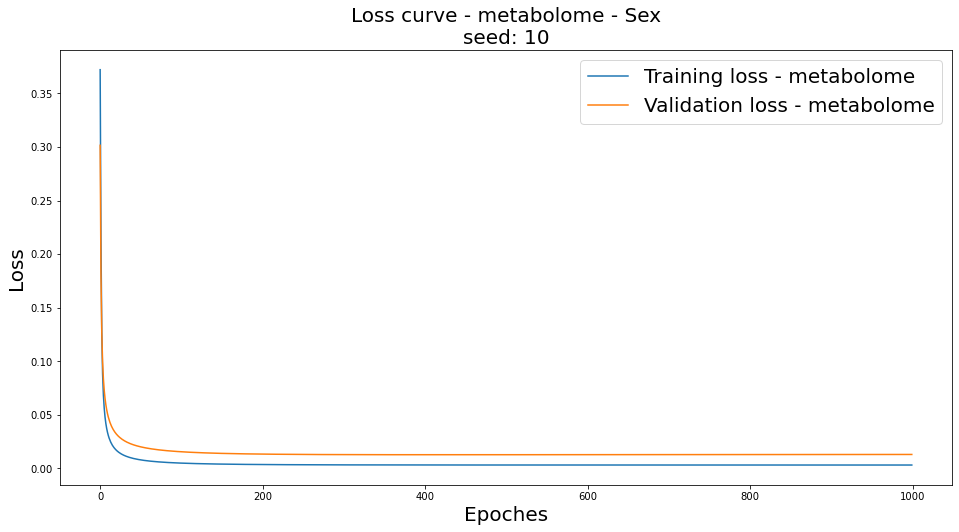


Sex
n train: 503
n val: 107
n test: 110


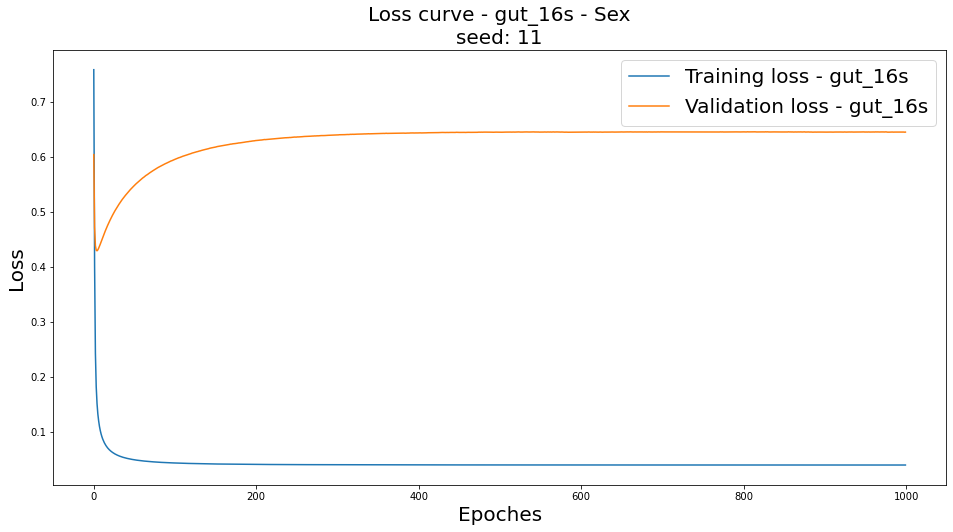

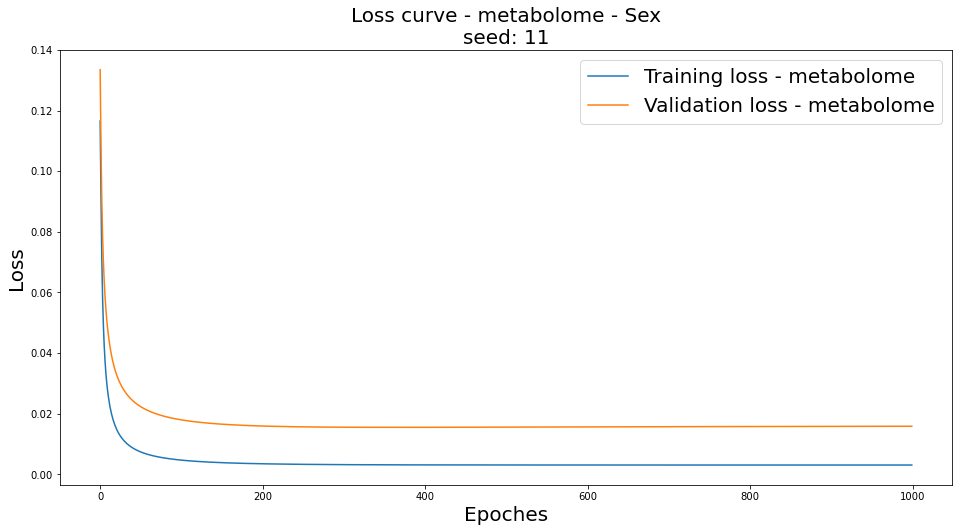


Sex
n train: 503
n val: 107
n test: 110


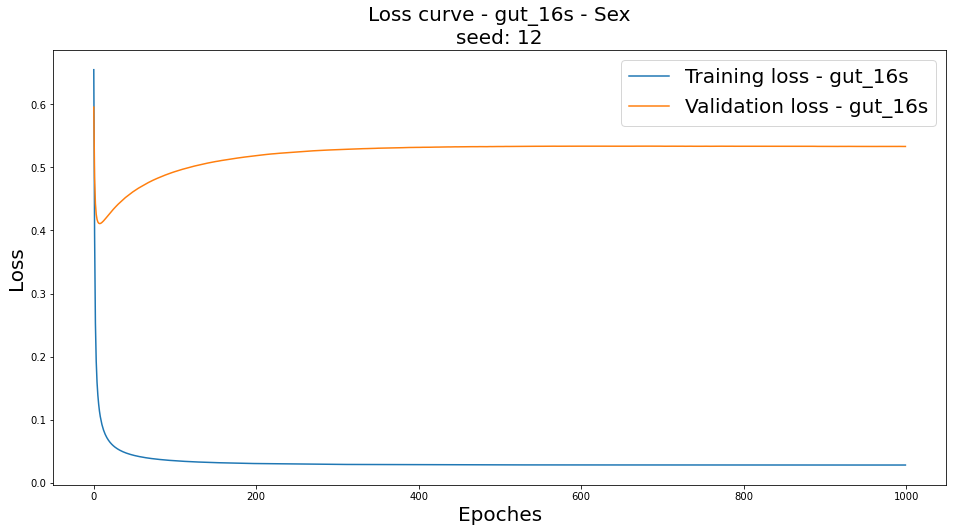

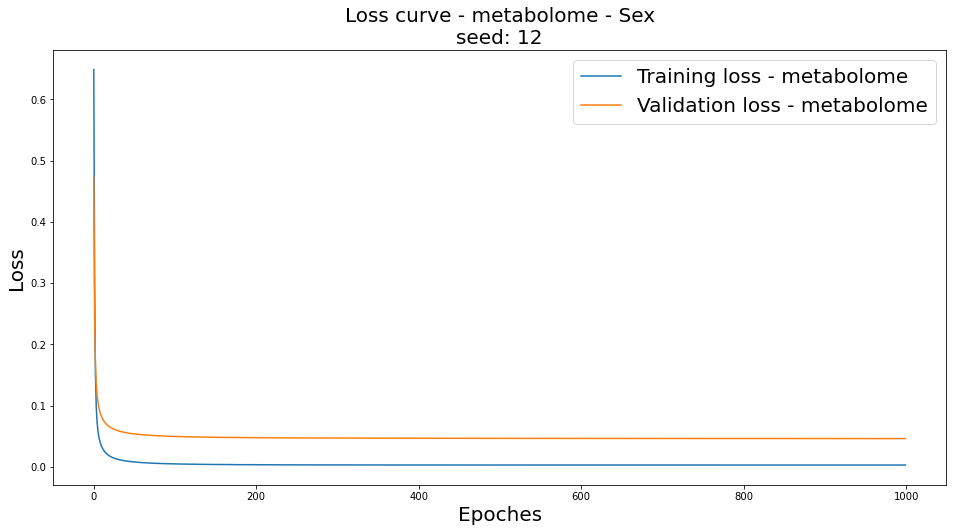

Covariate: Sex
Prediction based on the embedding of microbiome data:


,Validation,Testing
1,80.37%,78.18%
2,81.31%,79.09%
3,81.31%,78.18%
4,83.18%,77.27%
5,85.98%,80.91%
6,80.37%,75.45%
7,82.24%,80.00%
8,88.79%,78.18%
9,85.05%,74.55%
10,72.90%,81.82%


------------------------------------------------------------------
Prediction based on the embedding of metabolome data:


,Validation,Testing
1,98.13%,99.09%
2,97.20%,98.18%
3,98.13%,96.36%
4,98.13%,99.09%
5,98.13%,98.18%
6,98.13%,96.36%
7,100.00%,99.09%
8,99.07%,97.27%
9,99.07%,100.00%
10,100.00%,97.27%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


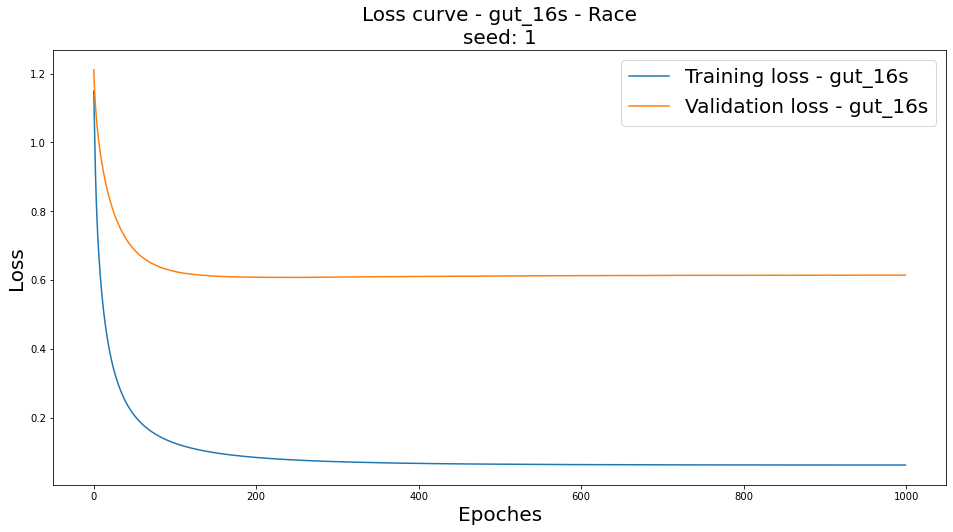

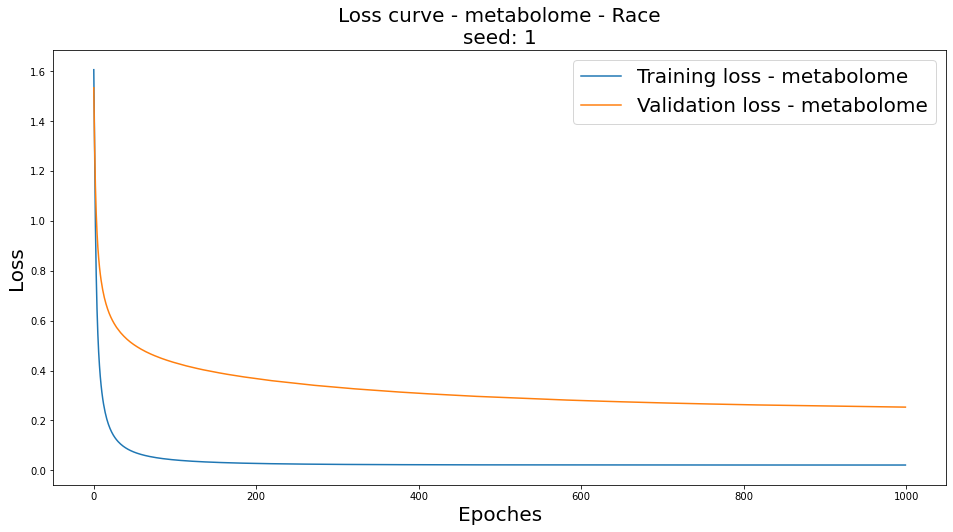


Race
n train: 501
n val: 105
n test: 112


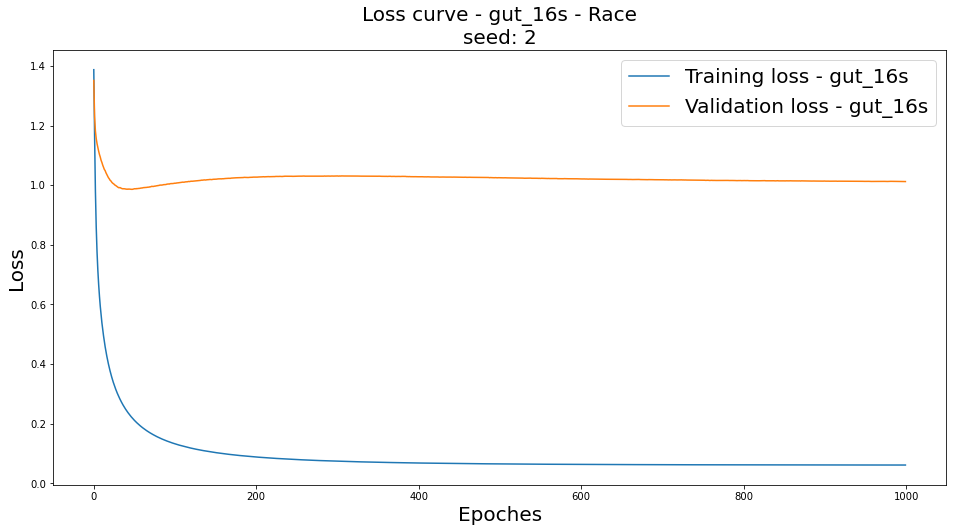

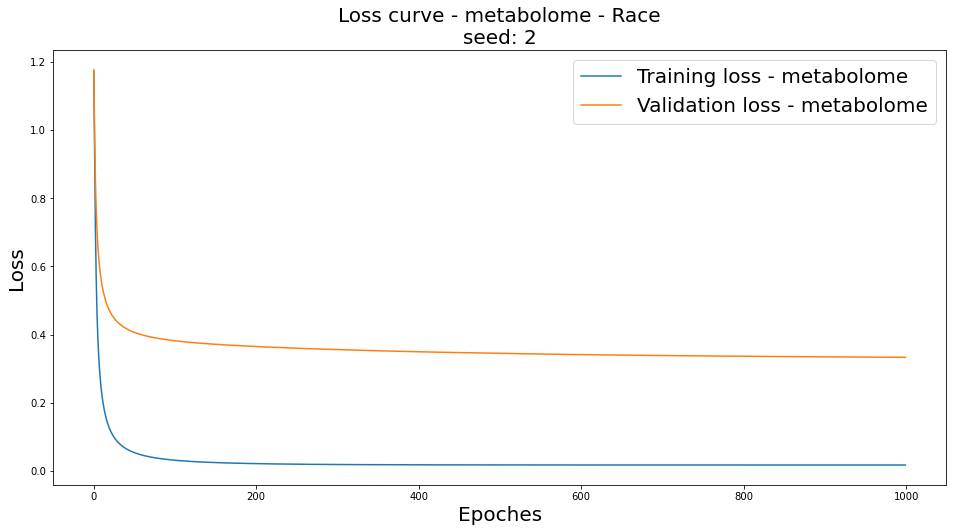


Race
n train: 501
n val: 105
n test: 112


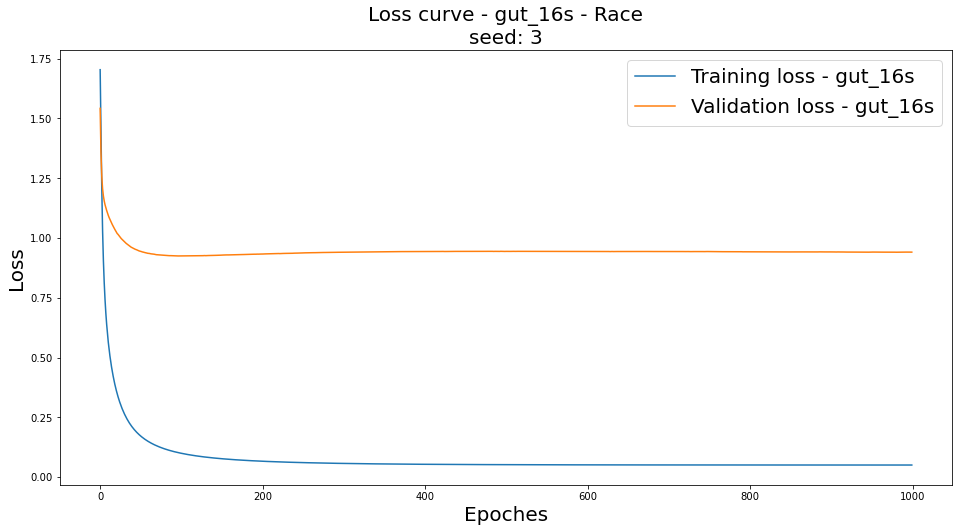

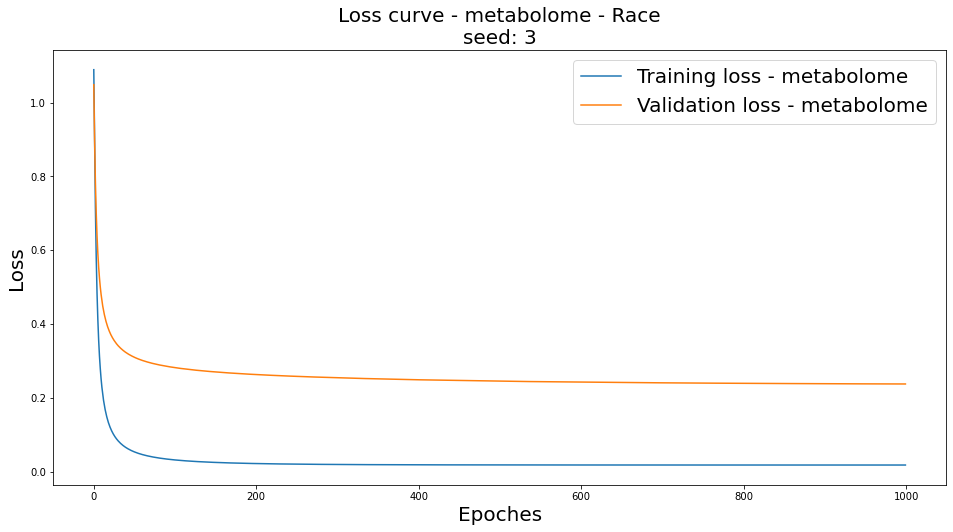


Race
n train: 501
n val: 105
n test: 112


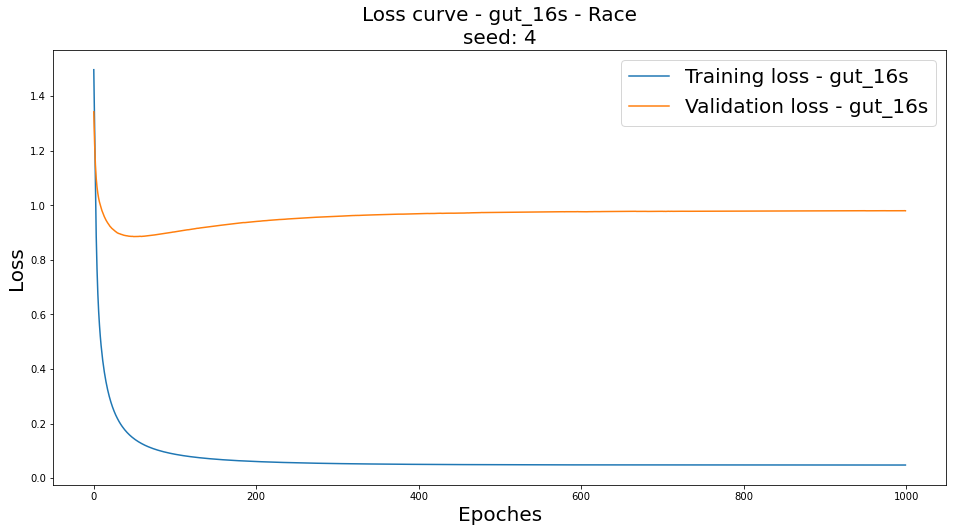

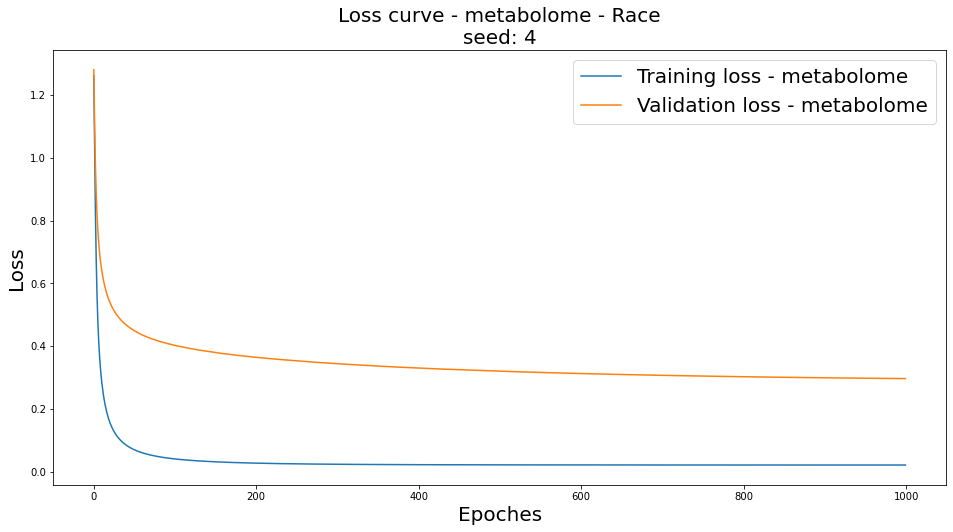


Race
n train: 501
n val: 105
n test: 112


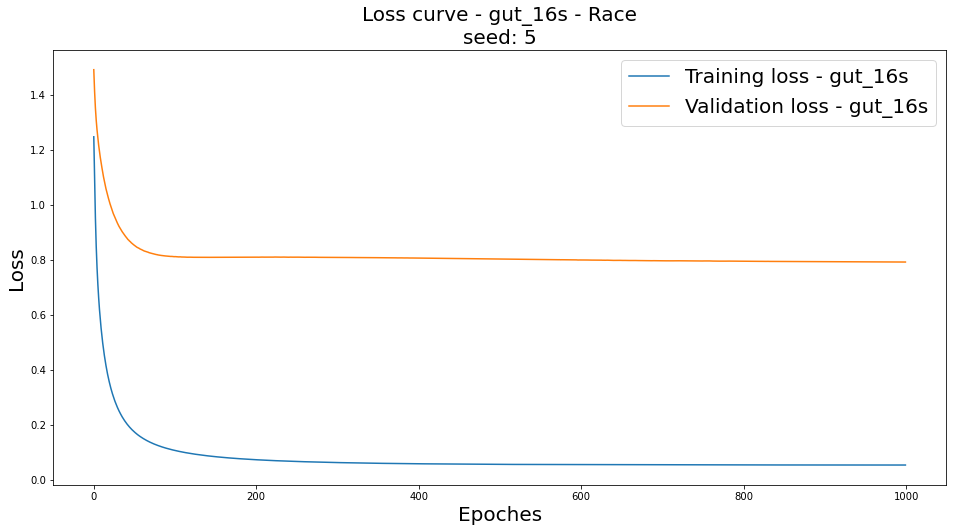

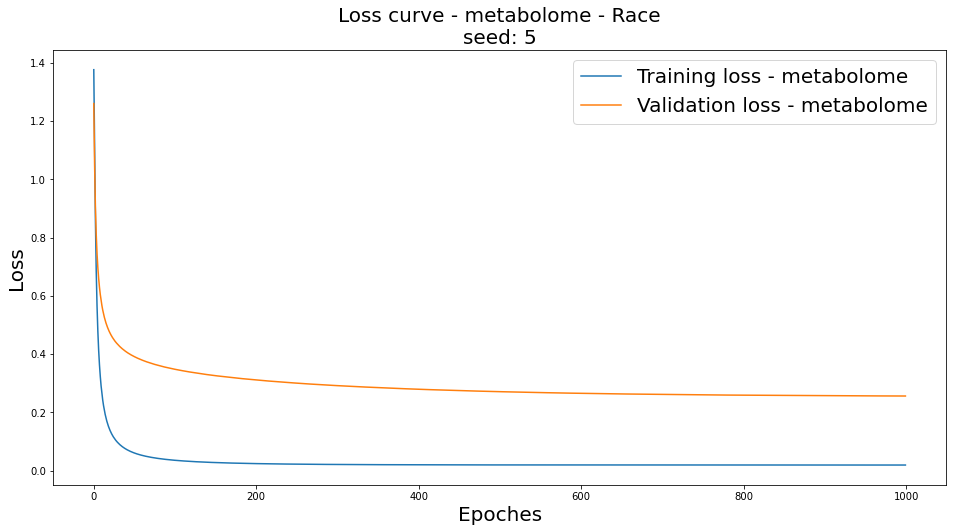


Race
n train: 501
n val: 105
n test: 112


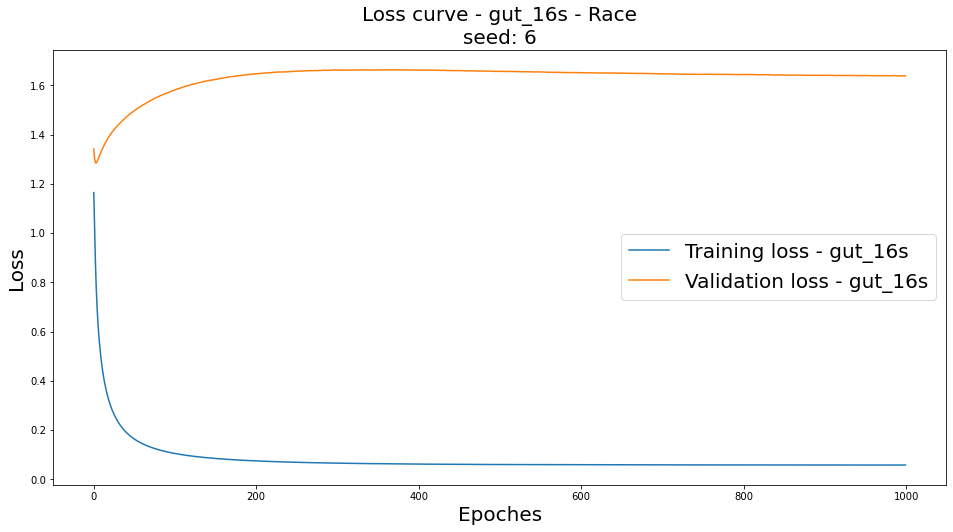

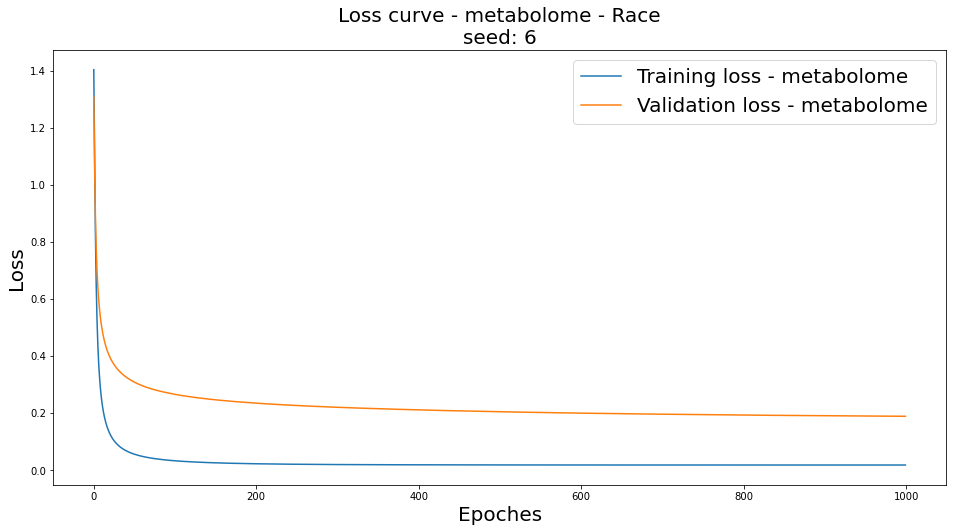


Race
n train: 501
n val: 105
n test: 112


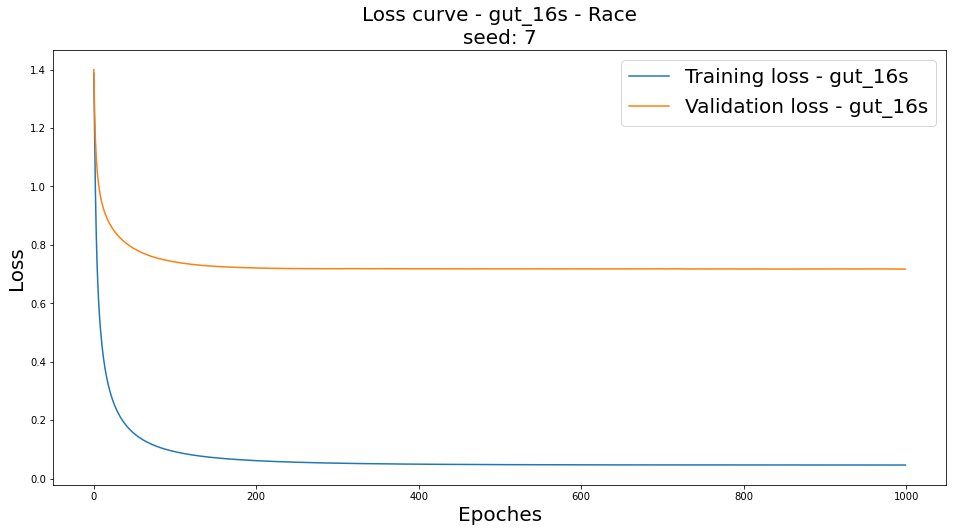

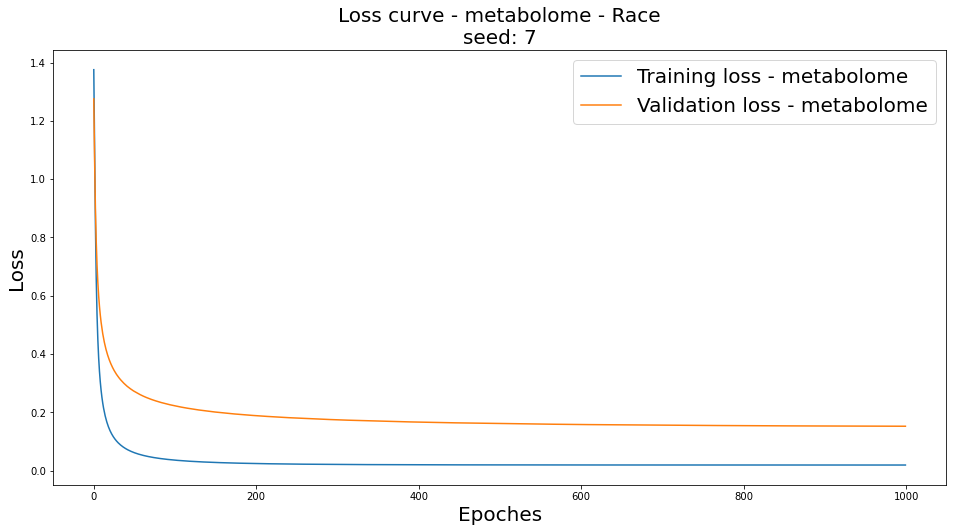


Race
n train: 501
n val: 105
n test: 112


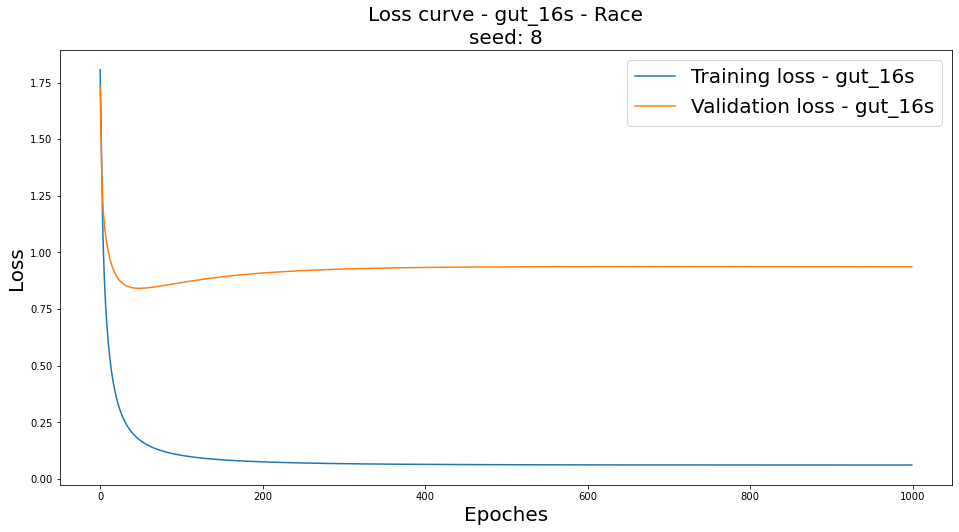

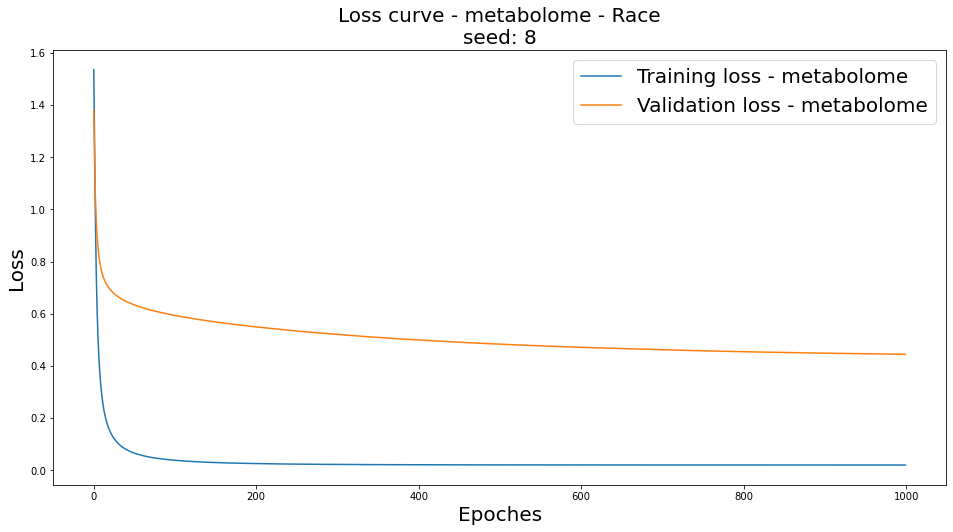


Race
n train: 501
n val: 105
n test: 112


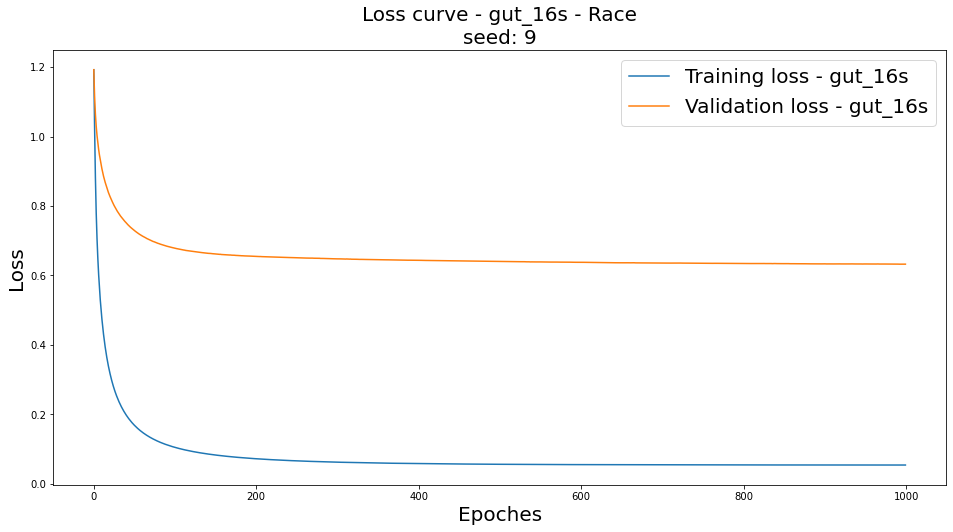

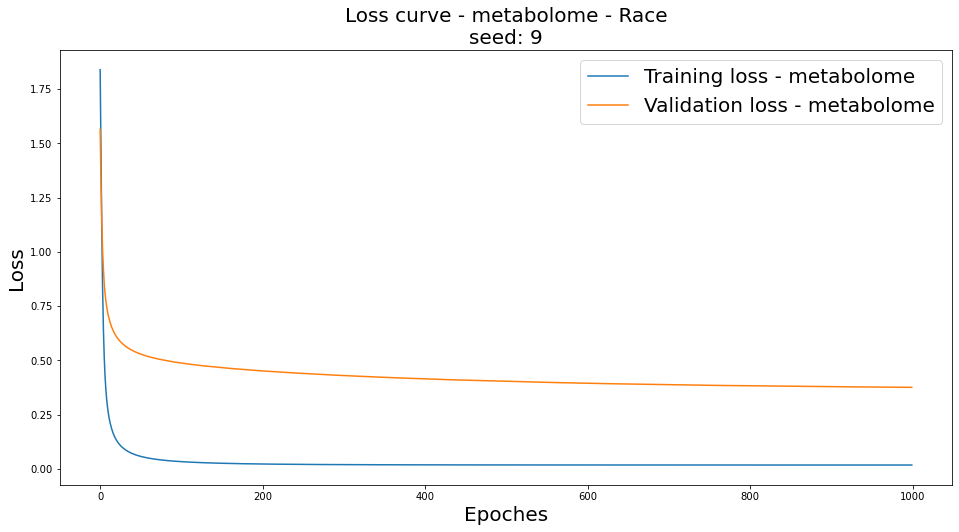


Race
n train: 501
n val: 105
n test: 112


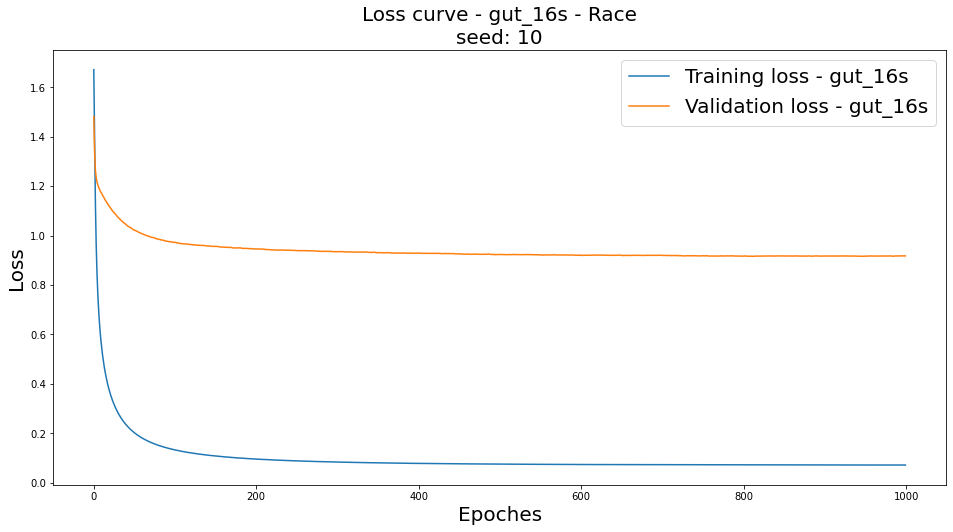

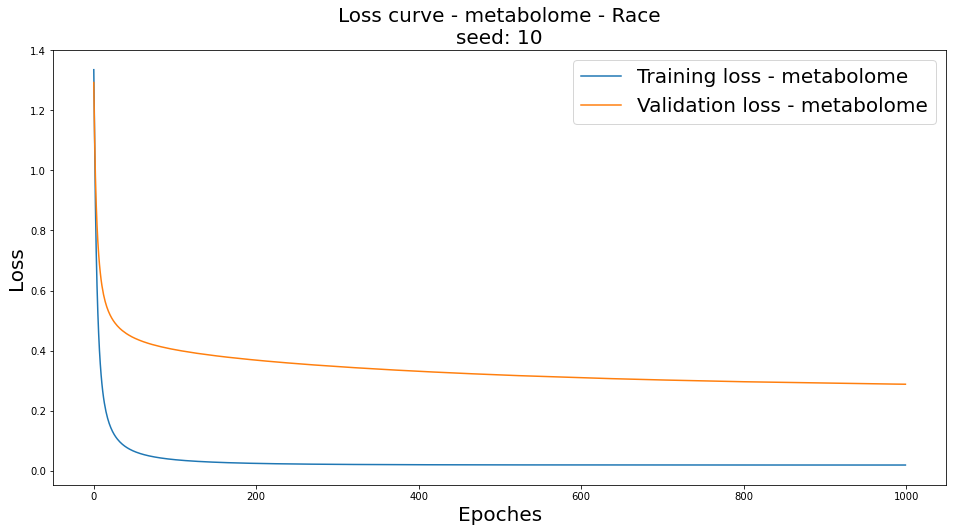


Race
n train: 501
n val: 105
n test: 112


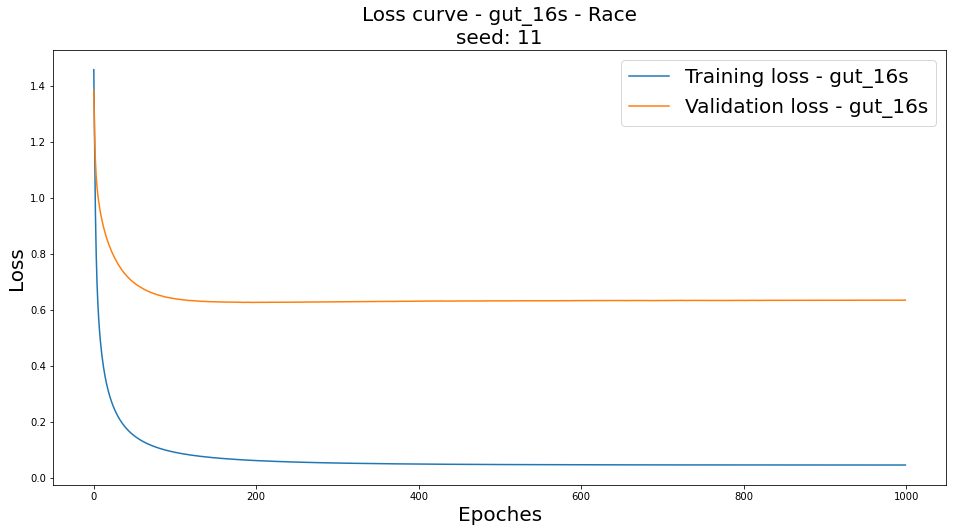

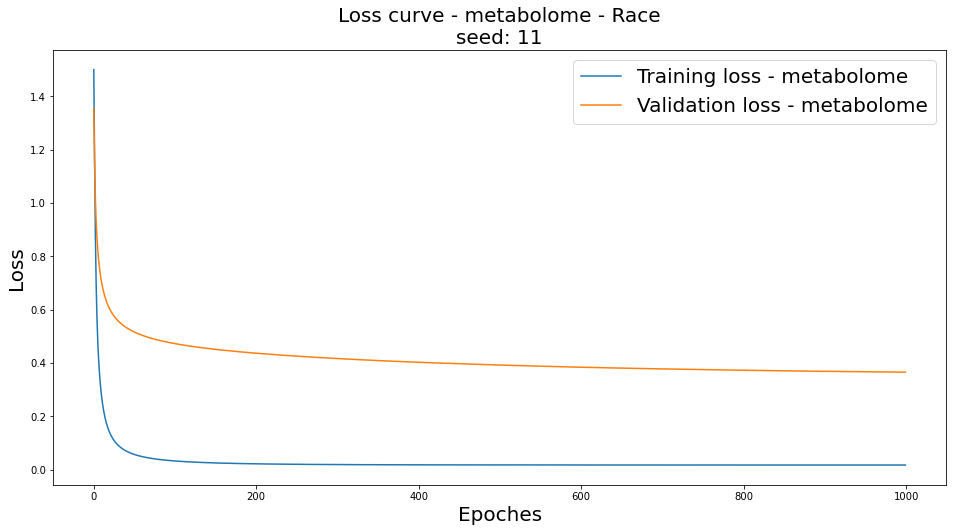


Race
n train: 501
n val: 105
n test: 112


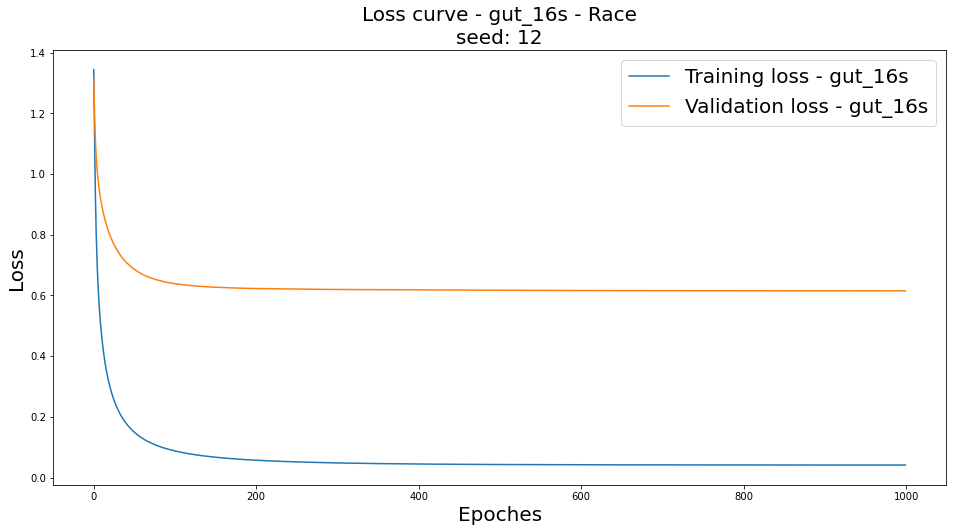

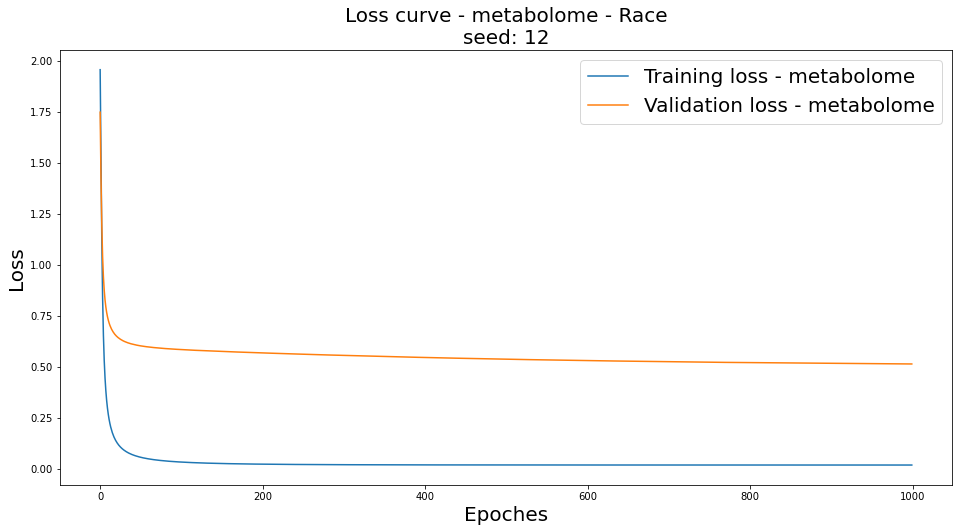

Covariate: Race
Prediction based on the embedding of microbiome data:


,Validation,Testing
1,80.95%,74.11%
2,78.10%,74.11%
3,81.90%,75.00%
4,78.10%,79.46%
5,83.81%,76.79%
6,73.33%,75.89%
7,83.81%,83.04%
8,78.10%,83.93%
9,82.86%,82.14%
10,81.90%,82.14%


------------------------------------------------------------------
Prediction based on the embedding of metabolome data:


,Validation,Testing
1,92.38%,92.86%
2,93.33%,94.64%
3,93.33%,87.50%
4,93.33%,90.18%
5,93.33%,89.29%
6,96.19%,95.54%
7,97.14%,87.50%
8,88.57%,92.86%
9,91.43%,90.18%
10,94.29%,95.54%


------------------------------------------------------------------
5281.228736400604
CPU times: user 1h 27min 3s, sys: 29.8 s, total: 1h 27min 33s
Wall time: 1h 28min 1s


In [7]:
%%time
start_time = time.time()

import pickle
N_EPOCH = 1000
N_OUT_FEATURES = 10
DEVICE = "cuda:2"
SAVE_FOLDER = './save_MLP/embedding_seed_1-12'
os.makedirs(SAVE_FOLDER, exist_ok=True)

random_seed_list = range(1,13)
seed_folder_dict = dict(list(zip(range(1,13), [[1, 2, 3]]*3 + [[4, 5, 6]]*3 + [[7, 8, 9]]*3 + [[10, 11, 12]]*3)))

microbiome_accuracy_embedding_dict, metabolome_accuracy_embedding_dict = dict(), dict()

for covariate in covariate_list:
    dropout = dropout_list[max_idx[covariate][0]]
    weight_decay = weight_decay_list[max_idx[covariate][1]]
    temperature = temp_list[max_idx[covariate][2]]
    
    microbiome_valtest_accuracy_embedding = pd.DataFrame(index=random_seed_list, columns=['Validation', 'Testing'])
    metabolome_valtest_accuracy_embedding = pd.DataFrame(index=random_seed_list, columns=['Validation', 'Testing'])
    
    for s, seed in enumerate(random_seed_list):
        root_folder = './save_tuning/MbSupCon_seed_{}'.format(seed_folder_dict[seed])
        embedding_save_folder = os.path.join(root_folder, 'embeddings/{}'.format(covariate))

        with open(os.path.join(embedding_save_folder, 
                               'embeddings_{}_epoch-{}_temp-{}_dropout-{}_SGD-wd-{}_seed-{}.pkl').\
                  format(covariate, 1000, temperature, dropout, weight_decay, seed), 'rb') as f:
            embeddings_covariates_dict = pickle.load(f)
        ### define multi_omics_dict and net_dict based on embeddings
        multi_omics_dict = {'gut_16s': embeddings_covariates_dict['all']['embedding']['gut_16s'], 
                            'metabolome': embeddings_covariates_dict['all']['embedding']['metabolome']}
        net_dict = {"gut_16s": [N_OUT_FEATURES], 
                    "metabolome": [N_OUT_FEATURES]}
        ### define indexes and metabolome_metadata_df
        indexes = embeddings_covariates_dict['all']['indexes']
        
        metabolome_metadata_df = pd.DataFrame(index=indexes, columns=[covariate])
        metabolome_metadata_df[covariate] = embeddings_covariates_dict['all']['covariate']
        
        MLP_embedding = MultilayerPerceptron(covariate=covariate, indexes=indexes, 
                                   multi_omics_dict=multi_omics_dict, df_with_covariates=metabolome_metadata_df, 
                                   device=DEVICE,root_folder=SAVE_FOLDER, random_seed=seed)
        MLP_embedding.initialize(net_dict=net_dict)
        MLP_embedding.train_mlp(n_epoch=N_EPOCH, print_hist=False)
        MLP_embedding.plot_training()
        prediction_by_seed = MLP_embedding.predict()
        microbiome_valtest_accuracy_embedding.loc[seed,:] = [prediction_by_seed['gut_16s']['val'][0],
                                                  prediction_by_seed['gut_16s']['test'][0]]
        metabolome_valtest_accuracy_embedding.loc[seed,:] = [prediction_by_seed['metabolome']['val'][0],
                                                  prediction_by_seed['metabolome']['test'][0]]
        
    print('Covariate:', covariate)
    print('Prediction based on the embedding of microbiome data:')
    display(microbiome_valtest_accuracy_embedding.style.format(formatter="{:.2%}"))
    print('------------------------------------------------------------------')
    print('Prediction based on the embedding of metabolome data:')
    display(metabolome_valtest_accuracy_embedding.style.format(formatter="{:.2%}"))
    print('------------------------------------------------------------------')
            
    microbiome_accuracy_embedding_dict[covariate] = microbiome_valtest_accuracy_embedding
    metabolome_accuracy_embedding_dict[covariate] = metabolome_valtest_accuracy_embedding

with open(os.path.join(SAVE_FOLDER, 'microbiome_accuracy_embedding_dict.pkl'), 'wb') as f:
    pickle.dump(microbiome_accuracy_embedding_dict, f)

with open(os.path.join(SAVE_FOLDER, 'metabolome_accuracy_embedding_dict.pkl'), 'wb') as f:
    pickle.dump(metabolome_accuracy_embedding_dict, f)
    
end_time = time.time()
print(end_time - start_time)
        

### Mean accuracy

In [8]:
SAVE_FOLDER = './save_MLP/embedding_seed_1-12'

In [9]:
with open(os.path.join(SAVE_FOLDER, 'microbiome_accuracy_embedding_dict.pkl'), 'rb') as f:
    microbiome_accuracy_embedding_dict = pickle.load(f)

In [10]:
microbiome_accuracy_embedding_df = pd.DataFrame(index=covariate_list, columns=['Validation', 'Testing'])
for covariate in covariate_list:
    microbiome_accuracy_embedding_df.loc[covariate,:] = \
        np.mean(microbiome_accuracy_embedding_dict[covariate], axis=0)
    
display(microbiome_accuracy_embedding_df.style.format(formatter="{:.2%}"))

,Validation,Testing
IR_IS_classification,83.54%,84.33%
Sex,81.93%,78.71%
Race,80.56%,79.17%


## 2 Prediction based on original omics data

## Load data

In [11]:
gut_16s_df = pd.read_table("./data/gut_16s_abundance.txt", index_col=0)
metabolome_df = pd.read_table("./data/metabolome_abundance.txt", index_col=0)
metabolome_df = metabolome_df.drop(columns=['SubjectID', 'CollectionDate', 'CL1', 'CL2', 'CL3', 'CL4'])

In [12]:
subjects = pd.read_csv("./data/subjects.csv", na_values="NA")
copy_gut_16s_df = gut_16s_df.copy()
copy_gut_16s_df['SubjectID'] = [copy_gut_16s_df.index[i][0:7] for i in range(len(copy_gut_16s_df.index))]
gut_16s_df_subj = pd.merge(left=copy_gut_16s_df, right=subjects, how='left', on='SubjectID')
gut_16s_df_subj.index = copy_gut_16s_df.index

In [13]:
# Get indexes for shared patient ids
indexes = list(set(gut_16s_df.index.values) & set(metabolome_df.index.values))
indexes.sort()
print("# of samples: {}".format(len(indexes)))

# of samples: 720


## Train MLPs with different random seeds

In [14]:
DEVICE = "cuda:2"
N_EPOCH = 1000

random_seed_list = range(1,13)
SAVE_FOLDER = './save_MLP/original_seed_1-12'
os.makedirs(SAVE_FOLDER, exist_ok=True)


IR_IS_classification
n train: 382
n val: 81
n test: 84


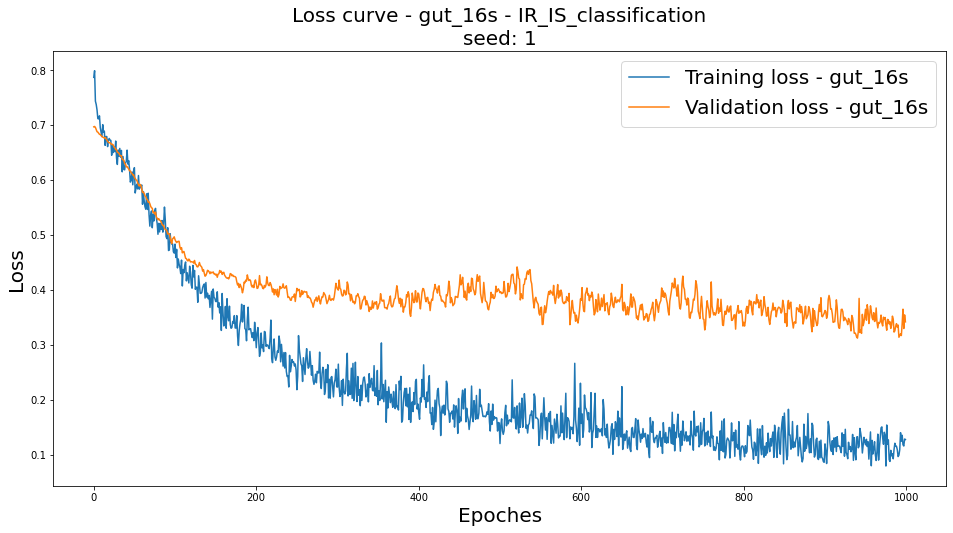

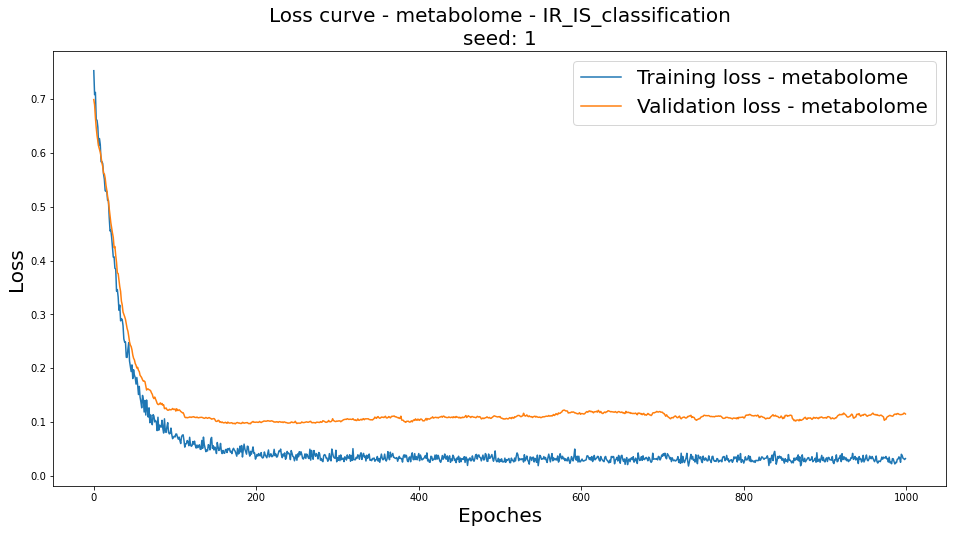


IR_IS_classification
n train: 382
n val: 81
n test: 84


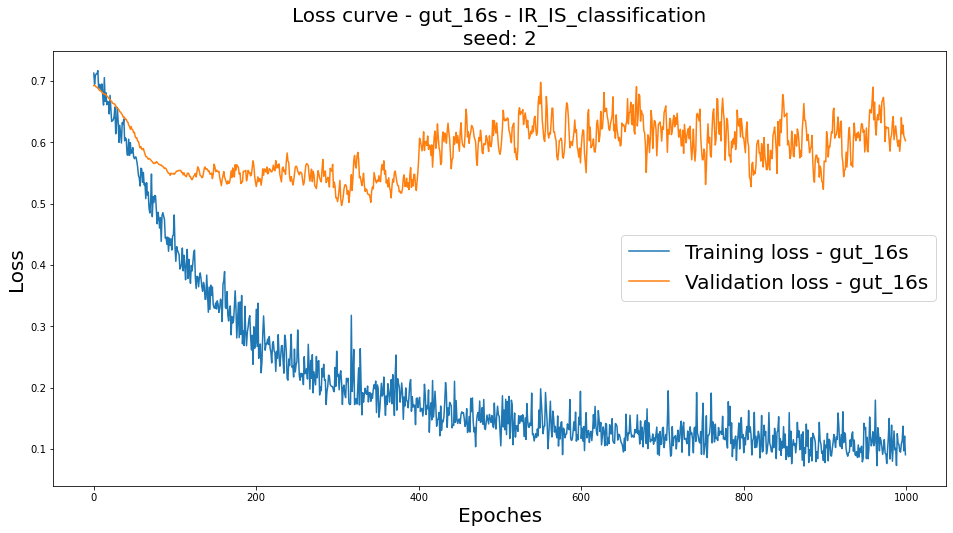

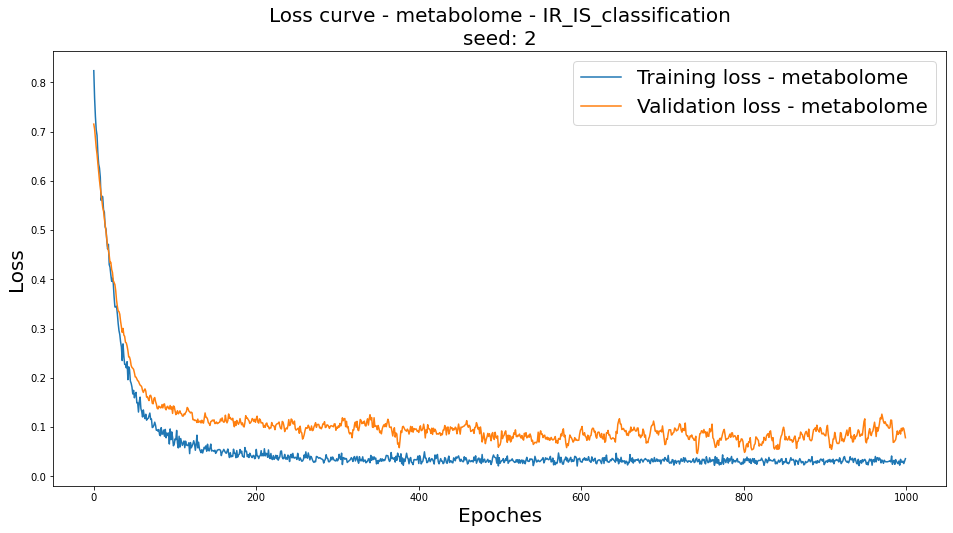


IR_IS_classification
n train: 382
n val: 81
n test: 84


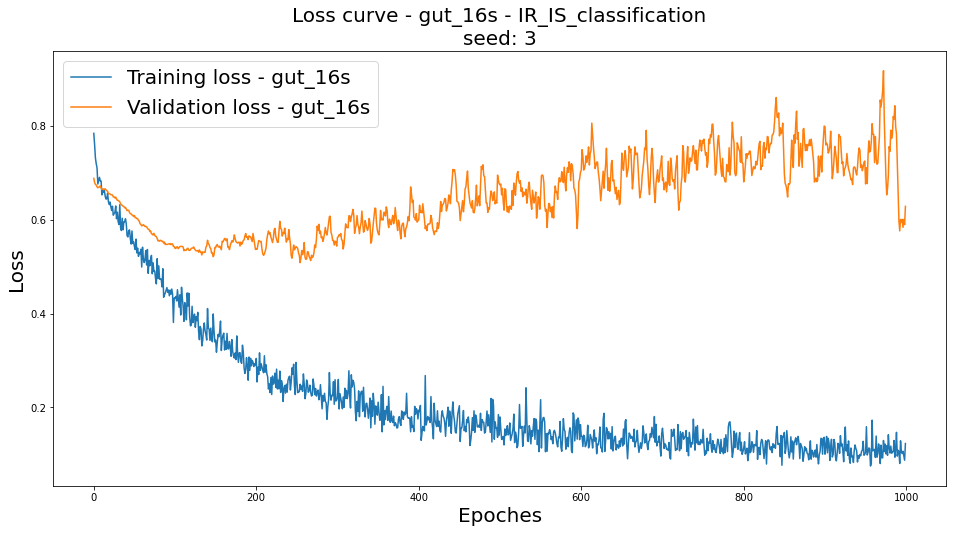

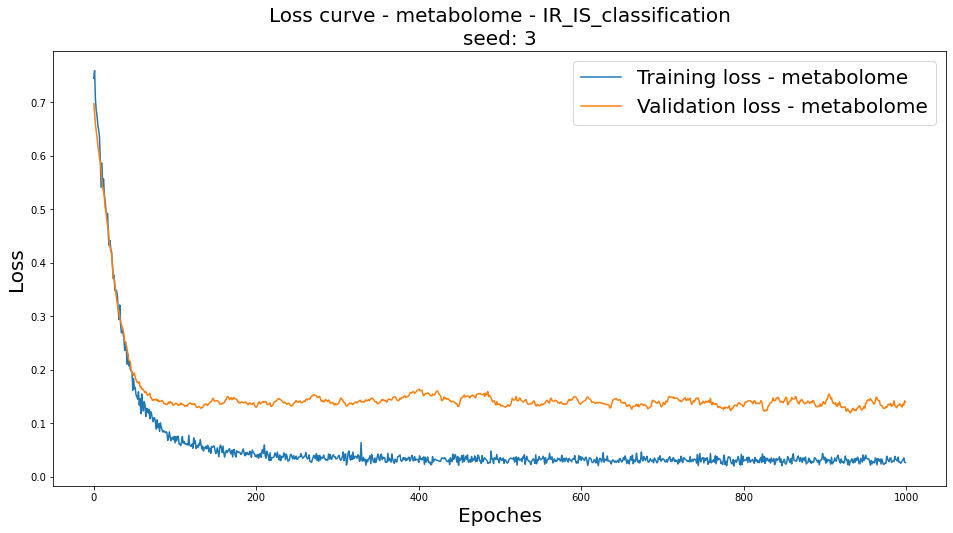


IR_IS_classification
n train: 382
n val: 81
n test: 84


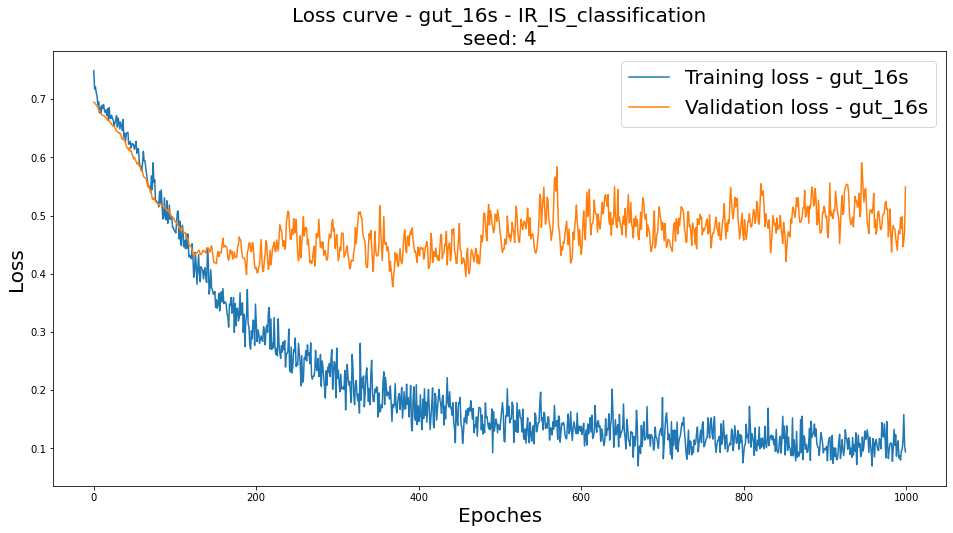

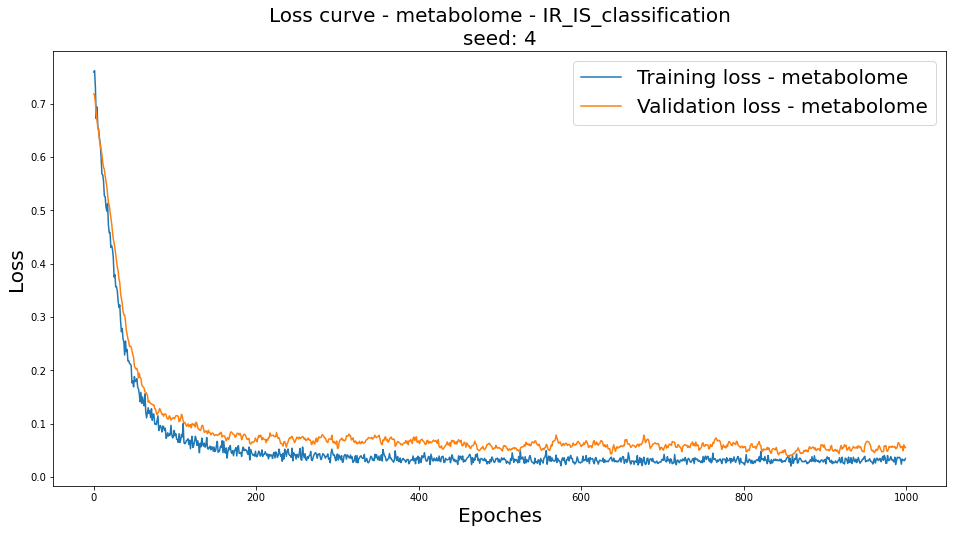


IR_IS_classification
n train: 382
n val: 81
n test: 84


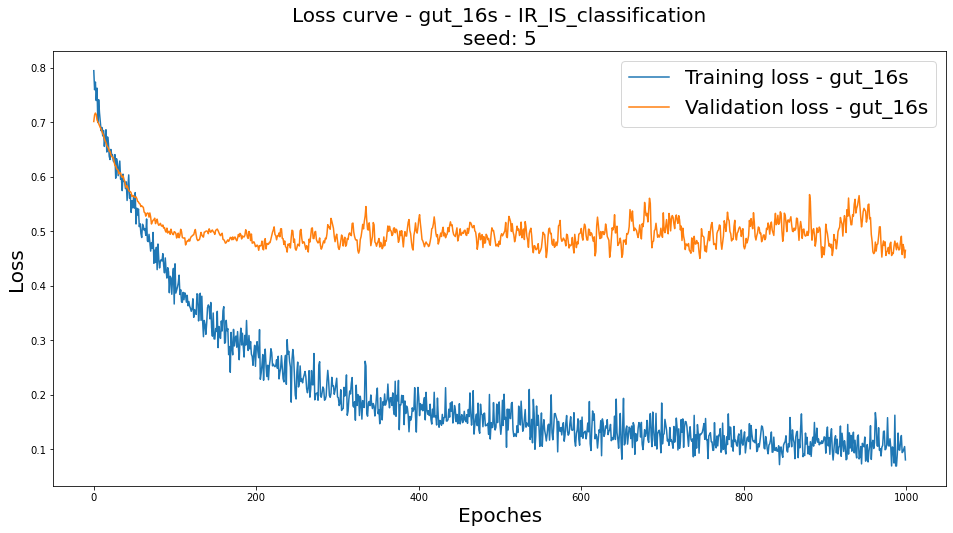

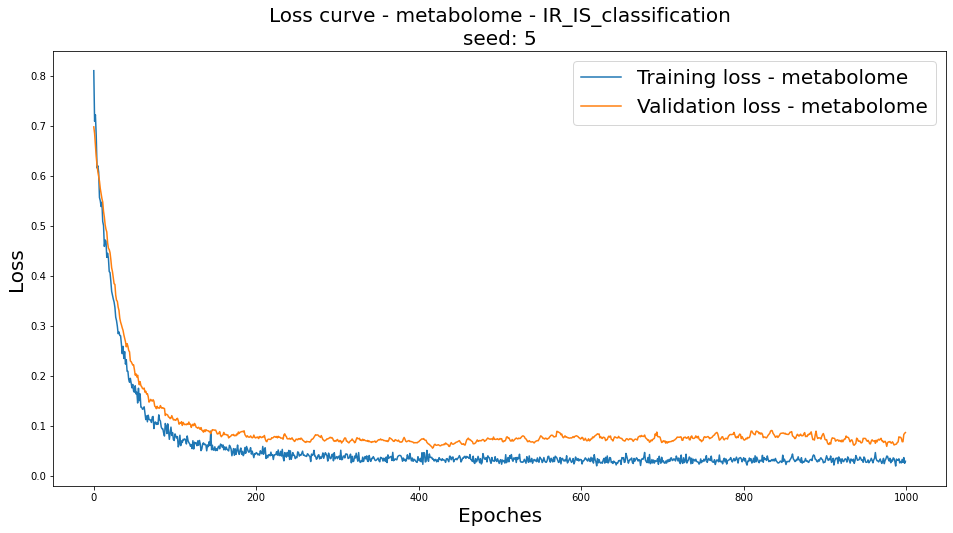


IR_IS_classification
n train: 382
n val: 81
n test: 84


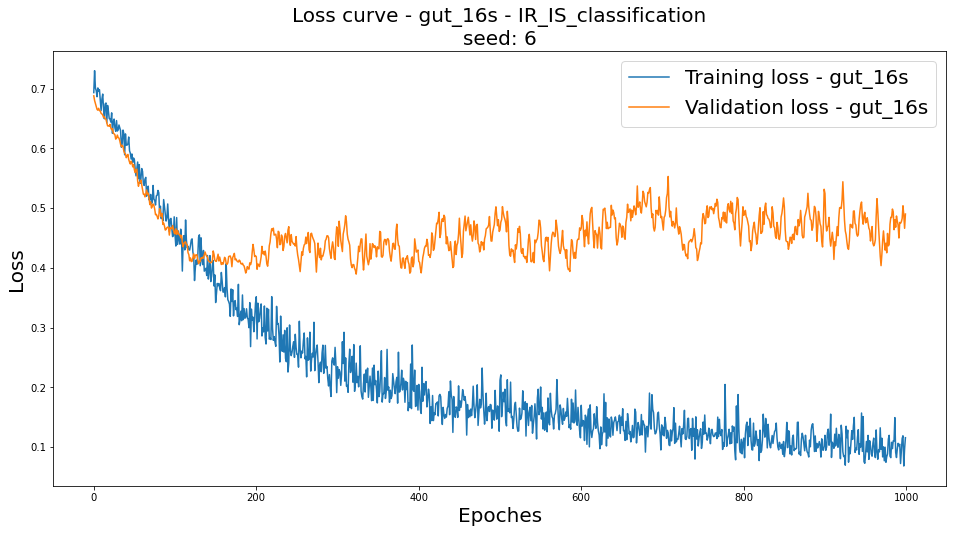

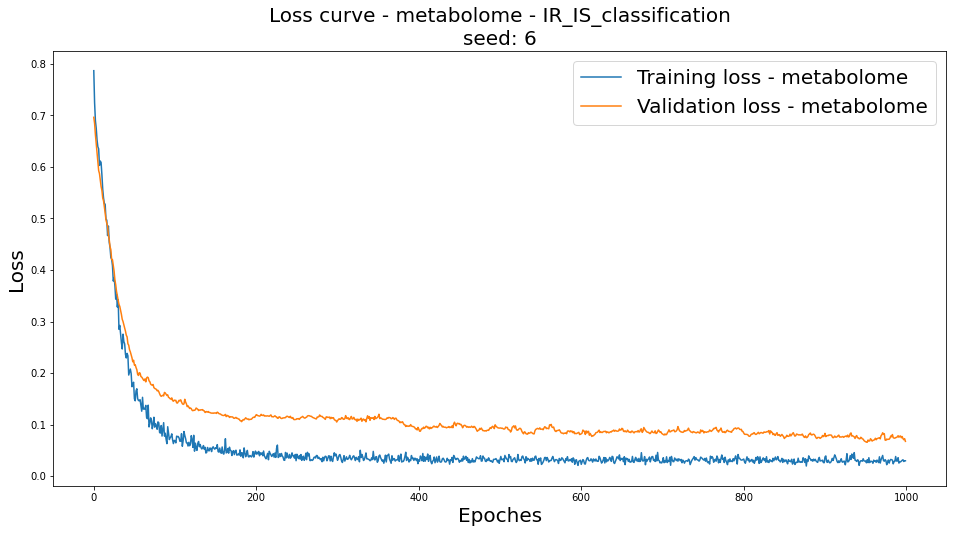


IR_IS_classification
n train: 382
n val: 81
n test: 84


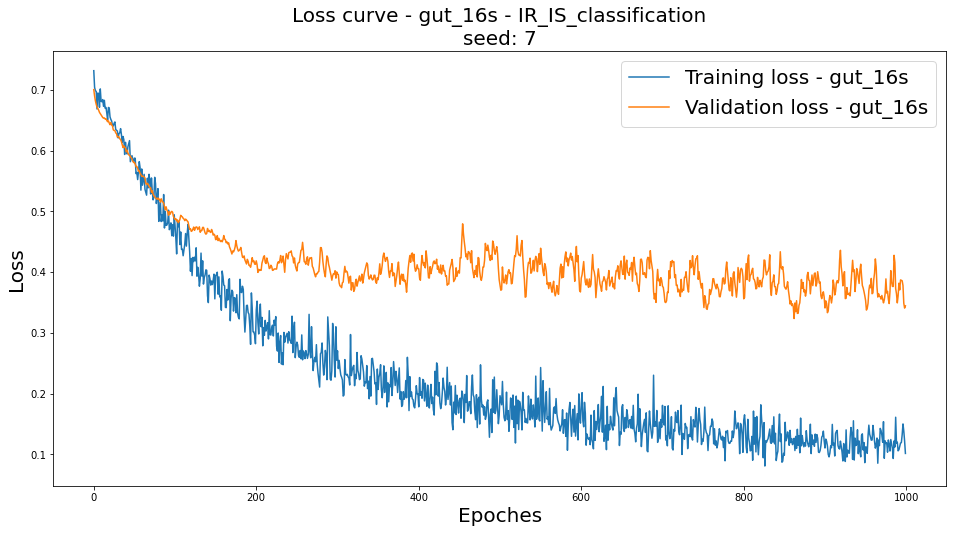

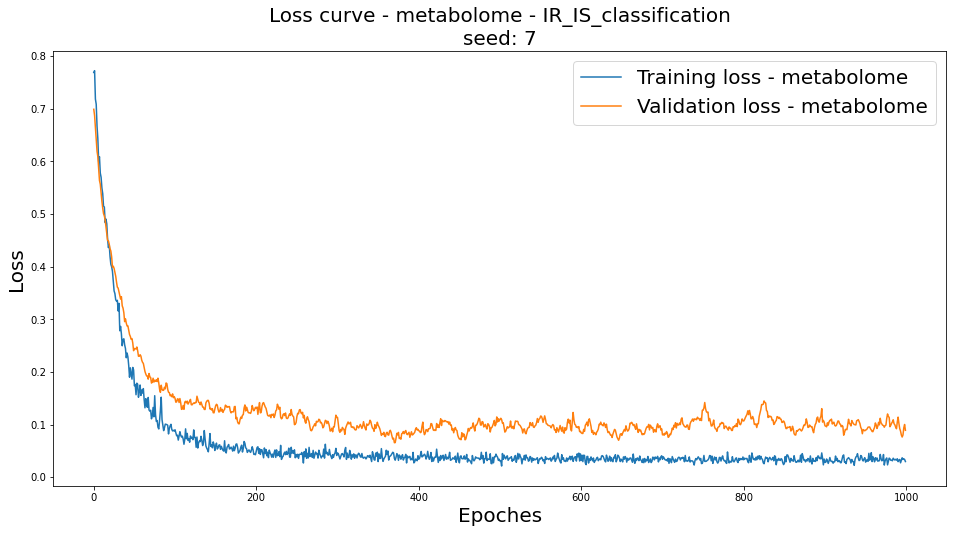


IR_IS_classification
n train: 382
n val: 81
n test: 84


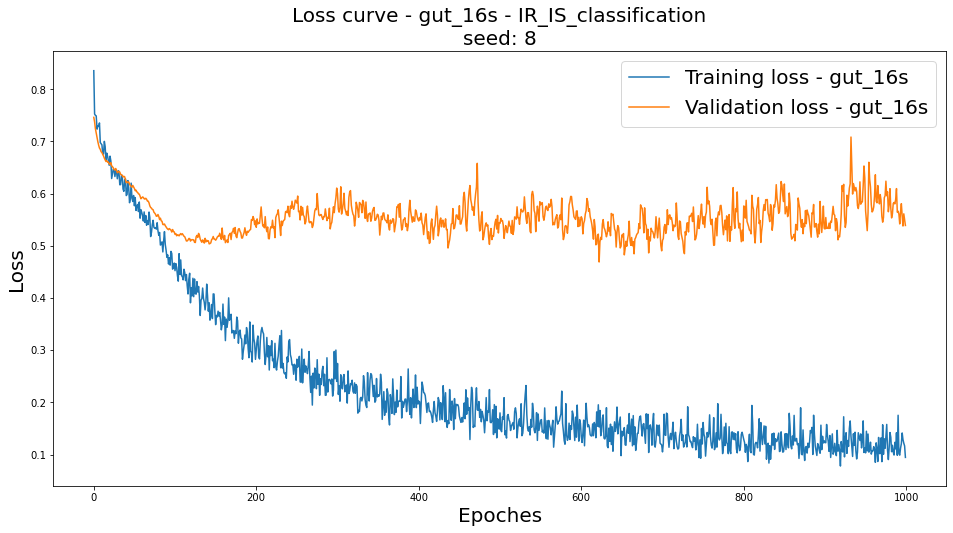

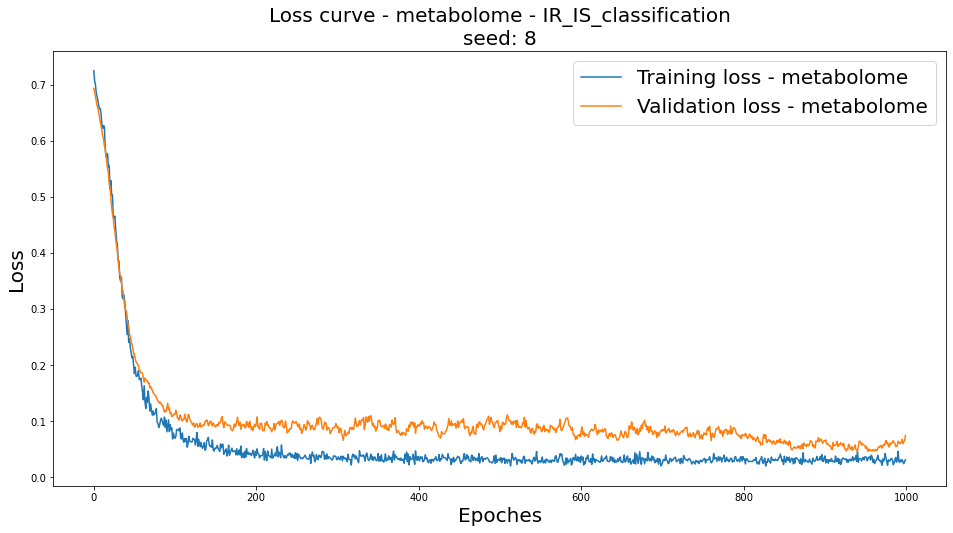


IR_IS_classification
n train: 382
n val: 81
n test: 84


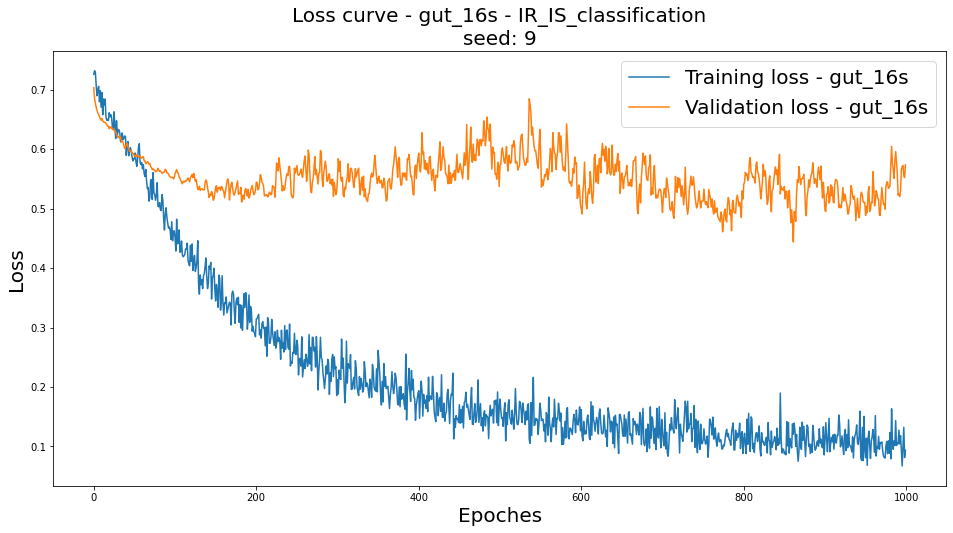

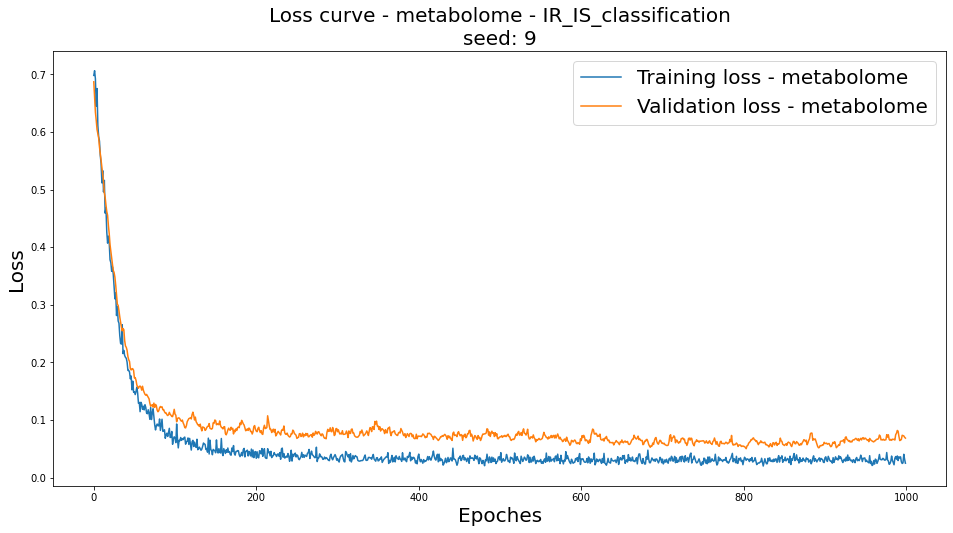


IR_IS_classification
n train: 382
n val: 81
n test: 84


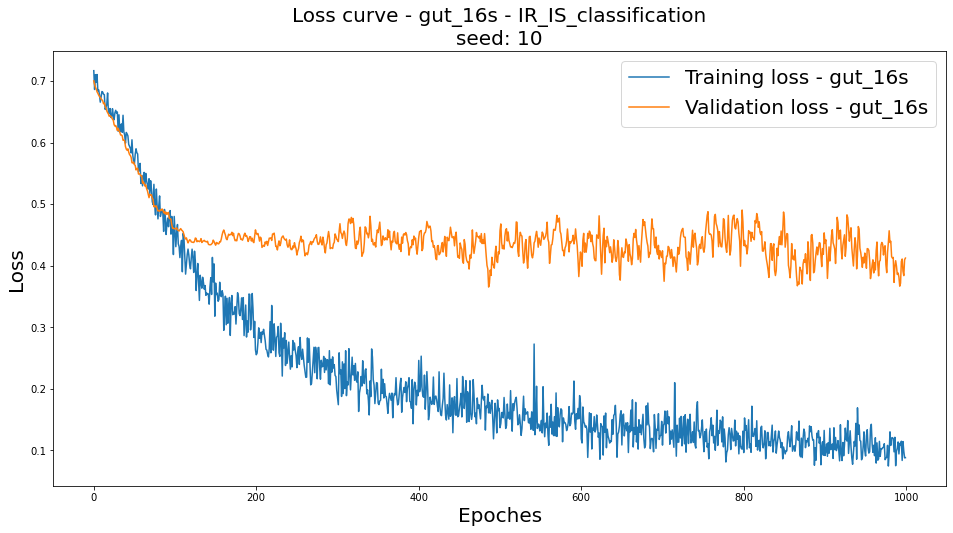

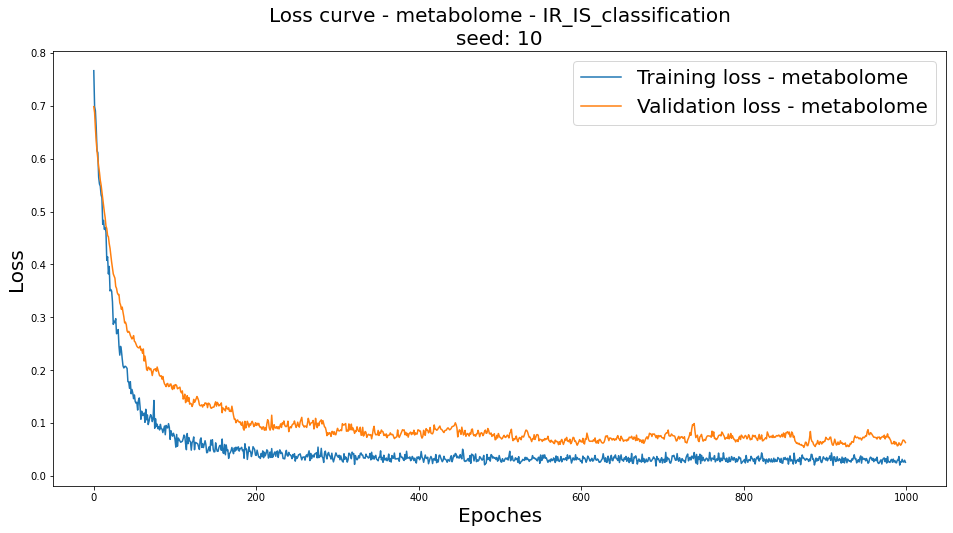


IR_IS_classification
n train: 382
n val: 81
n test: 84


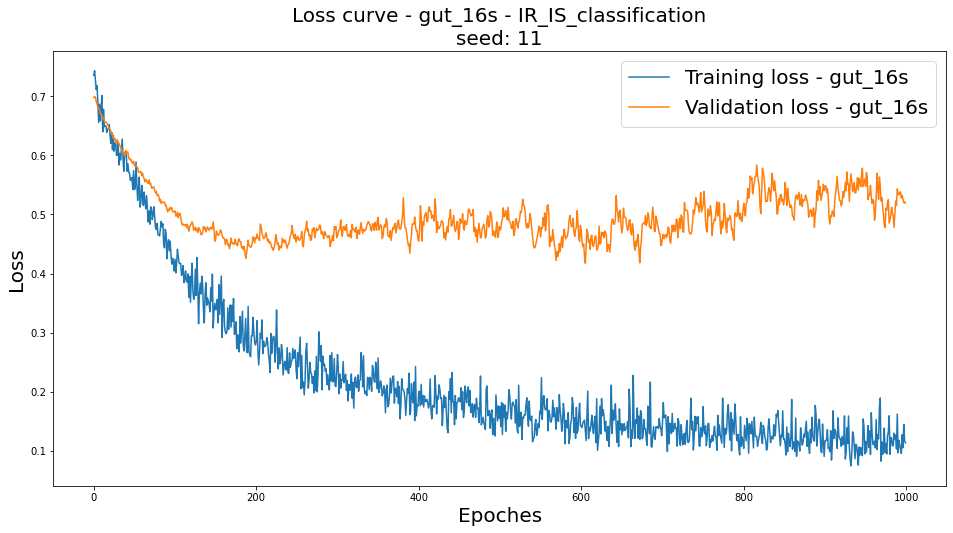

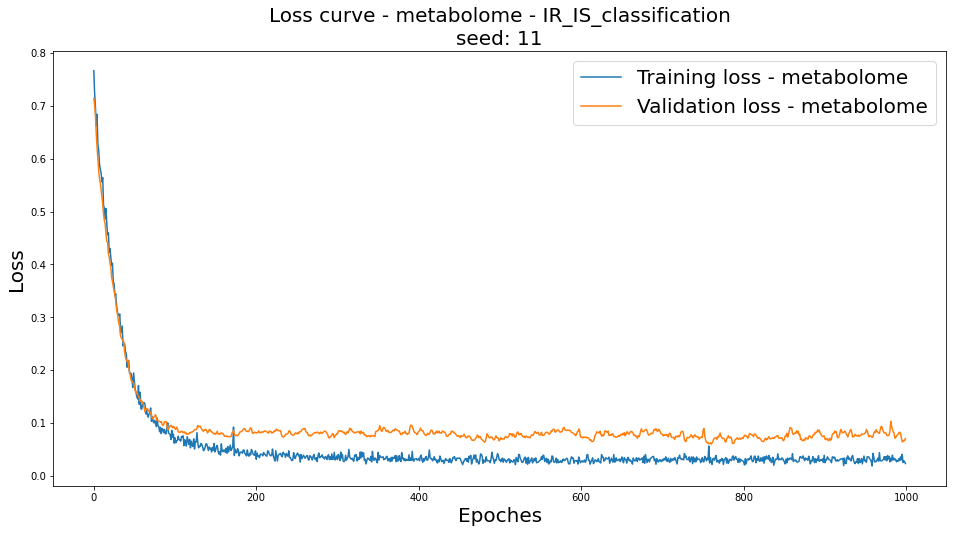


IR_IS_classification
n train: 382
n val: 81
n test: 84


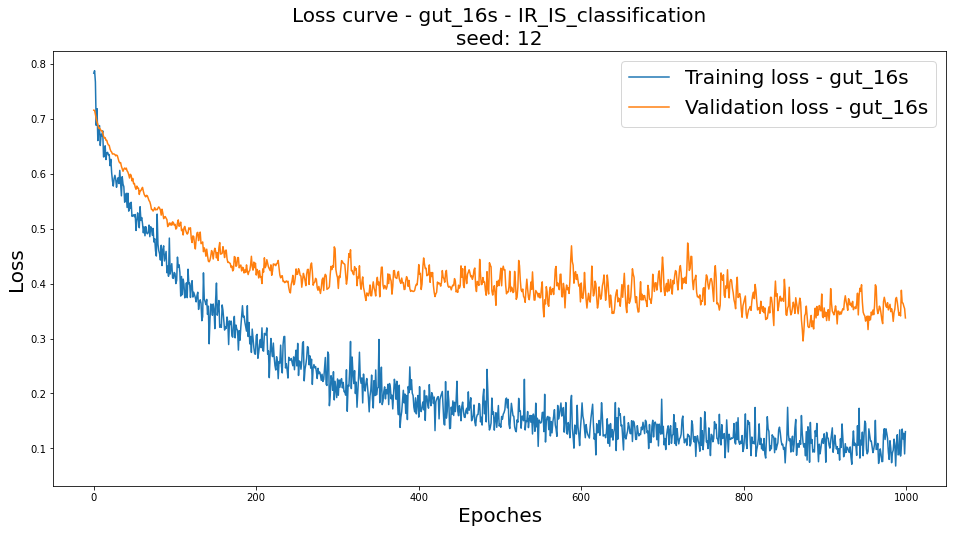

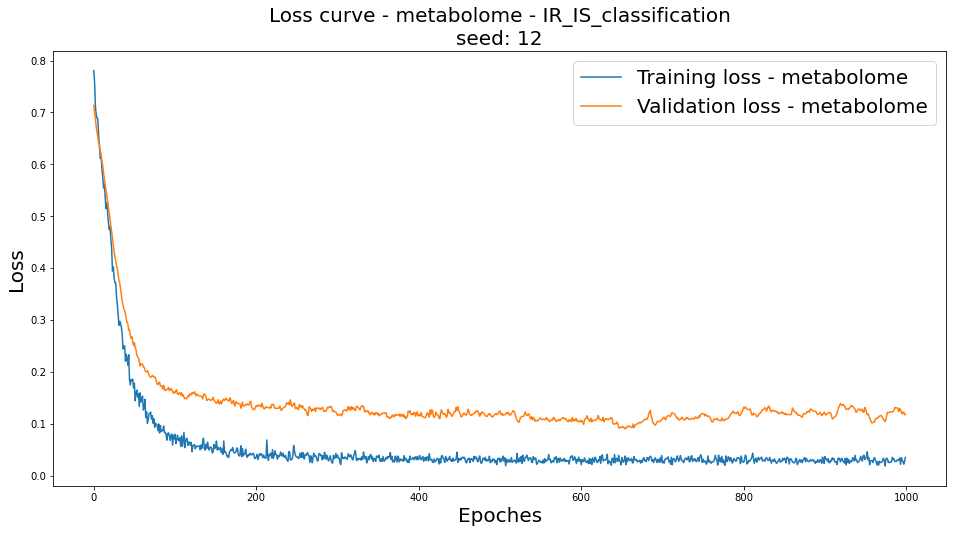

Covariate: IR_IS_classification
Prediction based on original microbiome data:


,Validation,Testing
1,86.42%,85.71%
2,79.01%,79.76%
3,74.07%,84.52%
4,80.25%,78.57%
5,82.72%,82.14%
6,83.95%,84.52%
7,87.65%,86.90%
8,81.48%,88.10%
9,81.48%,78.57%
10,83.95%,86.90%


------------------------------------------------------------------
Prediction based on original metabolome data:


,Validation,Testing
1,97.53%,95.24%
2,97.53%,94.05%
3,93.83%,97.62%
4,96.30%,96.43%
5,97.53%,97.62%
6,97.53%,98.81%
7,97.53%,94.05%
8,96.30%,97.62%
9,98.77%,100.00%
10,97.53%,98.81%


------------------------------------------------------------------

Sex
n train: 503
n val: 107
n test: 110


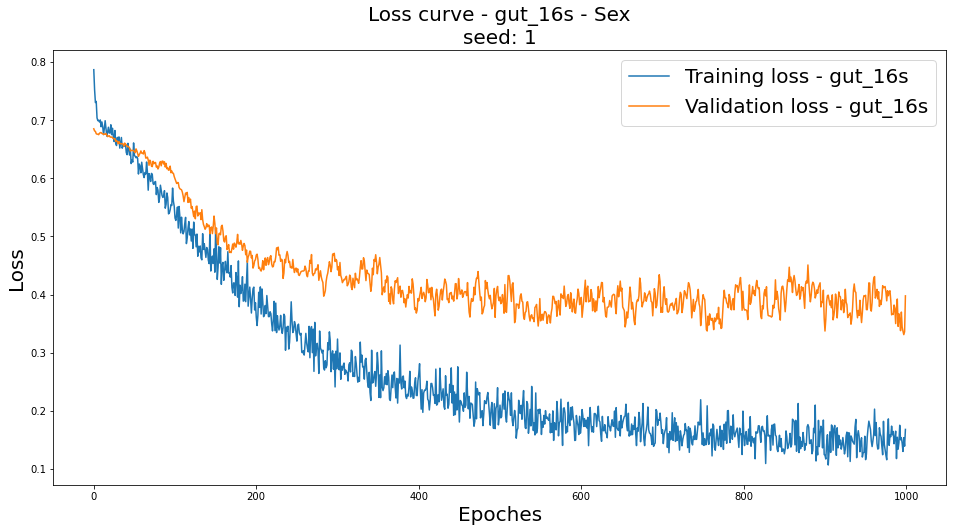

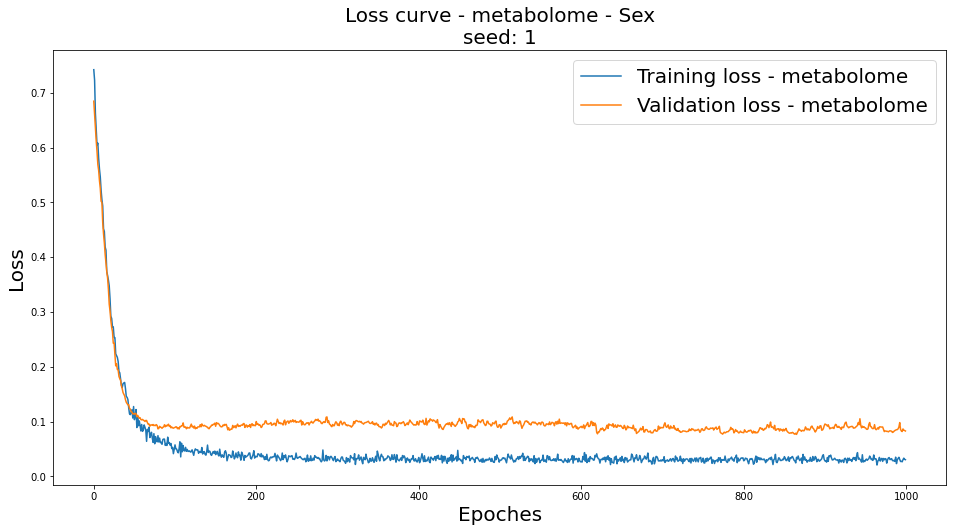


Sex
n train: 503
n val: 107
n test: 110


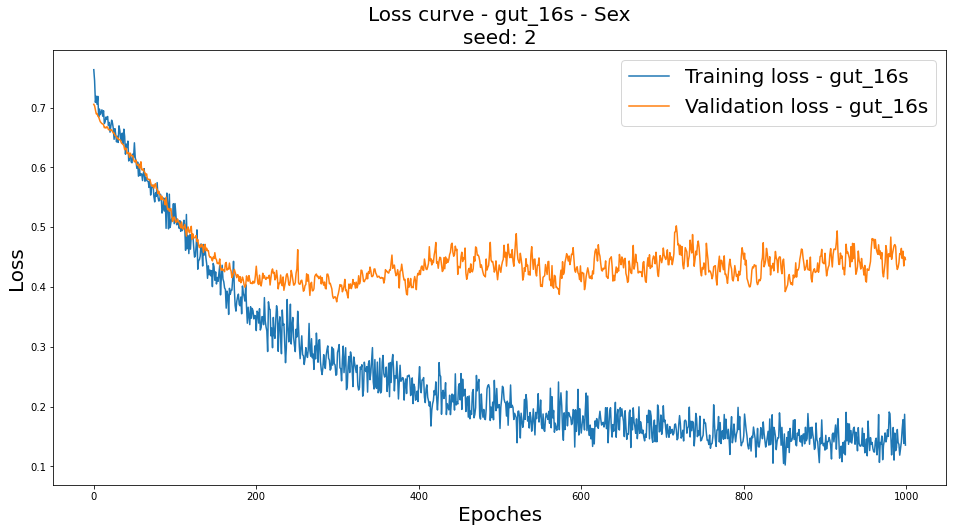

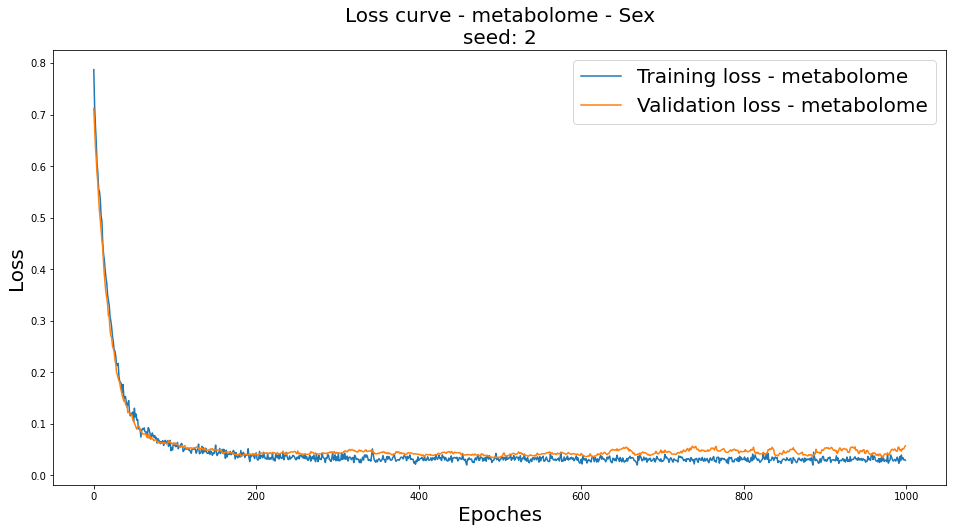


Sex
n train: 503
n val: 107
n test: 110


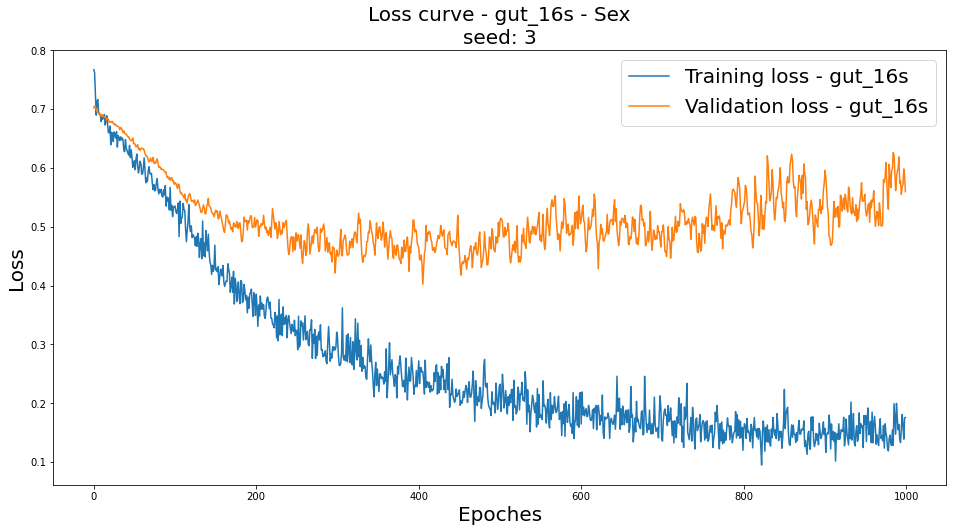

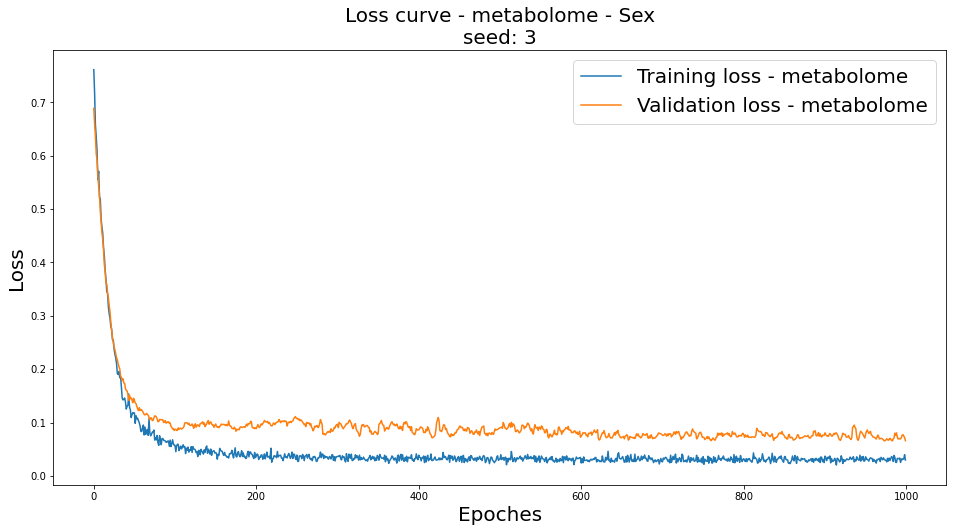


Sex
n train: 503
n val: 107
n test: 110


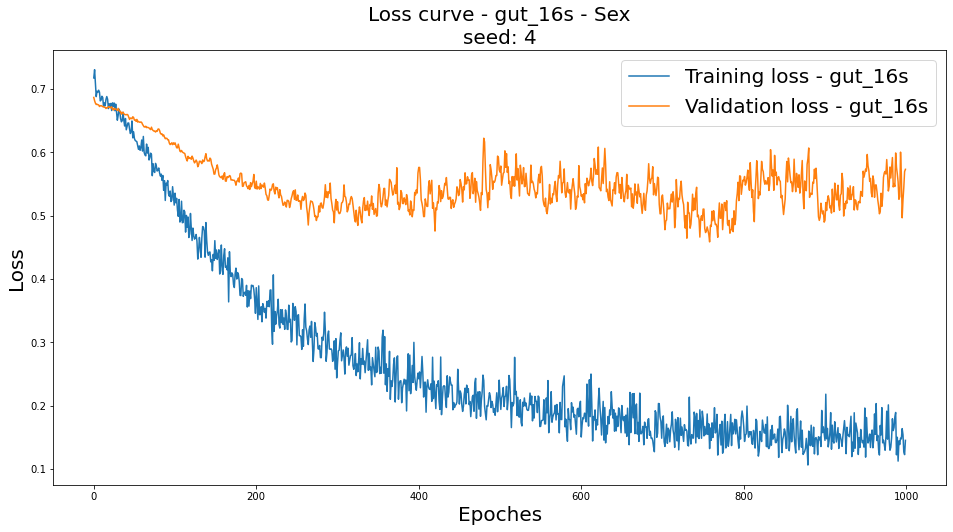

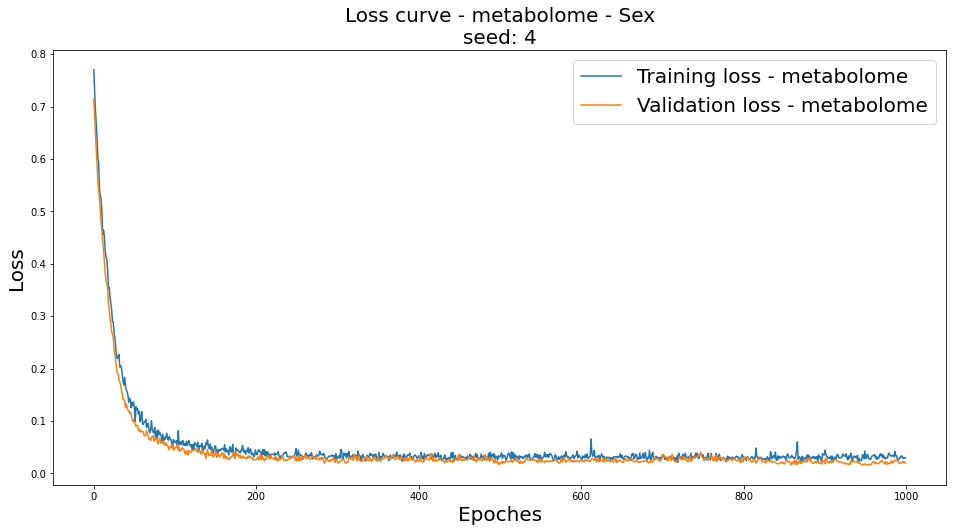


Sex
n train: 503
n val: 107
n test: 110


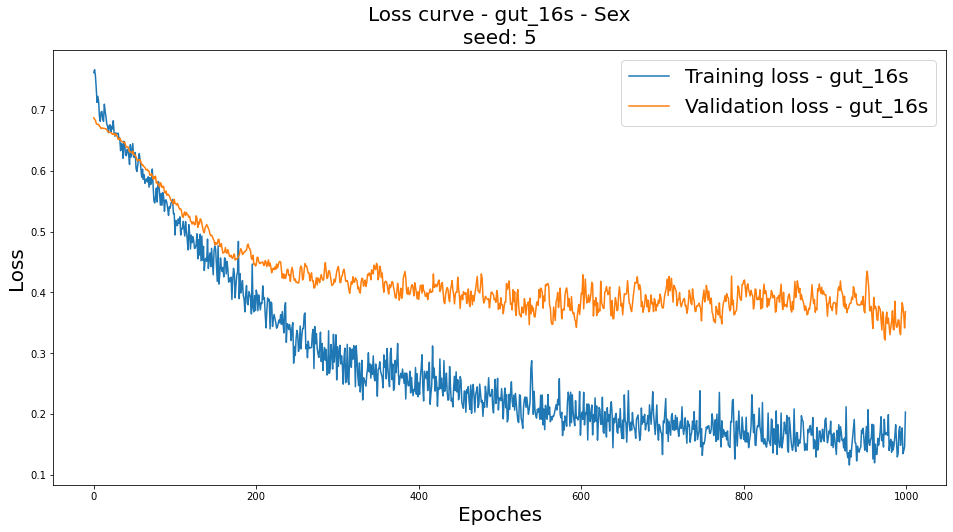

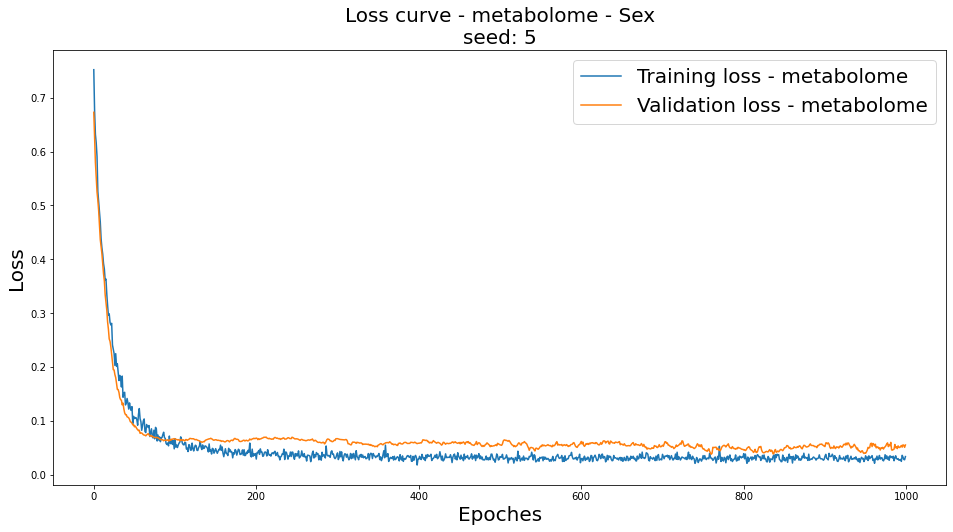


Sex
n train: 503
n val: 107
n test: 110


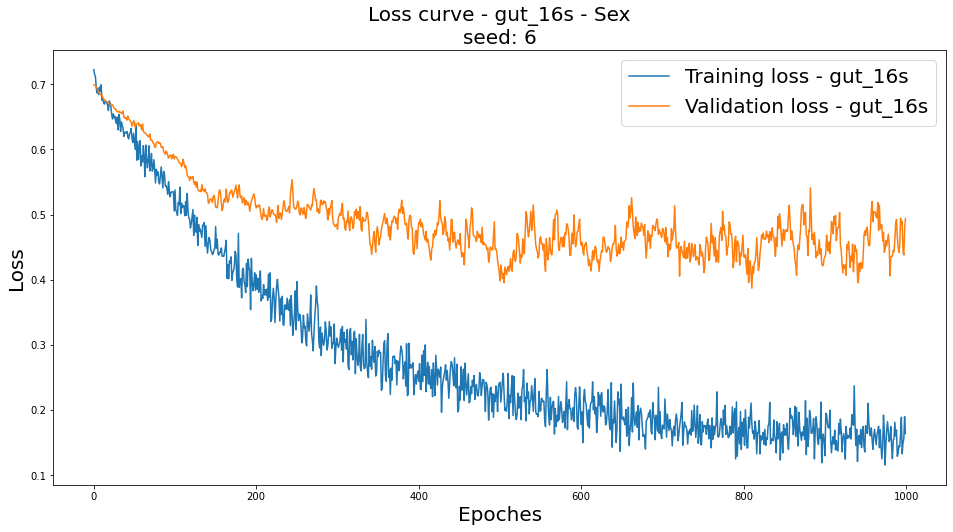

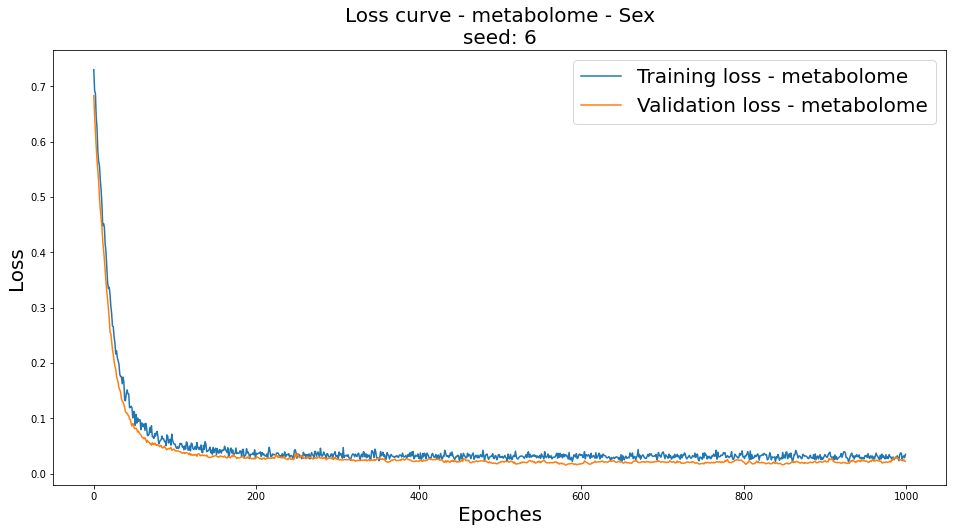


Sex
n train: 503
n val: 107
n test: 110


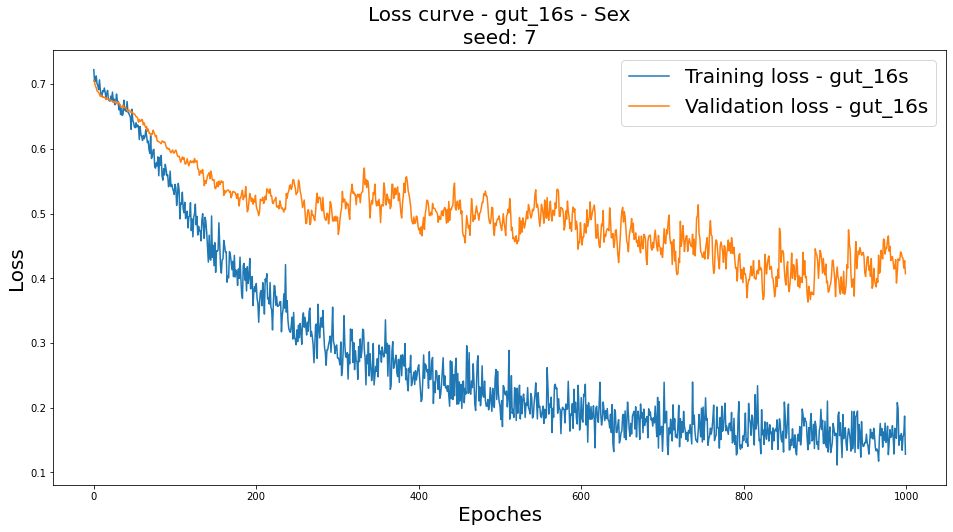

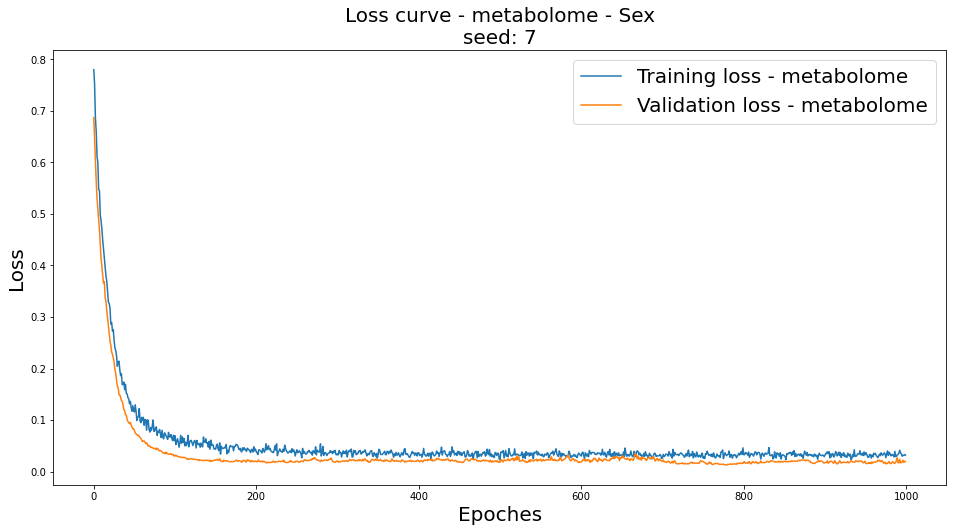


Sex
n train: 503
n val: 107
n test: 110


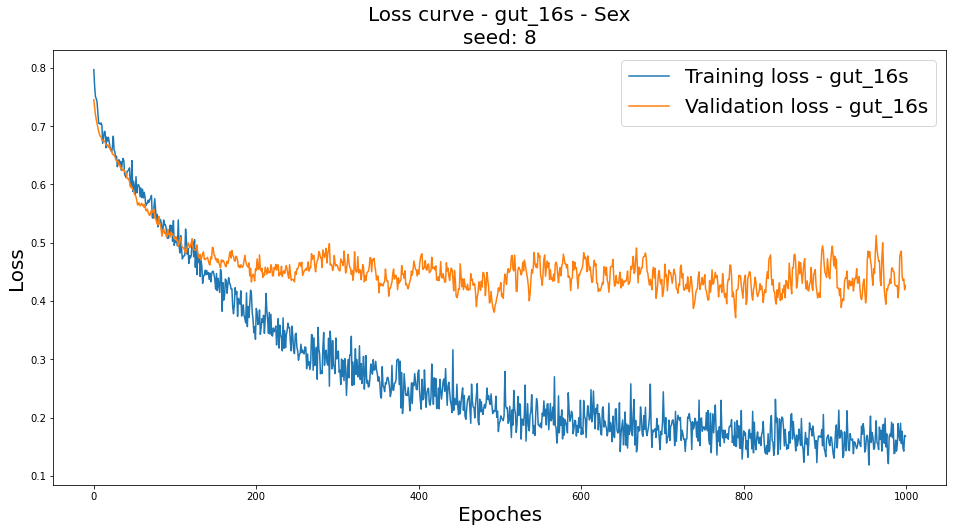

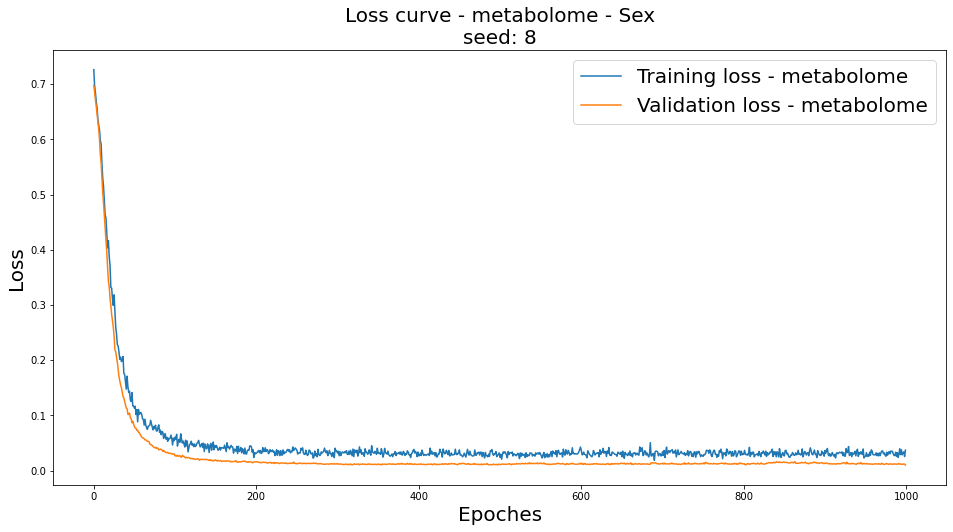


Sex
n train: 503
n val: 107
n test: 110


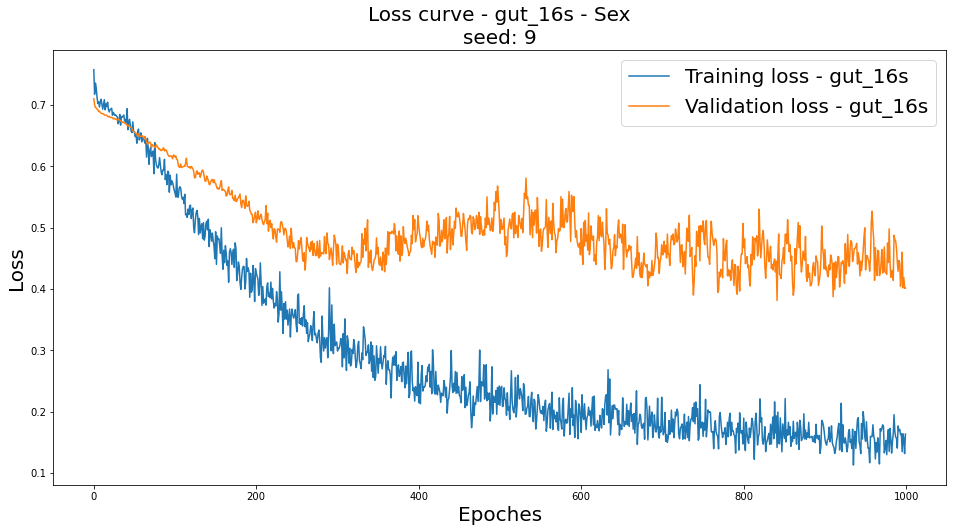

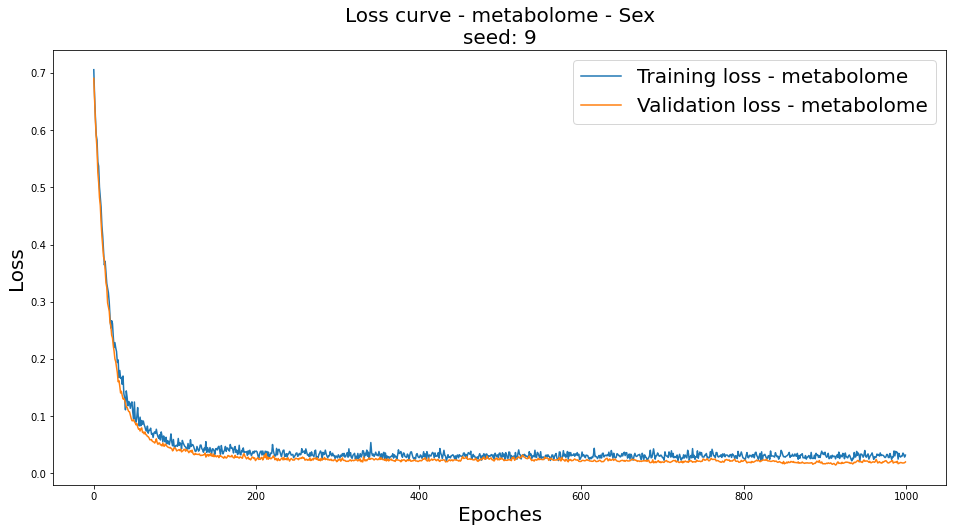


Sex
n train: 503
n val: 107
n test: 110


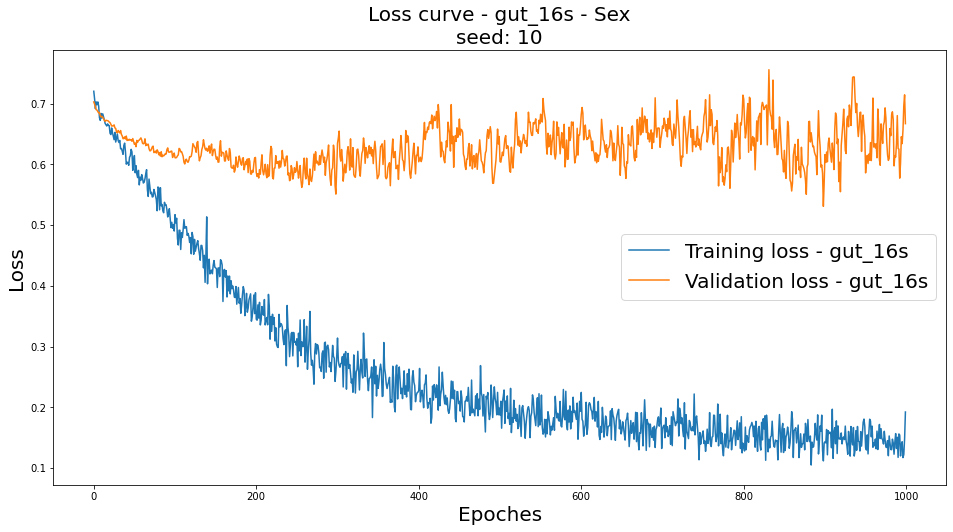

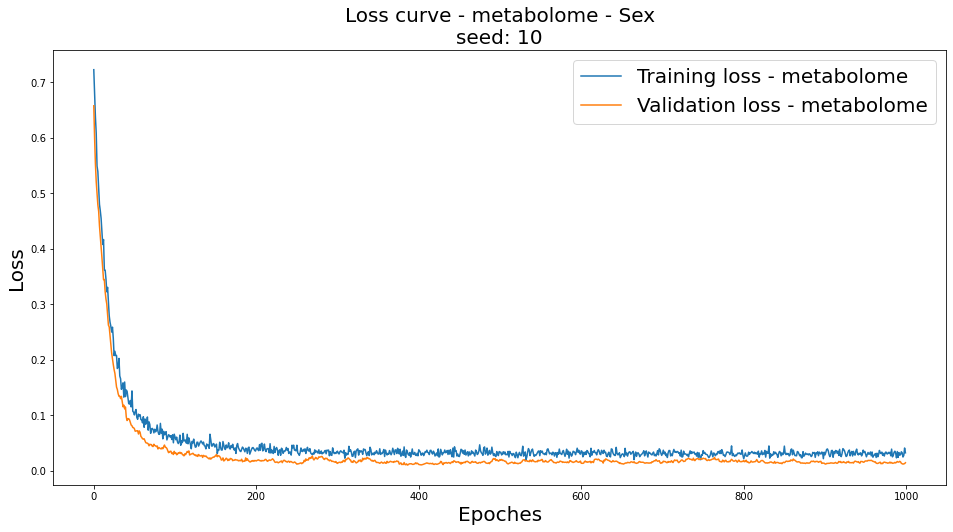


Sex
n train: 503
n val: 107
n test: 110


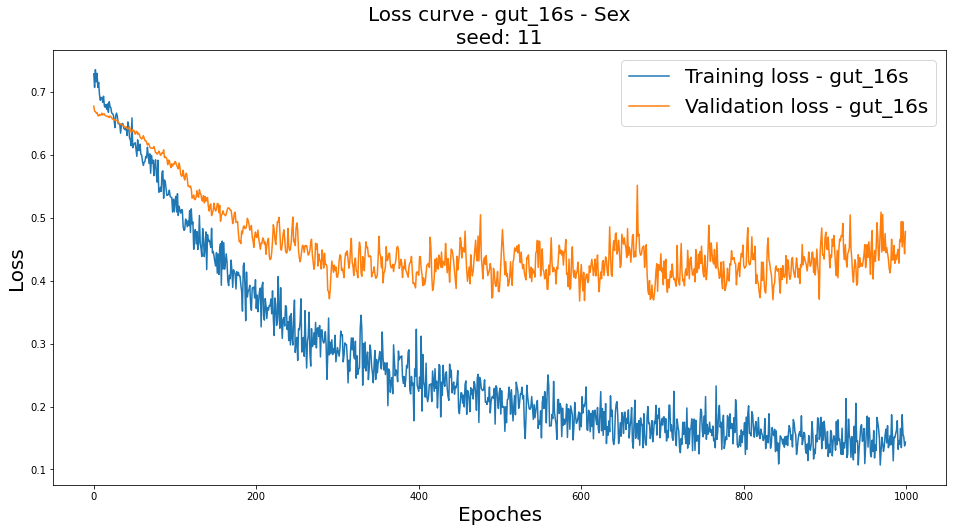

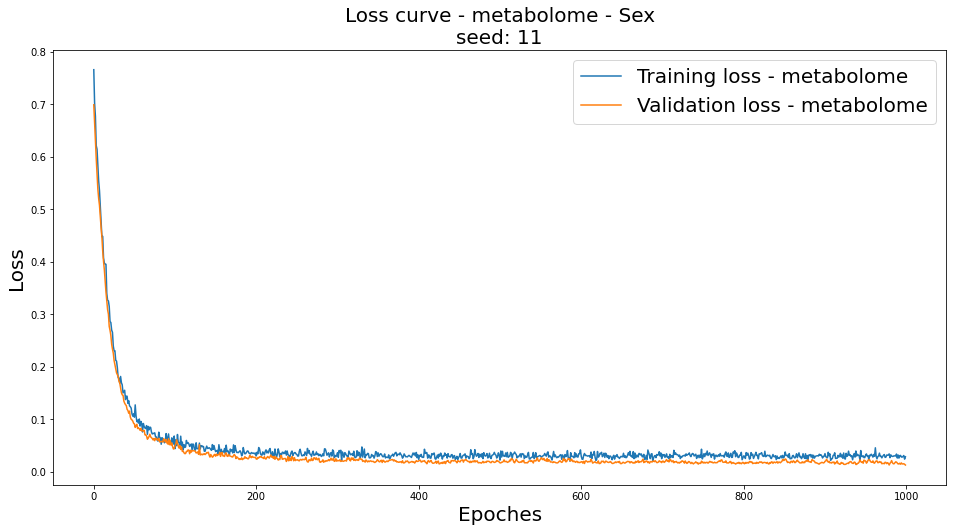


Sex
n train: 503
n val: 107
n test: 110


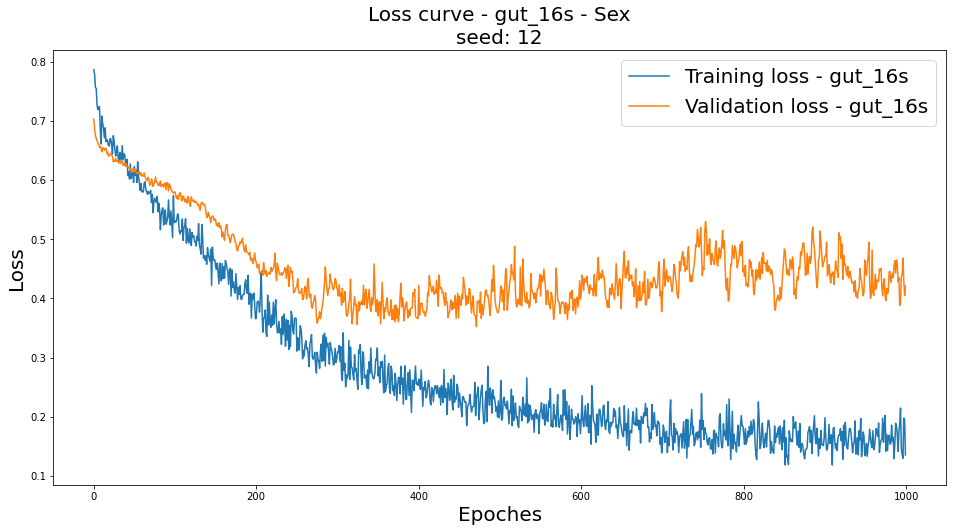

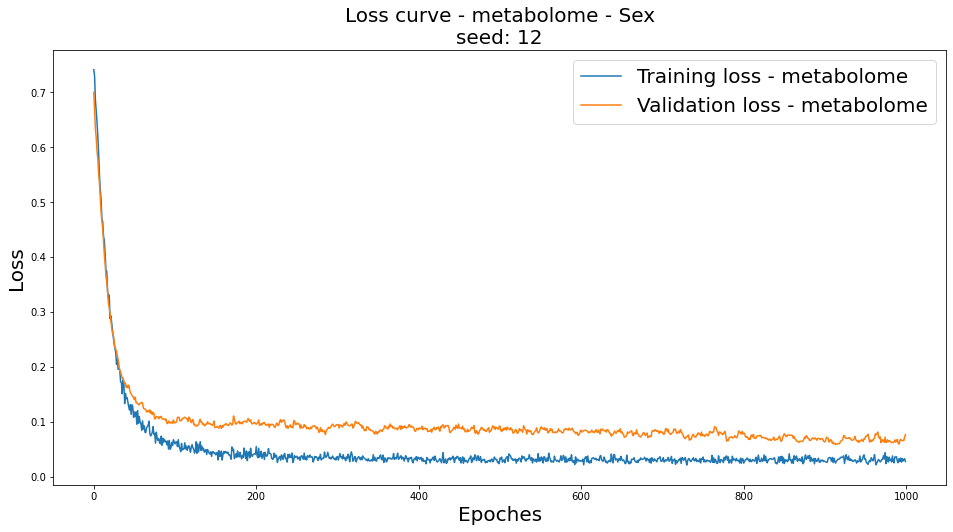

Covariate: Sex
Prediction based on original microbiome data:


,Validation,Testing
1,83.18%,76.36%
2,82.24%,78.18%
3,76.64%,77.27%
4,78.50%,77.27%
5,86.92%,82.73%
6,82.24%,80.00%
7,84.11%,83.64%
8,85.05%,71.82%
9,85.05%,79.09%
10,73.83%,78.18%


------------------------------------------------------------------
Prediction based on original metabolome data:


,Validation,Testing
1,98.13%,99.09%
2,97.20%,98.18%
3,99.07%,96.36%
4,100.00%,100.00%
5,98.13%,96.36%
6,100.00%,97.27%
7,100.00%,97.27%
8,100.00%,98.18%
9,100.00%,99.09%
10,100.00%,99.09%


------------------------------------------------------------------

Race
n train: 501
n val: 105
n test: 112


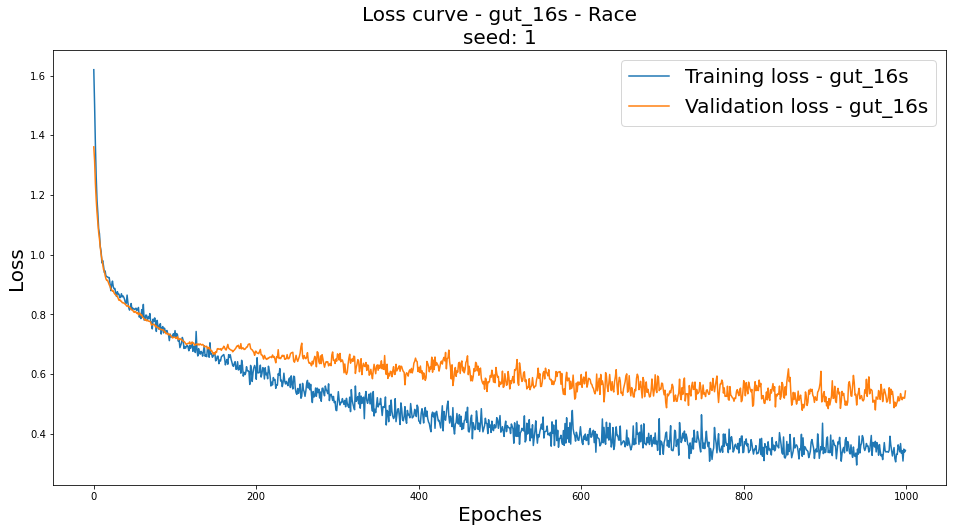

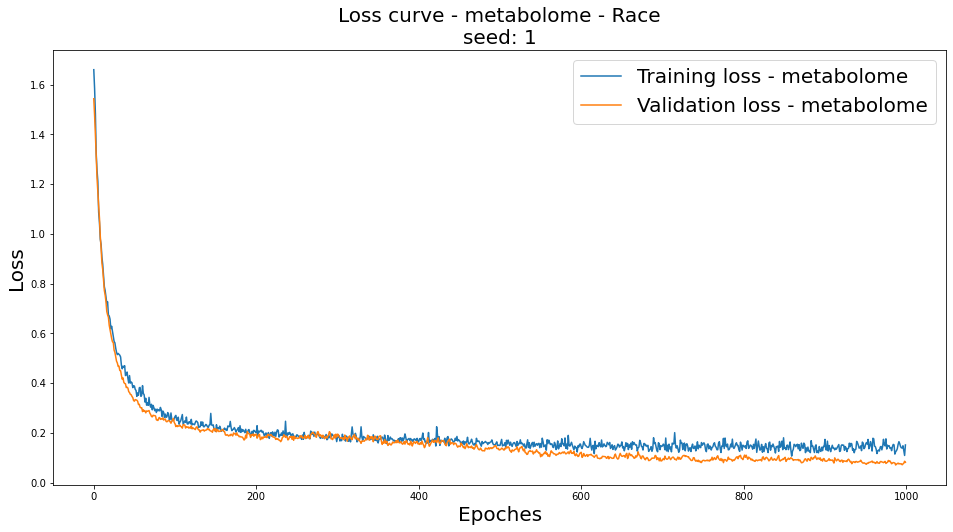


Race
n train: 501
n val: 105
n test: 112


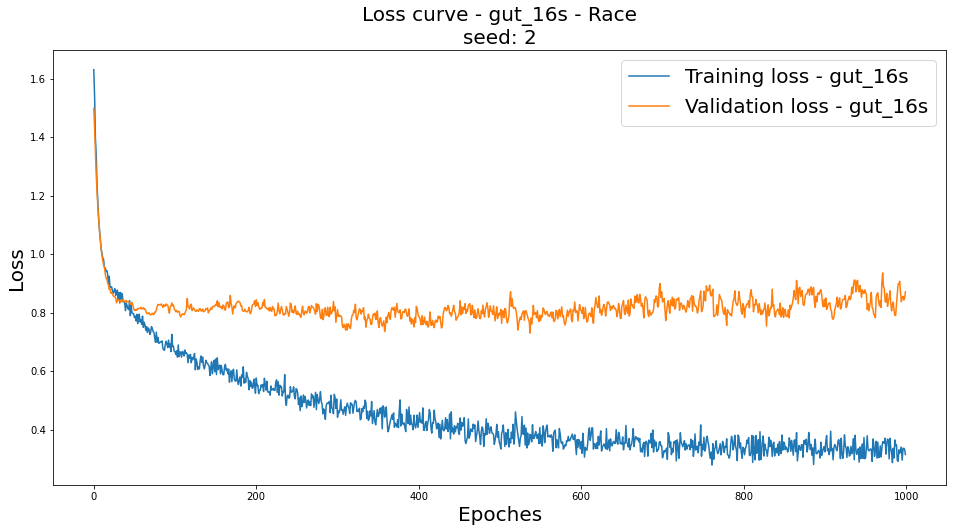

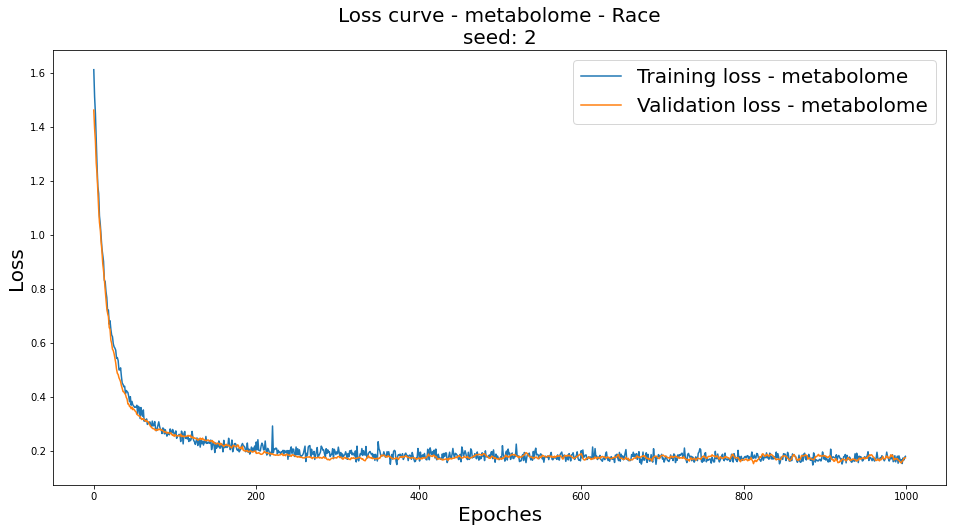


Race
n train: 501
n val: 105
n test: 112


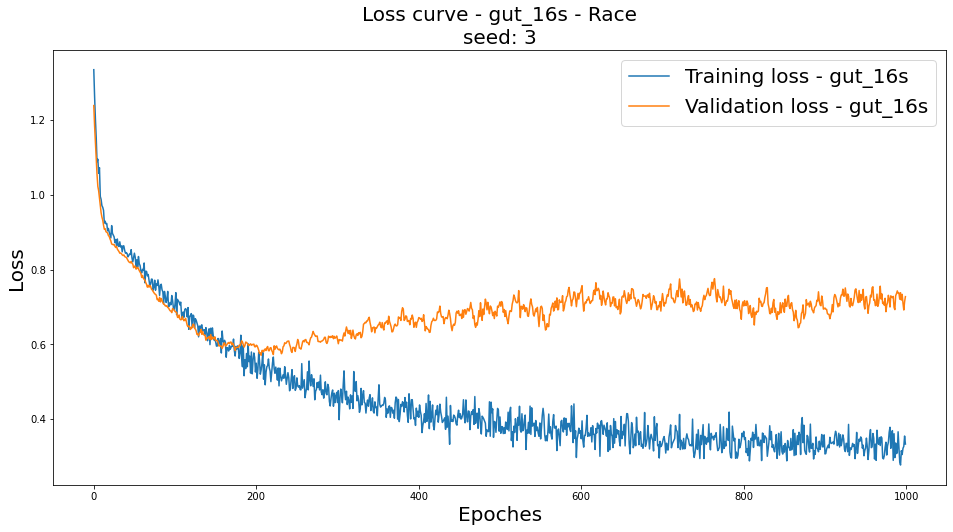

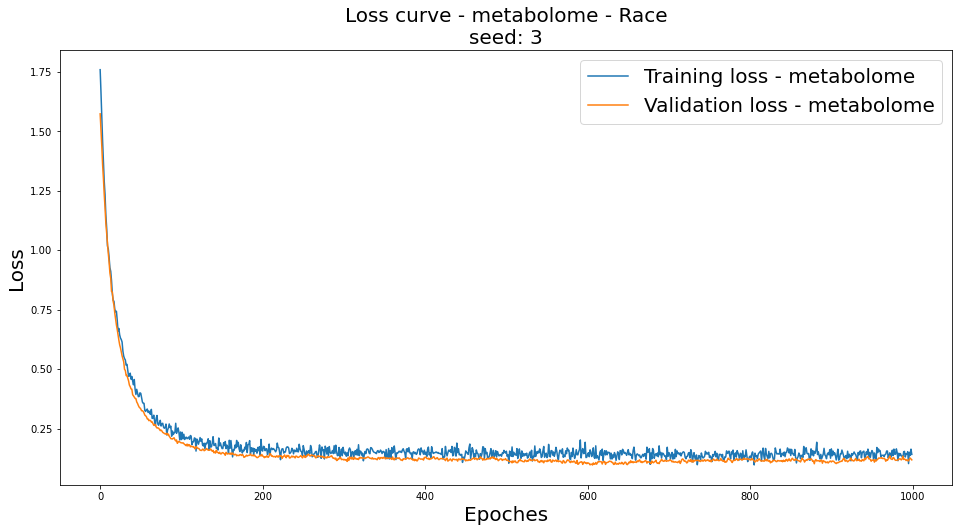


Race
n train: 501
n val: 105
n test: 112


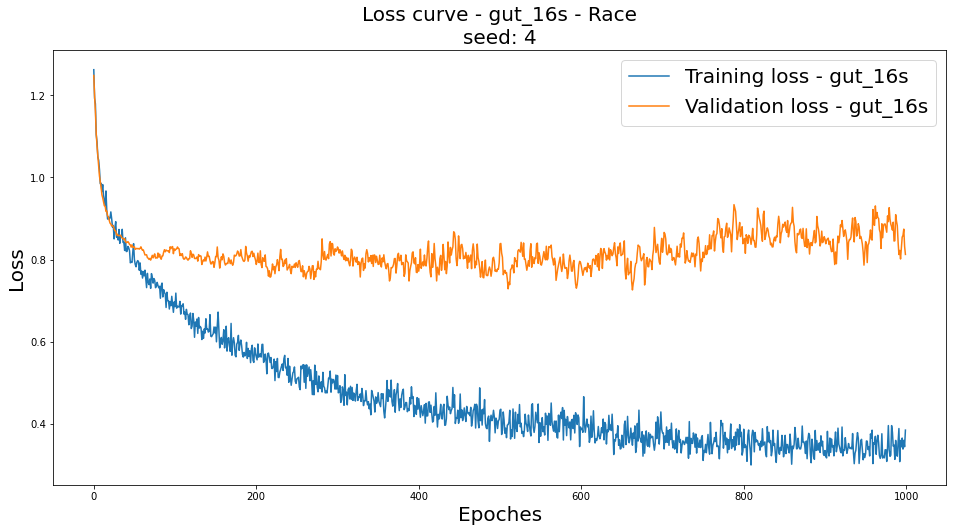

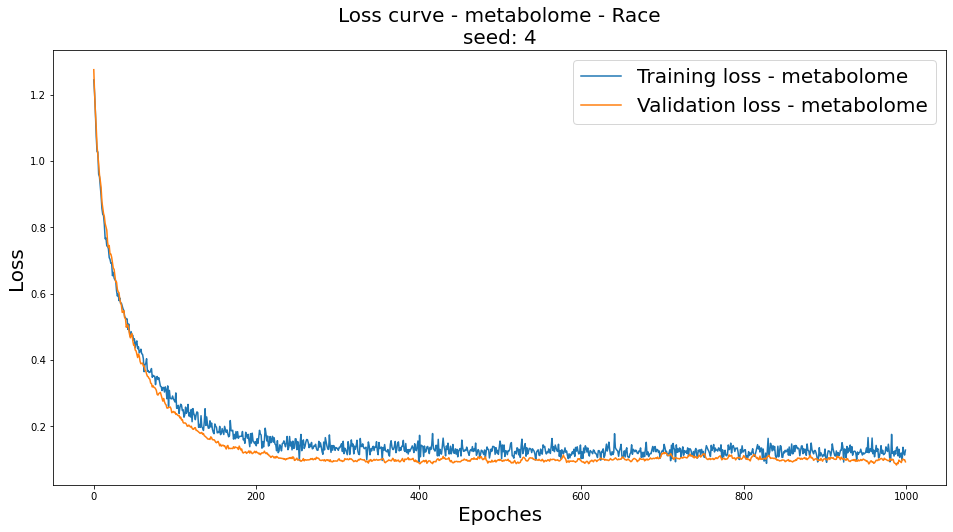


Race
n train: 501
n val: 105
n test: 112


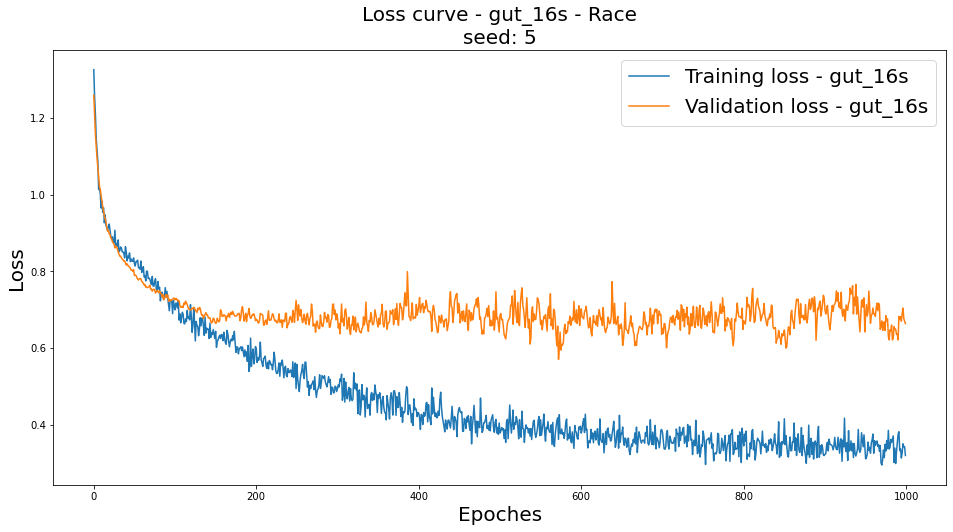

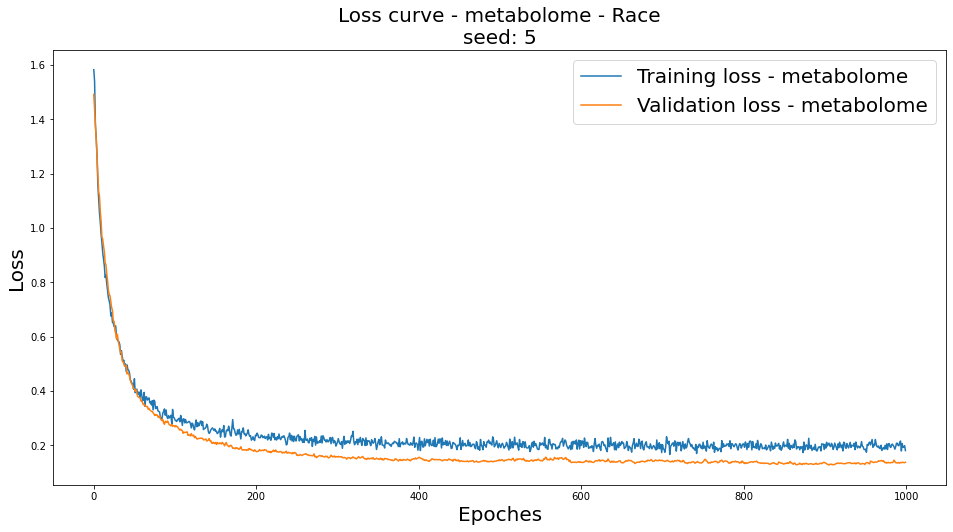


Race
n train: 501
n val: 105
n test: 112


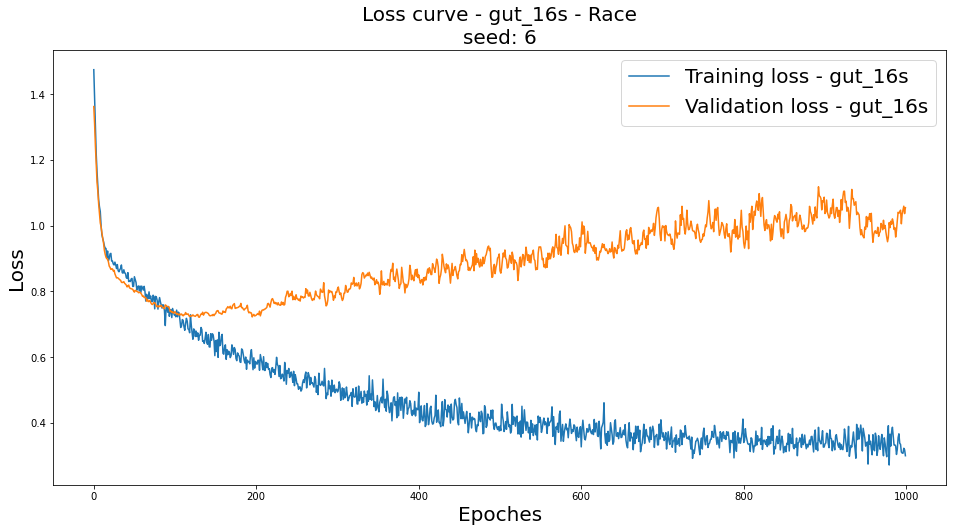

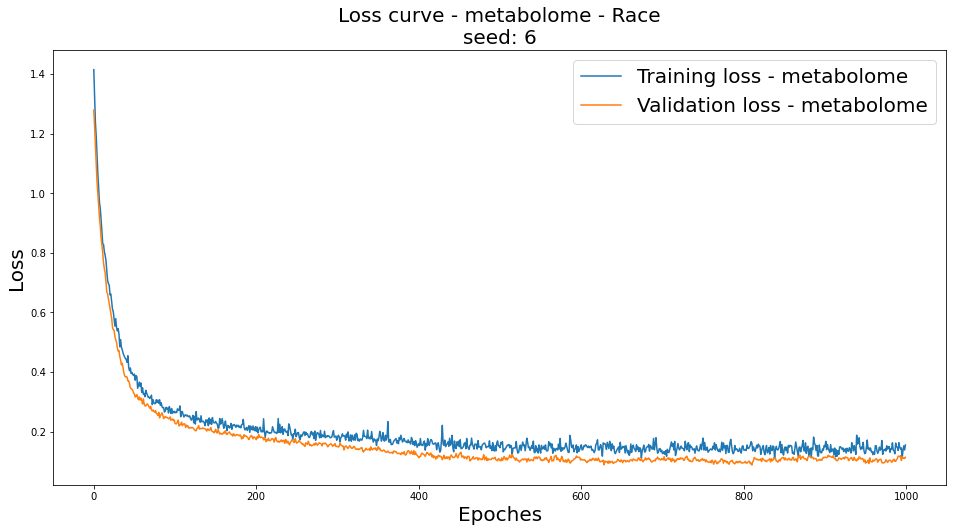


Race
n train: 501
n val: 105
n test: 112


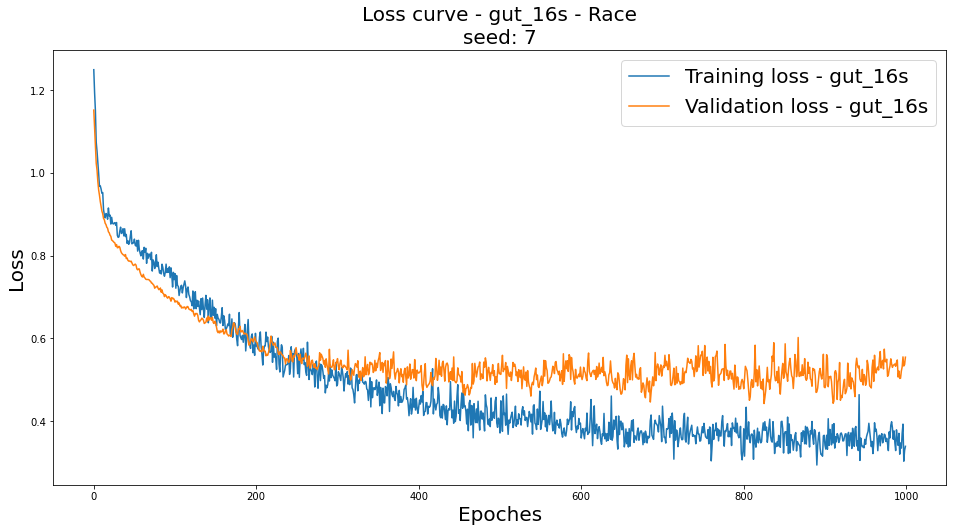

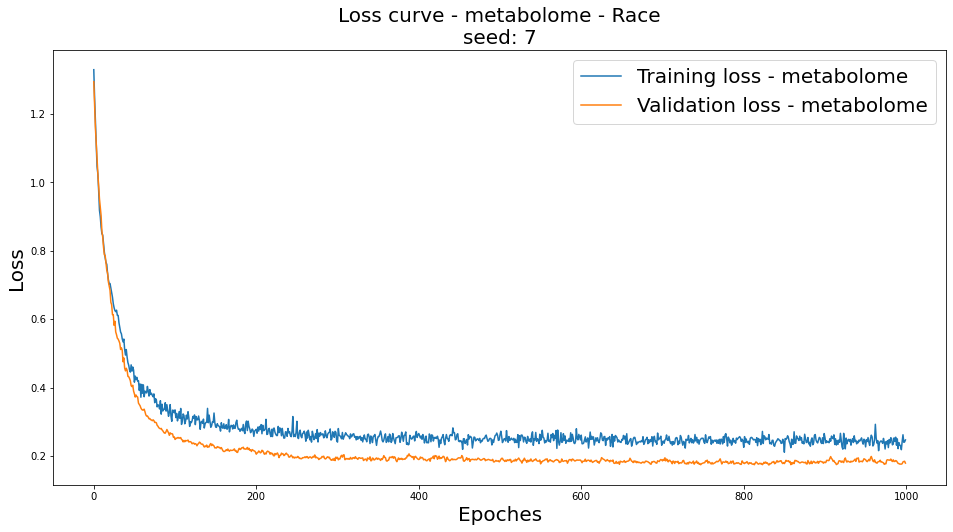


Race
n train: 501
n val: 105
n test: 112


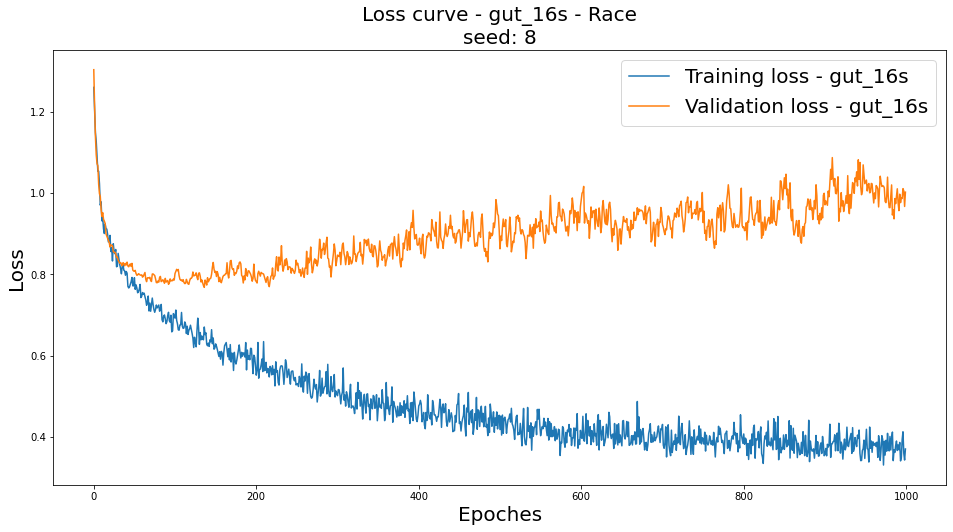

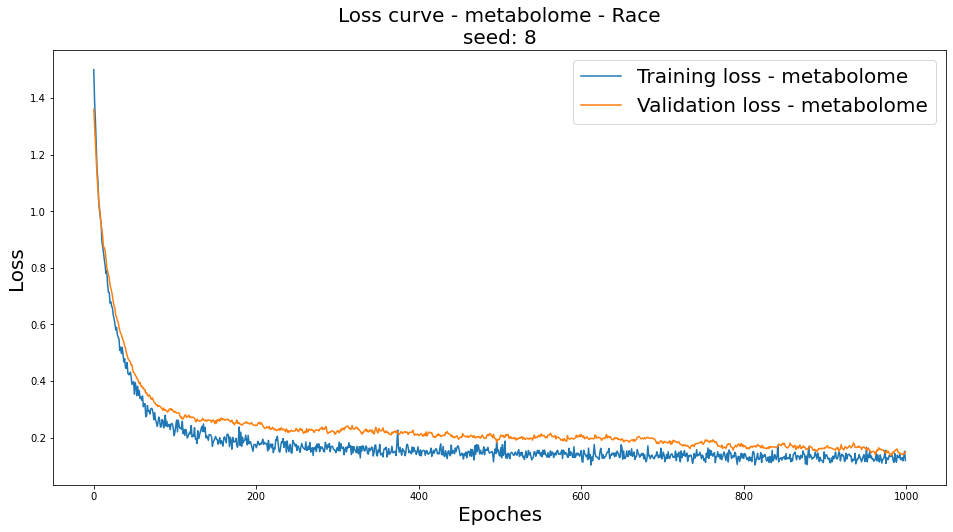


Race
n train: 501
n val: 105
n test: 112


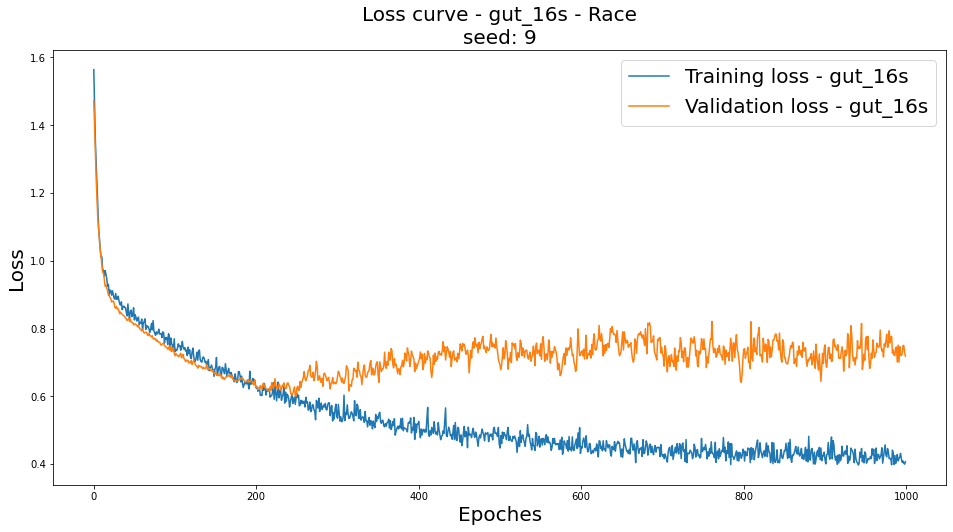

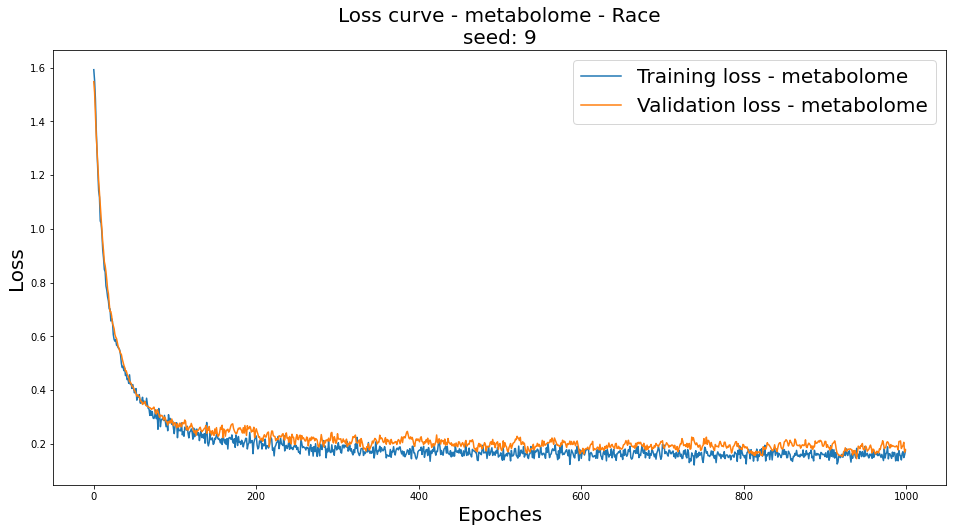


Race
n train: 501
n val: 105
n test: 112


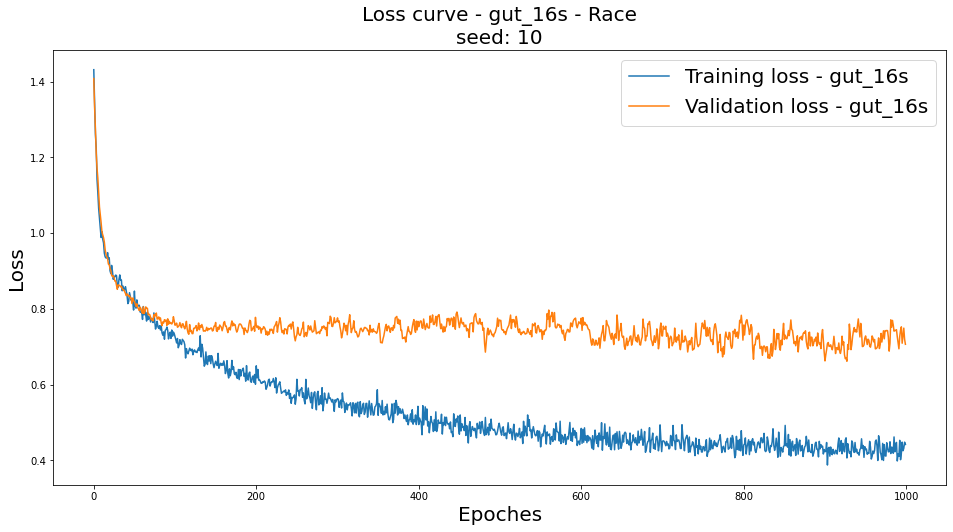

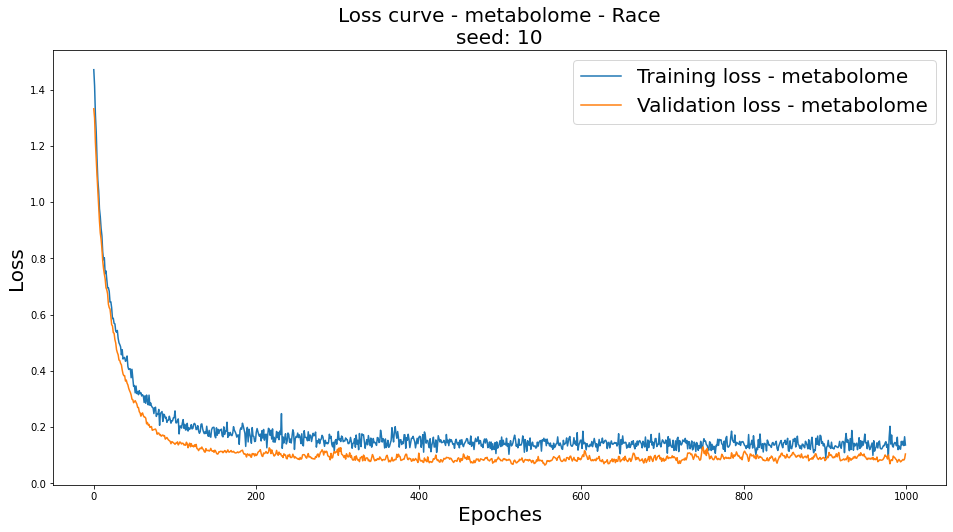


Race
n train: 501
n val: 105
n test: 112


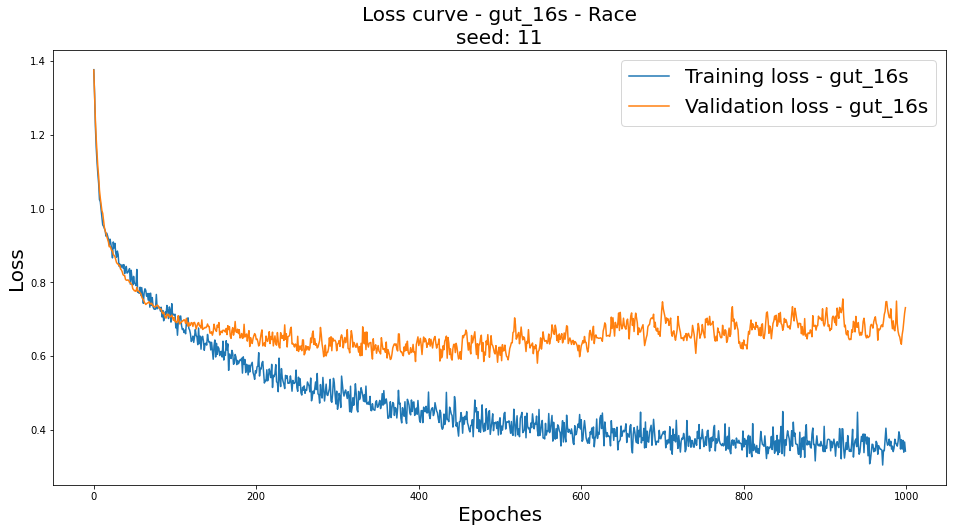

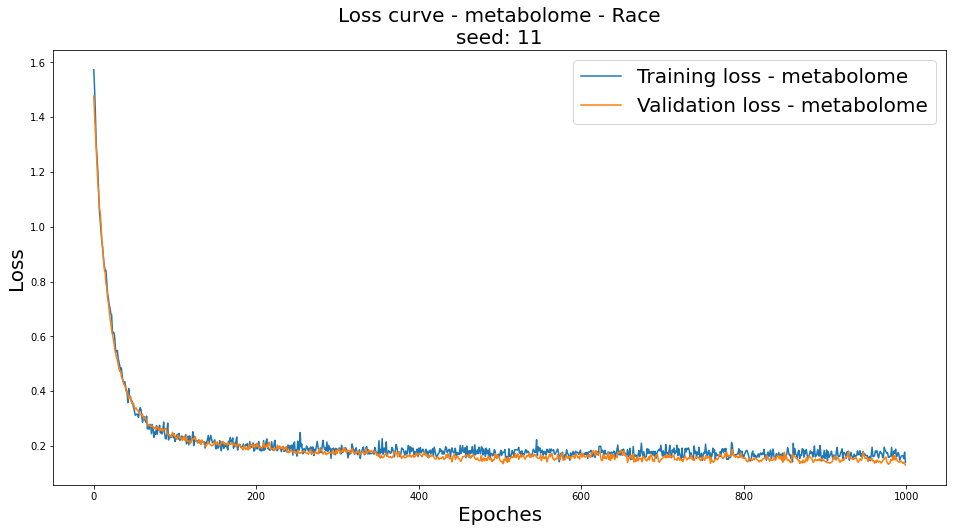


Race
n train: 501
n val: 105
n test: 112


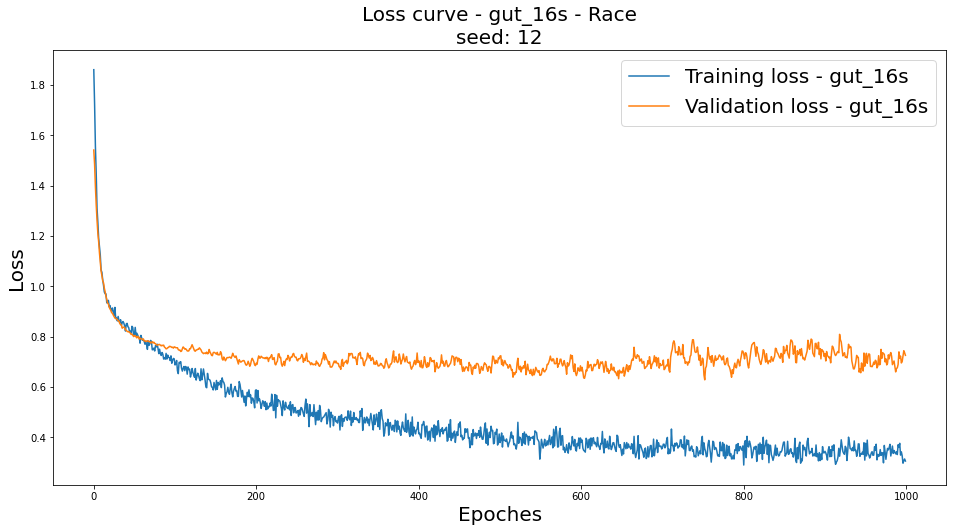

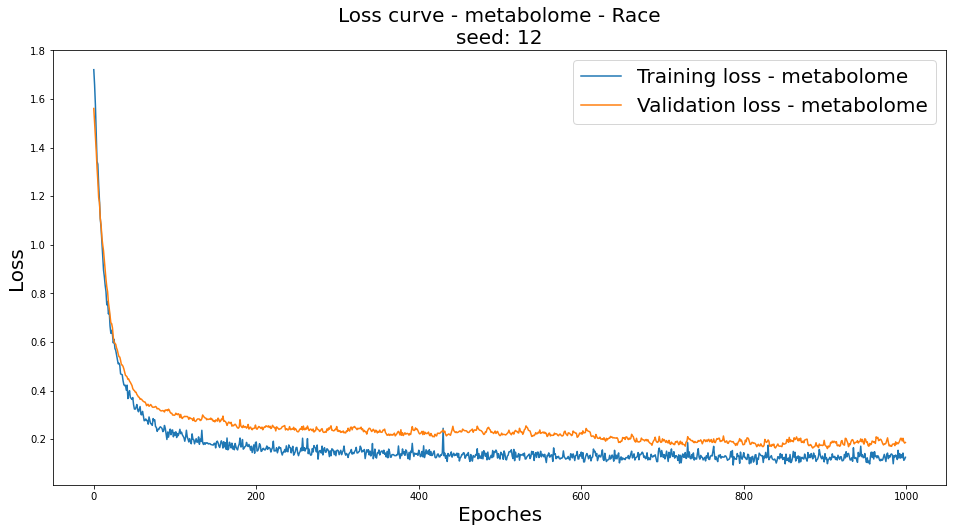

Covariate: Race
Prediction based on original microbiome data:


,Validation,Testing
1,80.95%,74.11%
2,75.24%,74.11%
3,83.81%,74.11%
4,78.10%,79.46%
5,81.90%,73.21%
6,67.62%,77.68%
7,81.90%,75.89%
8,74.29%,76.79%
9,78.10%,73.21%
10,77.14%,73.21%


------------------------------------------------------------------
Prediction based on original metabolome data:


,Validation,Testing
1,100.00%,100.00%
2,95.24%,91.07%
3,99.05%,96.43%
4,98.10%,96.43%
5,95.24%,93.75%
6,98.10%,99.11%
7,90.48%,82.14%
8,96.19%,97.32%
9,97.14%,96.43%
10,96.19%,97.32%


------------------------------------------------------------------
8762.340307712555
CPU times: user 2h 25min 8s, sys: 35.9 s, total: 2h 25min 44s
Wall time: 2h 26min 2s


In [15]:
%%time
start_time = time.time()
covariate_list = ['IR_IS_classification', 'Sex', 'Race']

multi_omics_dict = {'gut_16s': gut_16s_df, 'metabolome': metabolome_df}
net_dict = {"gut_16s": [gut_16s_df.shape[1], 64, 16, 10], 
            "metabolome": [metabolome_df.shape[1], 256, 64, 10]}

microbiome_accuracy_original_dict, metabolome_accuracy_original_dict = dict(), dict()

for covariate in covariate_list:
    dropout = dropout_list[max_idx[covariate][0]]
    weight_decay = weight_decay_list[max_idx[covariate][1]]
    
    microbiome_valtest_accuracy_original = pd.DataFrame(index=random_seed_list, columns=['Validation', 'Testing'])
    metabolome_valtest_accuracy_original = pd.DataFrame(index=random_seed_list, columns=['Validation', 'Testing'])
    for s, seed in enumerate(random_seed_list):
        MLP_original = MultilayerPerceptron(covariate=covariate, indexes=indexes, 
                                   multi_omics_dict=multi_omics_dict, df_with_covariates=gut_16s_df_subj, 
                                   device=DEVICE,root_folder=SAVE_FOLDER, random_seed=seed)
        MLP_original.initialize(net_dict=net_dict)
        MLP_original.train_mlp(n_epoch=N_EPOCH, print_hist=False)
        MLP_original.plot_training()
        prediction_by_seed = MLP_original.predict()
        microbiome_valtest_accuracy_original.loc[seed,:] = [prediction_by_seed['gut_16s']['val'][0],
                                                  prediction_by_seed['gut_16s']['test'][0]]
        metabolome_valtest_accuracy_original.loc[seed,:] = [prediction_by_seed['metabolome']['val'][0],
                                                  prediction_by_seed['metabolome']['test'][0]]
        
    print('Covariate:', covariate)
    print('Prediction based on original microbiome data:')
    display(microbiome_valtest_accuracy_original.style.format(formatter="{:.2%}"))
    print('------------------------------------------------------------------')
    print('Prediction based on original metabolome data:')
    display(metabolome_valtest_accuracy_original.style.format(formatter="{:.2%}"))
    print('------------------------------------------------------------------')
            
    microbiome_accuracy_original_dict[covariate] = microbiome_valtest_accuracy_original
    metabolome_accuracy_original_dict[covariate] = metabolome_valtest_accuracy_original

import pickle
with open(os.path.join(SAVE_FOLDER, 'microbiome_accuracy_original_dict.pkl'), 'wb') as f:
    pickle.dump(microbiome_accuracy_original_dict, f)

with open(os.path.join(SAVE_FOLDER, 'metabolome_accuracy_original_dict.pkl'), 'wb') as f:
    pickle.dump(metabolome_accuracy_original_dict, f)
    
end_time = time.time()
print(end_time - start_time)

### Mean accuracy

In [16]:
SAVE_FOLDER = './save_MLP/original_seed_1-12'

In [17]:
with open(os.path.join(SAVE_FOLDER, 'microbiome_accuracy_original_dict.pkl'), 'rb') as f:
    microbiome_accuracy_original_dict = pickle.load(f)

In [18]:
microbiome_accuracy_original_df = pd.DataFrame(index=covariate_list, columns=['Validation', 'Testing'])
for covariate in covariate_list:
    microbiome_accuracy_original_df.loc[covariate,:] = \
        np.mean(microbiome_accuracy_original_dict[covariate], axis=0)
    
display(microbiome_accuracy_original_df.style.format(formatter="{:.2%}"))

,Validation,Testing
IR_IS_classification,82.61%,83.73%
Sex,81.70%,78.94%
Race,77.62%,75.60%


## Result presentation

### Boxplots 

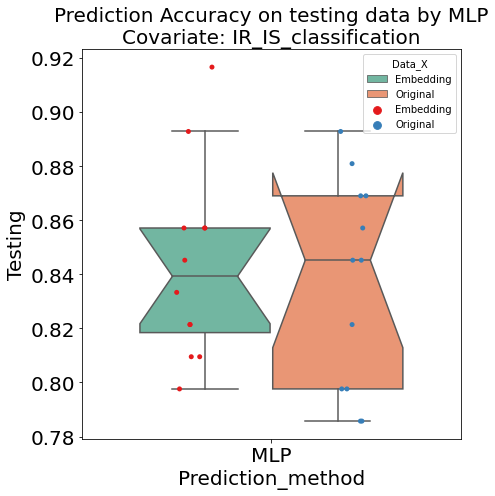

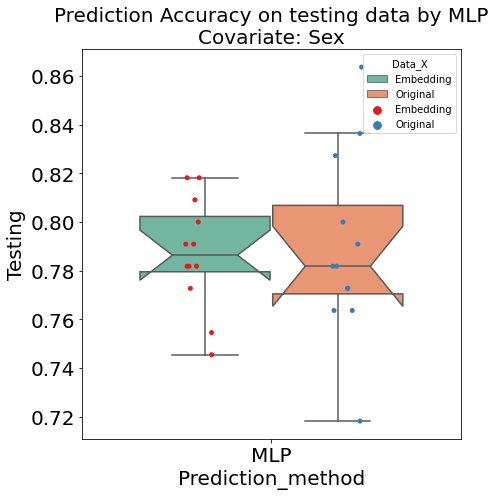

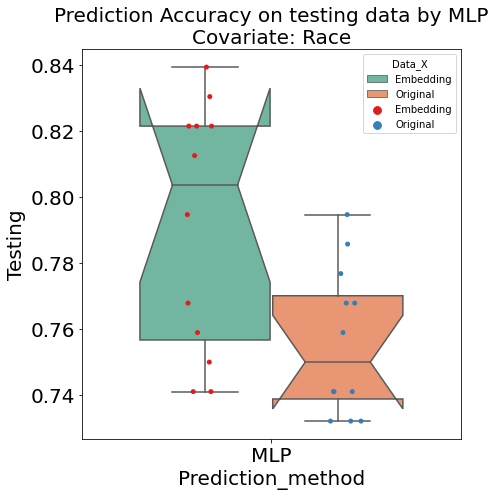

In [19]:
fontsize = 20
for covariate in covariate_list:
    accuracy_df = pd.concat([microbiome_accuracy_embedding_dict[covariate],
                            microbiome_accuracy_original_dict[covariate]], axis=0, ignore_index=True)
    accuracy_df['Data_X'] = ['Embedding'] * 12 + ['Original'] * 12
    accuracy_df['Prediction_method'] = ['MLP']*24
    import seaborn as sns
    import matplotlib.pyplot as plt

    fig, ax = plt.subplots(figsize=(6,6))
    plt.tight_layout()
    ax = sns.boxplot(x='Prediction_method', y='Testing', data=accuracy_df, hue='Data_X', 
                     notch=True, palette='Set2', width=0.7, showfliers = False)
    ax = sns.stripplot(x='Prediction_method', y='Testing', data=accuracy_df, hue='Data_X',
                       jitter=True, dodge=True, marker='o', palette='Set1')
    ax.set_title('{}\nCovariate: {}'.format('Prediction Accuracy on testing data by MLP', covariate), fontsize=fontsize)
    ax.tick_params(axis='both', labelsize=fontsize)
    ax.xaxis.get_label().set_fontsize(fontsize)
    ax.yaxis.get_label().set_fontsize(fontsize)
    plt.show()